In [147]:
%reset -f
%load_ext autoreload
%autoreload 2

import os
import time
import sys
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import glob
import math
from sklearn.linear_model import LinearRegression
import figurefirst as fifi
sys.path.append('../utils_2')
import figure_functions as ff
from pybounds import SlidingEmpiricalObservabilityMatrix, SlidingFisherObservability, colorline
sys.path.append('../model')
from drone_model_with_PWM import DroneSimulator
from drone_model_with_PWM import DroneModel
from drone_model_with_PWM import DroneParameters
sys.path.append('../EKF')
from ekf import ekf as EKF
import pynumdiff
from scipy import signal
sys.path.append('../trajectories')
from trajectory_gen import TrajectoryGenerator
from IPython.display import display,SVG
# from drone_model_body_level import DroneSimulator

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Import Data

In [157]:
condition = 'flying' #['walking', 'flying']
motif = 'p2p_con_yaw' #['p2p', 'p2p_con_yaw', 'acc', 'sine']
path = '/home/austinlopez/Drone_AFRL/CSV/BIG_BUG_DATA'
all_files = glob.glob(path + "/" + condition + "/" + motif + "/*.csv")
data = {}
for filename in all_files:
    df = pd.read_csv(filename,index_col=None,header=0)
    # set data dictionary based on filename after the string '__'
    key = filename.split('__')[-1].split('.')[0]
    # remove the next 18 characters from the key name then replace '_slash_' with '/'
    key = key[6:].replace('_slash_', '/')
    data[key] = df

for key in data.keys():
    print(key)

mavros/imu/data_raw
trisonica_body_level
mavros/imu/mag
trisonica_global
optic_flow/camera/mean/y
mavros/imu/data
mavros/local_position/velocity_local
mavros/rc/in
mavros/local_position/pose
optic_flow/wind_sensor/mean/y
mavros/setpoint_raw/local
optic_flow/wind_sensor/mean/x
optic_flow/global/mean/x
trisonica
mavros/rc/out
optic_flow/camera/mean/x
optic_flow/global/mean/y
rosout
mavros/vision_pose/pose
mavros/local_position/velocity_body


# useful functions to have

In [158]:
def quaternion_to_euler(x, y, z, w):
    """
    input: x, y, z, w
    output: R, P, Y
    """
    t0 = +2.0 * (w * x + y * z)
    t1 = +1.0 - 2.0 * (x * x + y * y)
    R = math.degrees(math.atan2(t0, t1))

    t2 = +2.0 * (w * y - z * x)
    t2 = +1.0 if t2 > +1.0 else t2
    t2 = -1.0 if t2 < -1.0 else t2
    P = math.degrees(math.asin(t2))

    t3 = +2.0 * (w * z + x * y)
    t4 = +1.0 - 2.0 * (y * y + z * z)
    Y = math.degrees(math.atan2(t3, t4))

    return R, P, Y

# function that interpolates data based on two time arrays using numpy
def interpolate_data(time1, data1, time2):
    """
    input: time1 (interp from), data1 (interp from), time2 (interp to)
    output: interpolated data2
    """
    return np.interp(time2, time1, data1)

# function that takes in data frame and gives out time array based on the columns secs and nsecs
def time_array(data):
    "input: data frame with columns secs and nsecs"
    "output: array of time in seconds"
    time = []
    for i in range(len(data)):
        time.append(data['secs'][i] + data['nsecs'][i] * 1e-9)

    return time

def high_pass_filter(data, dt, cut_off_freq):
    """
    input: data, dt, cut_off_freq
    output: data_filtered
    """
    # Create the high pass filter
    b, a = signal.butter(1, cut_off_freq, 'high', fs=1/dt)
    
    # Apply the high pass filter
    data_filtered = signal.filtfilt(b, a, data)
    
    return data_filtered

def low_pass_filter(data, dt, cut_off_freq):
    """
    input: data, dt, cut_off_freq
    output: data_filtered
    """
    # Create the high pass filter
    b, a = signal.butter(1, cut_off_freq, 'low', fs=1/dt)
    
    # Apply the high pass filter
    data_filtered = signal.filtfilt(b, a, data)
    
    return data_filtered

import numpy as np
import pandas as pd
from scipy.stats import zscore

def remove_outliers(data, method='iqr', threshold=1.5):
    """
    Replaces outliers with the median of their column, preserving original shape and returning a NumPy array.

    Parameters:
        data (array-like or DataFrame): Input data (1D or 2D).
        method (str): 'iqr' or 'zscore'.
        threshold (float): Threshold for detecting outliers.
                           - IQR: commonly 1.5
                           - Z-score: commonly 3.0

    Returns:
        NumPy array with outliers replaced by column median, matching original dimensions.
    """
    original_data = np.asarray(data)
    is_1d = original_data.ndim == 1

    # Convert to DataFrame
    if is_1d:
        df = pd.DataFrame({'value': original_data})
    else:
        df = pd.DataFrame(original_data)

    processed = df.copy()

    if method == 'iqr':
        for col in processed.columns:
            Q1 = processed[col].quantile(0.25)
            Q3 = processed[col].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - threshold * IQR
            upper_bound = Q3 + threshold * IQR
            median = processed[col].median()
            processed[col] = processed[col].apply(lambda x: median if x < lower_bound or x > upper_bound else x)
    elif method == 'zscore':
        zscores = np.abs(zscore(processed))
        for i, col in enumerate(processed.columns):
            median = processed[col].median()
            processed.loc[zscores[:, i] > threshold, col] = median
    else:
        raise ValueError("Method must be 'iqr' or 'zscore'")

    result = processed.to_numpy()
    return result.flatten() if is_1d else result


# Ground truth Mocap

In [159]:
mocap_time = data['mavros/local_position/pose']['rosbagTimestamp']/1e9/2
mocap_dt = np.mean(np.diff(mocap_time))
print('mocap_dt:', 1/mocap_dt)
mocap_Roll, mocap_Pitch, mocap_Yaw = [], [], []
for i in range(len(data['mavros/local_position/pose'])):
    R, P, Y = quaternion_to_euler(data['mavros/local_position/pose']['x.1'][i],
                                  data['mavros/local_position/pose']['y.1'][i],
                                  data['mavros/local_position/pose']['z.1'][i],
                                  data['mavros/local_position/pose']['w'][i])
    mocap_Roll.append(R)
    mocap_Pitch.append(P)
    mocap_Yaw.append(Y)


mocap_X = data['mavros/local_position/pose']['x']
mocap_Y = data['mavros/local_position/pose']['y']
mocap_Z = data['mavros/local_position/pose']['z']

mocap_time_shifted = mocap_time - mocap_time[0]
# take the derivative of the mocap data to get the velocities

smooth_params = [10, 0.1]
mocap_X_hat, mocap_X_dot = pynumdiff.smooth_finite_difference.butterdiff(mocap_X, mocap_dt, smooth_params, options={'iterate': False})
mocap_Y_hat, mocap_Y_dot = pynumdiff.smooth_finite_difference.butterdiff(mocap_Y, mocap_dt, smooth_params, options={'iterate': False})
mocap_Z_hat, mocap_Z_dot = pynumdiff.smooth_finite_difference.butterdiff(mocap_Z, mocap_dt, smooth_params, options={'iterate': False})

mocap_Roll_hat, mocap_Roll_dot = pynumdiff.smooth_finite_difference.butterdiff(mocap_Roll, mocap_dt, smooth_params, options={'iterate': False})
mocap_Pitch_hat, mocap_Pitch_dot = pynumdiff.smooth_finite_difference.butterdiff(mocap_Pitch, mocap_dt, smooth_params, options={'iterate': False})
mocap_Yaw_hat, mocap_Yaw_dot = pynumdiff.smooth_finite_difference.butterdiff(mocap_Yaw, mocap_dt, smooth_params, options={'iterate': False})

mocap_Roll = mocap_Roll_hat
mocap_Pitch = mocap_Pitch_hat
mocap_Yaw = mocap_Yaw_hat

mocap_Xdot_hat,mocap_X_ddot = pynumdiff.smooth_finite_difference.butterdiff(mocap_X_dot, mocap_dt, smooth_params, options={'iterate': False})
mocap_Ydot_hat,mocap_Y_ddot = pynumdiff.smooth_finite_difference.butterdiff(mocap_Y_dot, mocap_dt, smooth_params, options={'iterate': False})
mocap_Zdot_hat,mocap_Z_ddot = pynumdiff.smooth_finite_difference.butterdiff(mocap_Z_dot, mocap_dt, smooth_params, options={'iterate': False})

mocap_dt: 29.999631763179117


# plot all the mocap data

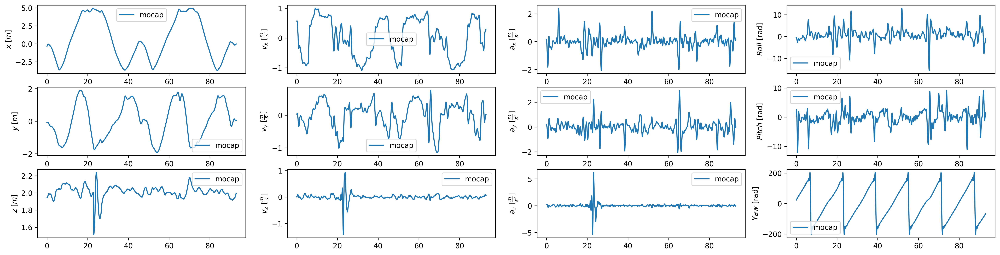

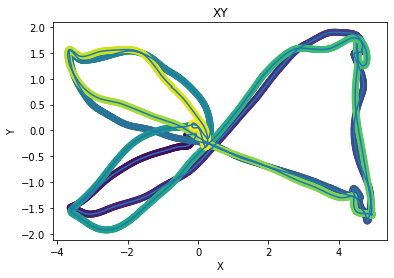

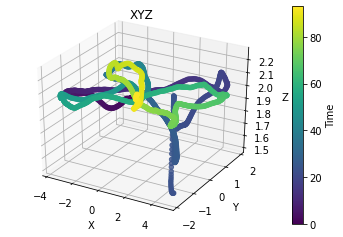

In [160]:
# plot the mocap data 
fig, ax = plt.subplots(3, 4, figsize=(3 * 8, 3 * 2), dpi=300)
# plot x
ax[0, 0].plot(mocap_time_shifted, mocap_X, label='mocap')
ax[0, 0].set_ylabel('$x$ [$m$]')
ax[0, 0].legend()
# plot y
ax[1, 0].plot(mocap_time_shifted, mocap_Y, label='mocap')
ax[1, 0].set_ylabel('$y$ [$m$]')
ax[1, 0].legend()
# plot z
ax[2, 0].plot(mocap_time_shifted, mocap_Z, label='mocap')
ax[2, 0].set_ylabel('$z$ [$m$]')
ax[2, 0].legend()
# plot x_dot
ax[0, 1].plot(mocap_time_shifted, mocap_X_dot, label='mocap')
ax[0, 1].set_ylabel(r'$v_x$ [$\frac{m}{s}$]')
ax[0, 1].legend()
# plot y_dot
ax[1, 1].plot(mocap_time_shifted, mocap_Y_dot, label='mocap')
ax[1, 1].set_ylabel(r'$v_y$ [$\frac{m}{s}$]')
ax[1, 1].legend()
# plot z_dot
ax[2, 1].plot(mocap_time_shifted, mocap_Z_dot, label='mocap')
ax[2, 1].set_ylabel(r'$v_z$ [$\frac{m}{s}$]')
ax[2, 1].legend()
# plot x_ddot
ax[0, 2].plot(mocap_time_shifted, mocap_X_ddot, label='mocap')
ax[0, 2].set_ylabel(r'$a_x$ [$\frac{m}{s^2}$]')
ax[0, 2].legend()
# plot y_ddot
ax[1, 2].plot(mocap_time_shifted, mocap_Y_ddot, label='mocap')
ax[1, 2].set_ylabel(r'$a_y$ [$\frac{m}{s^2}$]')
ax[1, 2].legend()
# plot z_ddot
ax[2, 2].plot(mocap_time_shifted, mocap_Z_ddot, label='mocap')
ax[2, 2].set_ylabel(r'$a_z$ [$\frac{m}{s^2}$]')
ax[2, 2].legend()
# plot Roll
ax[0, 3].plot(mocap_time_shifted, mocap_Roll, label='mocap')
ax[0, 3].set_ylabel('$Roll$ [rad]')
ax[0, 3].legend()
# plot Pitch
ax[1, 3].plot(mocap_time_shifted, mocap_Pitch, label='mocap')
ax[1, 3].set_ylabel('$Pitch$ [rad]')
ax[1, 3].legend()
# plot Yaw
ax[2, 3].plot(mocap_time_shifted, mocap_Yaw, label='mocap')
ax[2, 3].set_ylabel('$Yaw$ [rad]')
ax[2, 3].legend()
plt.show()

# x,y plot of the mocap data
plt.plot(mocap_X, mocap_Y)
plt.scatter(mocap_X, mocap_Y, label='start', c=mocap_time_shifted)
plt.xlabel('X')
plt.ylabel('Y')
plt.title('XY')
plt.show()



# make 3d plot of XYZ with time as color
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(mocap_X, mocap_Y, mocap_Z, c=mocap_time_shifted)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.title('XYZ')
plt.colorbar(sc, label='Time')
plt.show()

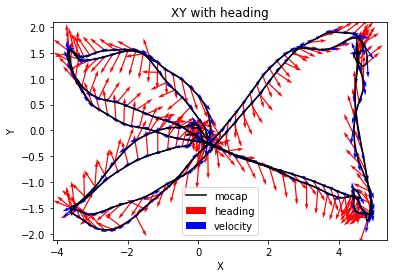

In [161]:
# plot X y data and add heading a s a quiver plot
fig, ax = plt.subplots()
ax.plot(mocap_X, mocap_Y,color='black', label='mocap')
# use mocap_yaw to get the heading
u = np.cos(np.radians(1*np.array(mocap_Yaw)))
v = np.sin(np.radians(1*np.array(mocap_Yaw)))
# plot every 10th point
ax.quiver(mocap_X[::10], mocap_Y[::10], u[::10], v[::10], angles='xy', scale_units='xy', scale=2, color='r', label='heading')
# add quiver based on velocity
Vu = mocap_X_dot
Vv = mocap_Y_dot
# plot every 10th point
ax.quiver(mocap_X[::10], mocap_Y[::10], Vu[::10], Vv[::10], angles='xy', scale_units='xy', scale=2, color='b', label='velocity')
ax.set_xlabel('X')
ax.set_ylabel('Y')
# add legend
ax.legend()
ax.set_title('XY with heading')
plt.show()

Text(0, 0.5, 'Y')

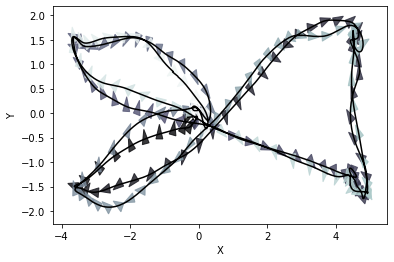

In [162]:
# make the heading arrows that point in the direction of yaw

# # overlay triangles with color by time
#         tri = np.array([[.1,0],[-.05,-.05],[-.05,.05]]) * scale
#         for i in range(0, len(tsim), marker_step):
#             R = np.array([[np.cos(psi[i]), -np.sin(psi[i])],
#                         [np.sin(psi[i]),  np.cos(psi[i])]])
#             tri_r = tri @ R.T
#             color = cmap(norm(tsim[i]))
#             plt.fill(x[i]+tri_r[:,0],
#                     y[i]+tri_r[:,1],
#                     color=color, alpha=0.8, edgecolor=None)


fig, ax = plt.subplots()
ax.plot(mocap_X, mocap_Y, color='black', label='mocap')
# use mocap_yaw to get the heading
tri = np.array([[.1, 0], [-.05, -0.05], [-.05, 0.05]]) * 2
marker_step = 15
cmap = plt.get_cmap('bone')
norm = mpl.colors.Normalize(vmin=mocap_time_shifted.min(), vmax=mocap_time_shifted.max())
for i in range(0, len(mocap_time_shifted), marker_step):
    R = np.array([[np.cos(np.radians(mocap_Yaw[i])), -np.sin(np.radians(mocap_Yaw[i]))],
                  [np.sin(np.radians(mocap_Yaw[i])),  np.cos(np.radians(mocap_Yaw[i]))]])
    tri_r = tri @ R.T
    color = cmap(norm(mocap_time_shifted[i]))
    ax.fill(mocap_X[i] + tri_r[:, 0], mocap_Y[i] + tri_r[:, 1], color=color, alpha=0.8, edgecolor=None)
# ax.scatter(mocap_X[::marker_step], mocap_Y[::marker_step], c=mocap_time_shifted[::marker_step], cmap='viridis', label='time')
ax.set_xlabel('X')
ax.set_ylabel('Y')
# ax.set_title('XY with heading arrows')

-0.4643543284060805 0.3802977056043527 23.506569419387798
velocity_body_dt: 29.999889585847345


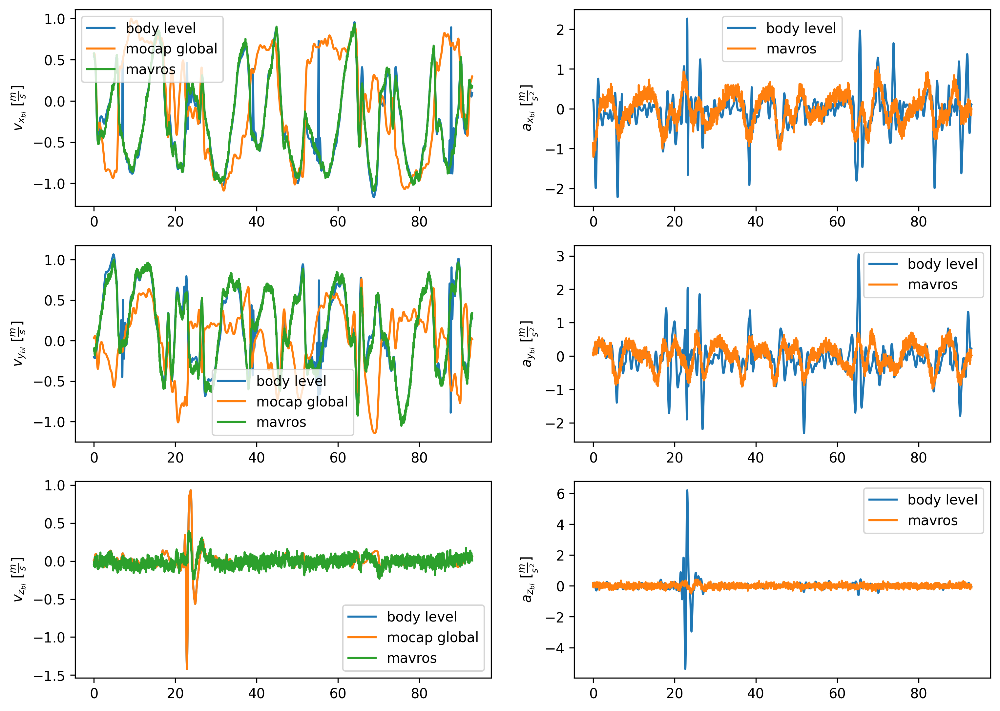

In [248]:
# R_G_BL (rotation from global to body level ) function that takes in roll, pitch, yaw and gives out the rotation matrix

def R_G_BL(roll, pitch, yaw):
    """
    Compute the rotation matrix from global frame to body-level frame.
    This only applies a yaw rotation (inverse of R_z) to align with the body-level frame.

    Args:
    roll  (float): Roll angle (phi) in radians.
    pitch (float): Pitch angle (theta) in radians.
    yaw   (float): Yaw angle (psi) in radians.

    Returns:
    numpy.ndarray: 3x3 rotation matrix from global to body-level frame.
    """
    R_z = np.array([[ np.cos(yaw), np.sin(yaw), 0],
                    [-np.sin(yaw), np.cos(yaw), 0],
                    [ 0, 0, 1]])

    return R_z  # This is R_z(-yaw), rotating global to body-level

    return R_G_BL
print(mocap_Roll[0], mocap_Pitch[0], mocap_Yaw[0])
# Rotate the velocity and acceleration from global to body level
mocap_bl_X_dot = []
mocap_bl_Y_dot = []
mocap_bl_Z_dot = []
mocap_bl_X_ddot = []
mocap_bl_Y_ddot = []
mocap_bl_Z_ddot = []

for i in range(len(mocap_Roll)):
    R_G_BL_i = R_G_BL(np.deg2rad(mocap_Roll[i]), np.deg2rad(mocap_Pitch[i]), np.deg2rad(mocap_Yaw[i]))
    
    # Velocity transformation
    velocity_vector = np.array([mocap_X_dot[i], mocap_Y_dot[i], mocap_Z_dot[i]])
    transformed_velocity = R_G_BL_i @ velocity_vector  # This returns a 3-element vector

    mocap_bl_X_dot.append(transformed_velocity[0])
    mocap_bl_Y_dot.append(transformed_velocity[1])
    mocap_bl_Z_dot.append(transformed_velocity[2])

    # Acceleration transformation
    acceleration_vector = np.array([mocap_X_ddot[i], mocap_Y_ddot[i], mocap_Z_ddot[i]])
    transformed_acceleration = R_G_BL_i @ acceleration_vector  # This returns a 3-element vector

    mocap_bl_X_ddot.append(transformed_acceleration[0])
    mocap_bl_Y_ddot.append(transformed_acceleration[1])
    mocap_bl_Z_ddot.append(transformed_acceleration[2])


data['mavros/local_position/velocity_body']
velocity_body_time = data['mavros/local_position/velocity_body']['rosbagTimestamp']/1e9/2
velocity_body_dt = np.mean(np.diff(velocity_body_time))
print('velocity_body_dt:', 1/velocity_body_dt)
# plt.plot(velocity_body_time, data['mavros/local_position/velocity_body']['x'], label='x')
velocity_body_x = data['mavros/local_position/velocity_body']['x']
velocity_body_y = data['mavros/local_position/velocity_body']['y']
velocity_body_z = data['mavros/local_position/velocity_body']['z']
velocity_body_x = interpolate_data(velocity_body_time, data['mavros/local_position/velocity_body']['x'], mocap_time)
velocity_body_y = interpolate_data(velocity_body_time, data['mavros/local_position/velocity_body']['y'], mocap_time)
velocity_body_z = interpolate_data(velocity_body_time, data['mavros/local_position/velocity_body']['z'], mocap_time)

smooth_params = [10, 0.025]
velocity_body_x_hat, accleration_body_x = pynumdiff.smooth_finite_difference.butterdiff(velocity_body_x, velocity_body_dt, smooth_params, options={'iterate': False})
velocity_body_y_hat, accleration_body_y = pynumdiff.smooth_finite_difference.butterdiff(velocity_body_y, velocity_body_dt, smooth_params, options={'iterate': False})
velocity_body_z_hat, accleration_body_z = pynumdiff.smooth_finite_difference.butterdiff(velocity_body_z, velocity_body_dt, smooth_params, options={'iterate': False})

acceleration_noise = 0.1

accleration_body_x = accleration_body_x + velocity_body_y_hat*np.deg2rad(mocap_Yaw_dot) + np.random.normal(0, acceleration_noise, len(accleration_body_x))
accleration_body_y = accleration_body_y - velocity_body_x_hat*np.deg2rad(mocap_Yaw_dot) + np.random.normal(0, acceleration_noise, len(accleration_body_y))
accleration_body_z = accleration_body_z + np.random.normal(0, acceleration_noise, len(accleration_body_z))

# plt.plot(velocity_body_time, vision_pose_velocity_x, label='mavros velocity x')
# plot the body level velocities and accelerations
fig, ax = plt.subplots(3, 2, figsize=(3 * 4, 3 * 3), dpi=300)
# plot x_dot
ax[0, 0].plot(mocap_time_shifted, mocap_bl_X_dot, label='body level')
ax[0, 0].plot(mocap_time_shifted, mocap_X_dot, label='mocap global')
ax[0, 0].plot(mocap_time_shifted, velocity_body_x, label='mavros')
ax[0, 0].set_ylabel(r'$v_{x_{bl}}$ [$\frac{m}{s}$]')
ax[0, 0].legend()
# plot y_dot
ax[1, 0].plot(mocap_time_shifted, mocap_bl_Y_dot, label='body level')
ax[1, 0].plot(mocap_time_shifted, mocap_Y_dot, label='mocap global')
ax[1, 0].plot(mocap_time_shifted, velocity_body_y, label='mavros')
ax[1, 0].set_ylabel(r'$v_{y_{bl}}$ [$\frac{m}{s}$]')
ax[1, 0].legend()
# plot z_dot
ax[2, 0].plot(mocap_time_shifted, mocap_bl_Z_dot, label='body level')
ax[2, 0].plot(mocap_time_shifted, mocap_Z_dot, label='mocap global')
ax[2, 0].plot(mocap_time_shifted, velocity_body_z, label='mavros')
ax[2, 0].set_ylabel(r'$v_{z_{bl}}$ [$\frac{m}{s}$]')
ax[2, 0].legend()
# plot x_ddot
ax[0, 1].plot(mocap_time_shifted, mocap_bl_X_ddot, label='body level')
# ax[0, 1].plot(mocap_time_shifted, mocap_X_ddot, label='mocap global')
ax[0, 1].plot(mocap_time_shifted, accleration_body_x, label='mavros')
ax[0, 1].set_ylabel(r'$a_{x_{bl}}$ [$\frac{m}{s^2}$]')
ax[0, 1].legend()
# plot y_ddot
ax[1, 1].plot(mocap_time_shifted, mocap_bl_Y_ddot, label='body level')
# ax[1, 1].plot(mocap_time_shifted, mocap_Y_ddot, label='mocap global')
ax[1, 1].plot(mocap_time_shifted, accleration_body_y, label='mavros')
ax[1, 1].set_ylabel(r'$a_{y_{bl}}$ [$\frac{m}{s^2}$]')
ax[1, 1].legend()
# plot z_ddot
ax[2, 1].plot(mocap_time_shifted, mocap_bl_Z_ddot, label='body level')
# ax[2, 1].plot(mocap_time_shifted, mocap_Z_ddot, label='mocap global')
ax[2, 1].plot(mocap_time_shifted, accleration_body_z, label='mavros')
ax[2, 1].set_ylabel(r'$a_{z_{bl}}$ [$\frac{m}{s^2}$]')
ax[2, 1].legend()
plt.show()


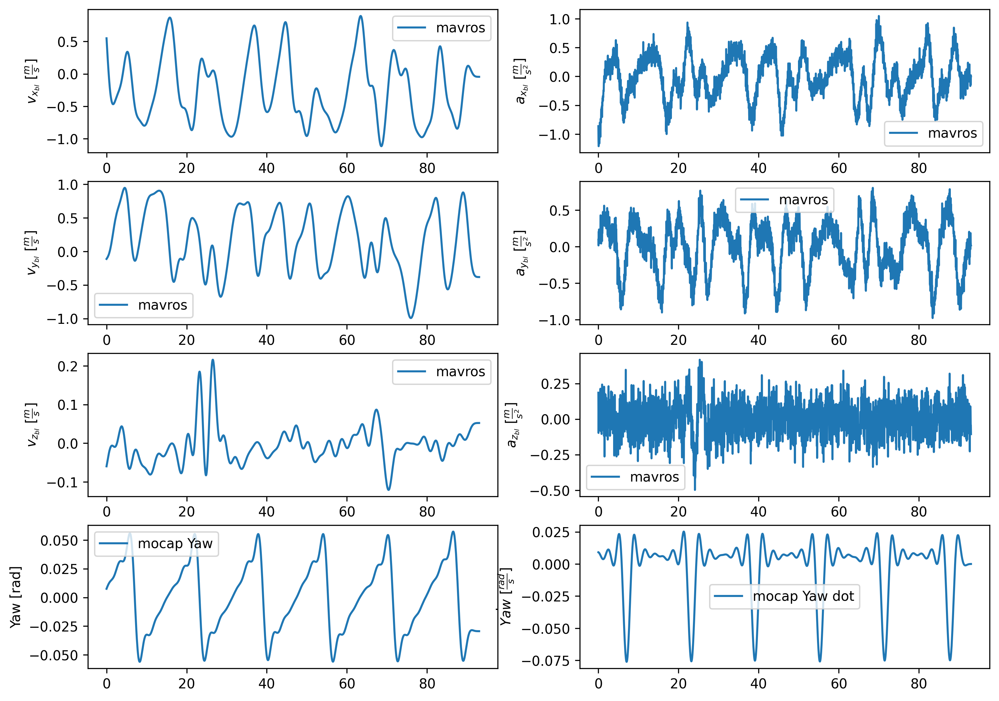

In [249]:
fig, ax = plt.subplots(4, 2, figsize=(3 * 4, 3 * 3), dpi=300)
# plot x_dot

ax[0, 0].plot(mocap_time_shifted, velocity_body_x_hat, label='mavros')
ax[0, 0].set_ylabel(r'$v_{x_{bl}}$ [$\frac{m}{s}$]')
ax[0, 0].legend()
# plot y_dot
ax[1, 0].plot(mocap_time_shifted, velocity_body_y_hat, label='mavros')
ax[1, 0].set_ylabel(r'$v_{y_{bl}}$ [$\frac{m}{s}$]')
ax[1, 0].legend()
# plot z_dot
ax[2, 0].plot(mocap_time_shifted, velocity_body_z_hat, label='mavros')
ax[2, 0].set_ylabel(r'$v_{z_{bl}}$ [$\frac{m}{s}$]')
ax[2, 0].legend()
# plot x_ddot
# ax[0, 1].plot(mocap_time_shifted, mocap_bl_X_ddot, label='body level')
# ax[0, 1].plot(mocap_time_shifted, mocap_X_ddot, label='mocap global')
ax[0, 1].plot(mocap_time_shifted, accleration_body_x, label='mavros')
ax[0, 1].set_ylabel(r'$a_{x_{bl}}$ [$\frac{m}{s^2}$]')
ax[0, 1].legend()
# plot y_ddot
# ax[1, 1].plot(mocap_time_shifted, mocap_bl_Y_ddot, label='body level')
# ax[1, 1].plot(mocap_time_shifted, mocap_Y_ddot, label='mocap global')
ax[1, 1].plot(mocap_time_shifted, accleration_body_y, label='mavros')
ax[1, 1].set_ylabel(r'$a_{y_{bl}}$ [$\frac{m}{s^2}$]')
ax[1, 1].legend()
# plot z_ddot
# ax[2, 1].plot(mocap_time_shifted, mocap_bl_Z_ddot, label='body level')
# ax[2, 1].plot(mocap_time_shifted, mocap_Z_ddot, label='mocap global')
ax[2, 1].plot(mocap_time_shifted, accleration_body_z, label='mavros')
ax[2, 1].set_ylabel(r'$a_{z_{bl}}$ [$\frac{m}{s^2}$]')
ax[2, 1].legend()
ax[3, 0].plot(mocap_time_shifted,np.deg2rad(mocap_Yaw_hat), label='mocap Yaw')
ax[3, 0].set_ylabel(r'Yaw [rad]')
ax[3, 0].legend()
ax[3, 1].plot(mocap_time_shifted, np.deg2rad(mocap_Yaw_dot), label='mocap Yaw dot')
ax[3, 1].set_ylabel(r'$\dot{Yaw}$ [$\frac{rad}{s}$]')
ax[3, 1].legend()
plt.show()

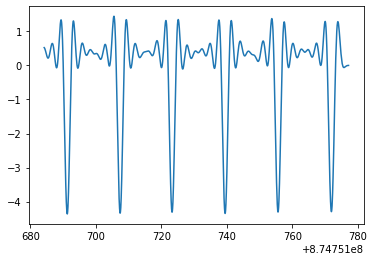

In [250]:
plt.plot(mocap_time,mocap_Yaw_dot)

velocity_body_dt: 29.999889585847345


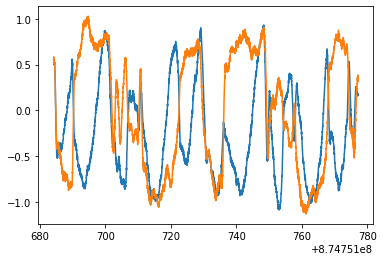

In [251]:
data['mavros/local_position/velocity_body']
velocity_body_time = data['mavros/local_position/velocity_body']['rosbagTimestamp']/1e9/2
velocity_body_dt = np.mean(np.diff(velocity_body_time))
print('velocity_body_dt:', 1/velocity_body_dt)
plt.plot(velocity_body_time, data['mavros/local_position/velocity_body']['x'], label='x')
plt.plot(velocity_body_time, data['mavros/local_position/velocity_local']['x'], label='x')

# IMU [Roll($\phi$),Pitch($\theta$),Yaw($\psi$)] + [$\omega_x$,$\omega_y$,$\omega_z$] + [$A_x$,$A_y$,$A_z$]

imu dt: 49.99987367692684
mocap dt: 29.999631763179117


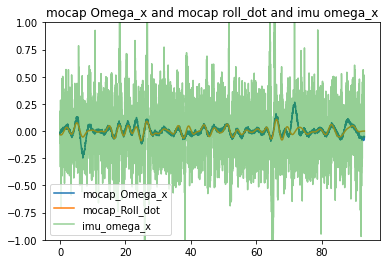

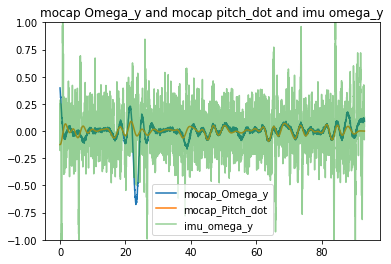

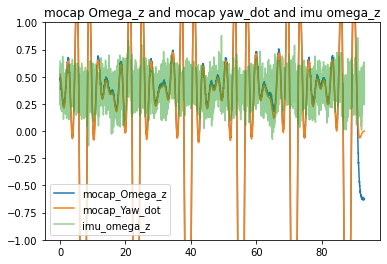

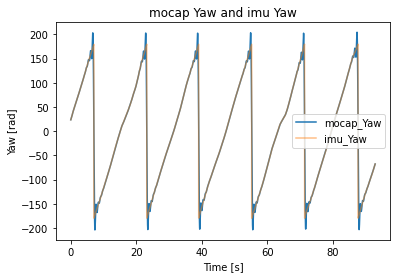

In [253]:
imu_time = data['mavros/imu/data']['rosbagTimestamp']/1e9/2
imu_time_shifted = imu_time - imu_time[0]
imu_Roll, imu_Pitch, imu_Yaw = [], [], []
for i in range(len(data['mavros/imu/data'])):
    R, P, Y = quaternion_to_euler(data['mavros/imu/data']['x'][i],
                                  data['mavros/imu/data']['y'][i],
                                  data['mavros/imu/data']['z'][i],
                                  data['mavros/imu/data']['w'][i])
    imu_Roll.append(np.radians(R))
    imu_Pitch.append(np.radians(P))
    imu_Yaw.append(np.radians(Y))

imu_omega_x = data['mavros/imu/data']['x.1']
imu_omega_y = data['mavros/imu/data']['y.1']
imu_omega_z = data['mavros/imu/data']['z.1']

# function that goes from omega_dot to phi_dot, theta_dot, psi_dot

def omega_to_euler_dot(omega_x, omega_y, omega_z, phi, theta, psi):
    """
    Converts angular velocity components (omega_x, omega_y, omega_z)
    to Euler angle rates (phi_dot, theta_dot, psi_dot).

    input: omega_x, omega_y, omega_z, phi, theta
    output: phi_dot, theta_dot, psi_dot
    """
    phi_dot = omega_x + omega_y * np.tan(theta) * np.sin(phi) + omega_z * np.tan(theta) * np.cos(phi)
    theta_dot = omega_y * np.cos(phi) - omega_z * np.sin(phi)
    psi_dot = omega_y * np.sin(phi) / np.cos(theta) + omega_z * np.cos(phi) / np.cos(theta)

    return phi_dot, theta_dot, psi_dot

def euler_dot_to_omega(phi_dot, theta_dot, psi_dot, phi, theta, psi):
    """
    Converts Euler angle rates (phi_dot, theta_dot, psi_dot)
    to angular velocity components (omega_x, omega_y, omega_z).

    input: phi_dot, theta_dot, psi_dot, phi, theta
    output: omega_x, omega_y, omega_z
    """
    omega_x = phi_dot - psi_dot * np.sin(theta)
    omega_y = theta_dot * np.cos(phi) + psi_dot * np.cos(theta) * np.sin(phi)
    omega_z = -theta_dot * np.sin(phi) + psi_dot * np.cos(theta) * np.cos(phi)

    return omega_x, omega_y, omega_z

imu_phi_dot, imu_theta_dot, imu_psi_dot = [], [], []
for i in range(len(data['mavros/imu/data'])):
    phi_dot, theta_dot, psi_dot = omega_to_euler_dot(imu_omega_x[i],
                                                         imu_omega_y[i],
                                                         imu_omega_z[i],
                                                         imu_Roll[i],
                                                         imu_Pitch[i],
                                                         imu_Yaw[i])
    imu_phi_dot.append(phi_dot)
    imu_theta_dot.append(theta_dot)
    imu_psi_dot.append(psi_dot)
# using mocap data get Omega_x, Omega_y, Omega_z
mocap_Omega_x, mocap_Omega_y, mocap_Omega_z = [], [], []
for i in range(len(data['mavros/local_position/pose'])):
    omega_x, omega_y, omega_z = euler_dot_to_omega(np.gradient(np.deg2rad(mocap_Roll), mocap_time)[i],
                                                    np.gradient(np.deg2rad(mocap_Pitch), mocap_time)[i],
                                                    np.gradient(np.deg2rad(mocap_Yaw), mocap_time)[i],
                                                    np.deg2rad(mocap_Roll[i]),
                                                    np.deg2rad(mocap_Pitch[i]),
                                                    np.deg2rad(mocap_Yaw[i]))
    mocap_Omega_x.append(omega_x)
    mocap_Omega_y.append(omega_y)
    mocap_Omega_z.append(omega_z)

# use pynumdif to smooth the mocap Omega data
# smooth_params = [10, 0.09]
mocap_Omega_x, mocap_Omega_x_dot = pynumdiff.smooth_finite_difference.butterdiff(mocap_Omega_x, mocap_dt, smooth_params, options={'iterate': False})
mocap_Omega_y, mocap_Omega_y_dot = pynumdiff.smooth_finite_difference.butterdiff(mocap_Omega_y, mocap_dt, smooth_params, options={'iterate': False})
mocap_Omega_z, mocap_Omega_z_dot = pynumdiff.smooth_finite_difference.butterdiff(mocap_Omega_z, mocap_dt, smooth_params, options={'iterate': False})
mocap_omega_noise = 0.01
mocap_Omega_x = mocap_Omega_x + np.random.normal(0, mocap_omega_noise, len(mocap_Omega_x))
mocap_Omega_y = mocap_Omega_y + np.random.normal(0, mocap_omega_noise, len(mocap_Omega_y))
mocap_Omega_z = mocap_Omega_z + np.random.normal(0, mocap_omega_noise, len(mocap_Omega_z))


# mocap_Omega_x = remove_outliers(mocap_Omega_x, method='iqr', threshold=1.5)
# mocap_Omega_y = remove_outliers(mocap_Omega_y, method='iqr', threshold=1.5)
# mocap_Omega_z = remove_outliers(mocap_Omega_z, method='iqr', threshold=1.5)                                                   

# function that goes from phi_dot, theta_dot, psi_dot to omega_x, omega_y, omega_z
def euler_dot_to_omega_dot(phi_dot, theta_dot, psi_dot, phi, theta):
    """
    input: phi_dot, theta_dot, psi_dot, phi, theta
    output: omega_x, omega_y, omega_z
    """
    omega_x = phi_dot - psi_dot * np.sin(theta)
    omega_y = theta_dot * np.cos(phi) + psi_dot * np.cos(theta) * np.sin(phi)
    omega_z = psi_dot * np.cos(theta) * np.cos(phi) - theta_dot * np.sin(phi)
    return omega_x, omega_y, omega_z

# take the gradient of imu_roll, imu_pitch, imu_yaw to get the angular velocities
# imu_Roll_dot = np.gradient(imu_Roll, imu_time)
# imu_Pitch_dot = np.gradient(imu_Pitch, imu_time)
# imu_Yaw_dot = np.gradient(imu_Yaw, imu_time)

# smooth_params = [10, 0.09]
imu_Roll_hat, imu_Roll_dot = pynumdiff.smooth_finite_difference.butterdiff(imu_Roll, np.mean(np.diff(imu_time)), smooth_params, options={'iterate': False})
imu_Pitch_hat, imu_Pitch_dot = pynumdiff.smooth_finite_difference.butterdiff(imu_Pitch, np.mean(np.diff(imu_time)), smooth_params, options={'iterate': False})
imu_Yaw_hat, imu_Yaw_dot = pynumdiff.smooth_finite_difference.butterdiff(imu_Yaw, np.mean(np.diff(imu_time)), smooth_params, options={'iterate': False})


# smooth_params = [10, 0.09]
mocap_Roll_hat, mocap_Roll_dot = pynumdiff.smooth_finite_difference.butterdiff(np.deg2rad(mocap_Roll), mocap_dt, smooth_params, options={'iterate': False})
mocap_Pitch_hat, mocap_Pitch_dot = pynumdiff.smooth_finite_difference.butterdiff(np.deg2rad(mocap_Pitch), mocap_dt, smooth_params, options={'iterate': False})
mocap_Yaw_hat, mocap_Yaw_dot = pynumdiff.smooth_finite_difference.butterdiff(np.deg2rad(mocap_Yaw), mocap_dt, smooth_params, options={'iterate': False})

# mocap_Roll_dot=remove_outliers(np.gradient(np.deg2rad(mocap_Roll), mocap_time), method='iqr', threshold=1.5)
# mocap_Pitch_dot=remove_outliers(np.gradient(np.deg2rad(mocap_Pitch), mocap_time), method='iqr', threshold=1.5)
# mocap_Yaw_dot=remove_outliers(np.gradient(np.deg2rad(mocap_Yaw), mocap_time), method='iqr', threshold=1.5)

print('imu dt:', 1/np.mean(np.diff(imu_time)))
print('mocap dt:', 1/np.mean(np.diff(mocap_time)))
# interpolate IMU to mocap time
# imu_omega_x = interpolate_data(imu_time, imu_omega_x, mocap_time)
# imu_omega_y = interpolate_data(imu_time, imu_omega_y, mocap_time)
# imu_omega_z = interpolate_data(imu_time, imu_omega_z, mocap_time)


plt.plot(mocap_time_shifted, mocap_Omega_x, label='mocap_Omega_x')
plt.plot(mocap_time_shifted, mocap_Roll_dot, label='mocap_Roll_dot')
plt.plot(imu_time_shifted, imu_omega_x, label='imu_omega_x',alpha=.5)
plt.title('mocap Omega_x and mocap roll_dot and imu omega_x')
plt.ylim(-1,1)
plt.legend()
plt.show()


plt.plot(mocap_time_shifted, mocap_Omega_y, label='mocap_Omega_y')
plt.plot(mocap_time_shifted, mocap_Pitch_dot, label='mocap_Pitch_dot')
plt.plot(imu_time_shifted, imu_omega_y, label='imu_omega_y',alpha=.5)
plt.title('mocap Omega_y and mocap pitch_dot and imu omega_y')
plt.ylim(-1,1)
plt.legend()
plt.show()

plt.plot(mocap_time_shifted, mocap_Omega_z, label='mocap_Omega_z')
plt.plot(mocap_time_shifted, mocap_Yaw_dot, label='mocap_Yaw_dot')
plt.plot(imu_time_shifted, imu_omega_z, label='imu_omega_z',alpha=.5)
plt.title('mocap Omega_z and mocap yaw_dot and imu omega_z')
plt.ylim(-1,1)
plt.legend()
plt.show()

# plot mocap yae and imu yaw
plt.plot(mocap_time_shifted, mocap_Yaw, label='mocap_Yaw')
plt.plot(imu_time_shifted, np.rad2deg(imu_Yaw), label='imu_Yaw',alpha=.5)
plt.title('mocap Yaw and imu Yaw')
plt.xlabel('Time [s]')
plt.ylabel('Yaw [rad]')
plt.legend()
plt.show()

In [254]:
data['mavros/local_position/pose']

,rosbagTimestamp,header,seq,stamp,secs,nsecs,frame_id,pose,position,x,y,z,orientation,x.1,y.1,z.1,w
0,1749503368410181003,NaN,37821,NaN,1748035269,574440704,"""map""",NaN,NaN,-0.324662,-0.086956,1.942120,NaN,0.004525,-0.002633,-0.203448,-0.979072
1,1749503368476256113,NaN,37822,NaN,1748035269,613441472,"""map""",NaN,NaN,-0.301376,-0.085046,1.942571,NaN,0.004008,-0.002246,-0.206162,-0.978507
2,1749503368544102242,NaN,37823,NaN,1748035269,647441472,"""map""",NaN,NaN,-0.284436,-0.083385,1.943035,NaN,0.007047,-0.002019,-0.213936,-0.976820
3,1749503368607804456,NaN,37824,NaN,1748035269,673441472,"""map""",NaN,NaN,-0.267791,-0.081865,1.943479,NaN,0.007227,-0.002841,-0.222585,-0.974882
4,1749503368673895398,NaN,37825,NaN,1748035269,714441984,"""map""",NaN,NaN,-0.245401,-0.079884,1.944700,NaN,0.006872,-0.004897,-0.224589,-0.974417
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2786,1749503554159400881,NaN,40607,NaN,1748035362,448327744,"""map""",NaN,NaN,-0.060991,0.052344,1.988231,NaN,0.004864,-0.017799,0.580151,-0.814300
2787,1749503554210379758,NaN,40608,NaN,1748035362,478327744,"""map""",NaN,NaN,-0.053501,0.052682,1.990305,NaN,0.002254,-0.016479,0.573808,-0.818821
2788,1749503554276425542,NaN,40609,NaN,1748035362,508328512,"""map""",NaN,NaN,-0.046293,0.053051,1.992211,NaN,-0.000418,-0.015437,0.569953,-0.821532
2789,1749503554344220546,NaN,40610,NaN,1748035362,548328512,"""map""",NaN,NaN,-0.036384,0.053474,1.993765,NaN,-0.000400,-0.012822,0.565291,-0.824792


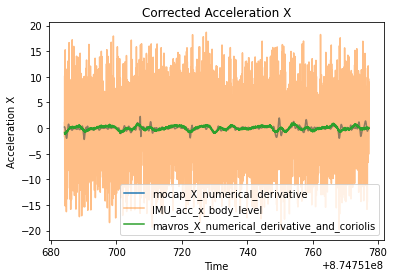

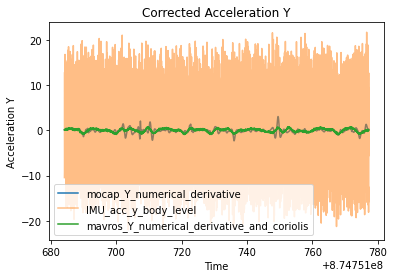

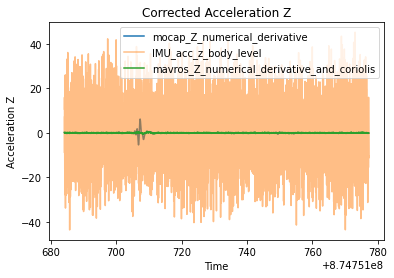

In [255]:
g = 9.81  # Gravitational acceleration (m/s^2)

# Function to compute the rotation matrix from roll, pitch, yaw
def rotation_matrix_from_euler(roll, pitch, yaw):
    """
    Creates a rotation matrix from roll, pitch, yaw angles (in radians).
    """
    # Compute rotation matrices for roll, pitch, and yaw
    R_roll = np.array([
        [1, 0, 0],
        [0, np.cos(roll), -np.sin(roll)],
        [0, np.sin(roll), np.cos(roll)]
    ])
    
    R_pitch = np.array([
        [np.cos(pitch), 0, np.sin(pitch)],
        [0, 1, 0],
        [-np.sin(pitch), 0, np.cos(pitch)]
    ])
    
    R_yaw = np.array([
        [np.cos(yaw), -np.sin(yaw), 0],
        [np.sin(yaw), np.cos(yaw), 0],
        [0, 0, 1]
    ])
    
    # Combine the rotation matrices (Z * Y * X)
    R = R_yaw @ R_pitch @ R_roll
    return R

# Function to remove gravity from linear acceleration
def remove_gravity_from_acceleration(acc_x, acc_y, acc_z, roll, pitch, yaw):
    """
    Removes the gravity component from the linear acceleration in the body frame.
    
    acc_x, acc_y, acc_z: numpy arrays
        Arrays of linear acceleration in the body frame along the x, y, and z axes.
    roll, pitch, yaw: numpy arrays
        Arrays of roll, pitch, and yaw angles (in radians).
    
    Returns:
    acc_x_corrected, acc_y_corrected, acc_z_corrected: numpy arrays
        Corrected linear accelerations with gravity removed along the x, y, and z axes.
    """
    # Initialize corrected acceleration arrays
    acc_x_corrected = np.zeros_like(acc_x)
    acc_y_corrected = np.zeros_like(acc_y)
    acc_z_corrected = np.zeros_like(acc_z)
    
    # Gravity vector in the world frame (assume gravity points along the Z-axis)
    gravity_world = np.array([0, 0, g])
    
    # Loop over each time step and correct the acceleration
    for i in range(len(acc_x)):
        # Get the rotation matrix for the current orientation (roll, pitch, yaw)
        R = rotation_matrix_from_euler(roll[i], pitch[i], yaw[i])
        
        # Transform gravity vector from world frame to body frame
        gravity_body = R.T @ gravity_world  # Transpose R to rotate from world to body
        
        # Measured acceleration in body frame
        acc_body = np.array([acc_x[i], acc_y[i], acc_z[i]])
        
        # Subtract gravity from the body-frame acceleration
        acc_corrected = acc_body - gravity_body
        
        # Store the corrected acceleration
        acc_x_corrected[i] = acc_corrected[0]
        acc_y_corrected[i] = acc_corrected[1]
        acc_z_corrected[i] = acc_corrected[2]
    
    return acc_x_corrected, acc_y_corrected, acc_z_corrected

# Remove gravity from the linear acceleration
imu_acc_x_corrected, imu_acc_y_corrected, imu_acc_z_corrected = remove_gravity_from_acceleration(
    data['mavros/imu/data']['x.2'],
    data['mavros/imu/data']['y.2'],
    data['mavros/imu/data']['z.2'],
    imu_Roll, imu_Pitch, imu_Yaw
)

# rotate the acceleration data to the world frame
def rotate_acceleration_to_world_frame(acc_x, acc_y, acc_z, roll, pitch, yaw):
    """
    Rotates the linear acceleration from the body frame to the world frame.
    
    acc_x, acc_y, acc_z: numpy arrays
        Arrays of linear acceleration in the body frame along the x, y, and z axes.
    roll, pitch, yaw: numpy arrays
        Arrays of roll, pitch, and yaw angles (in radians).
    
    Returns:
    acc_x_world, acc_y_world, acc_z_world: numpy arrays
        Linear acceleration in the world frame along the x, y, and z axes.
    """
    # Initialize world-frame acceleration arrays
    acc_x_world = np.zeros_like(acc_x)
    acc_y_world = np.zeros_like(acc_y)
    acc_z_world = np.zeros_like(acc_z)
    
    # Loop over each time step and rotate the acceleration
    for i in range(len(acc_x)):
        # Get the rotation matrix for the current orientation (roll, pitch, yaw)
        R = rotation_matrix_from_euler(roll[i], pitch[i], yaw[i])
        
        # Measured acceleration in body frame
        acc_body = np.array([acc_x[i], acc_y[i], acc_z[i]])
        
        # Rotate the body-frame acceleration to the world frame
        acc_world = R @ acc_body
        
        # Store the world-frame acceleration
        acc_x_world[i] = acc_world[0]
        acc_y_world[i] = acc_world[1]
        acc_z_world[i] = acc_world[2]
    
    return acc_x_world, acc_y_world, acc_z_world

# Rotate the acceleration data to the world frame
imu_acc_x_corrected_world, imu_acc_y_corrected_world, imu_acc_z_corrected_world = rotate_acceleration_to_world_frame(
    imu_acc_x_corrected, imu_acc_y_corrected, imu_acc_z_corrected, imu_Roll, imu_Pitch, imu_Yaw
)


# creat rotation from body to body level frame ie roll and pitch
def rotation_matrix_from_roll_pitch(roll, pitch):
    """
    Creates a rotation matrix from roll and pitch angles (in radians).
    """
    # Compute rotation matrices for roll and pitch
    R_roll = np.array([
        [1, 0, 0],
        [0, np.cos(roll), -np.sin(roll)],
        [0, np.sin(roll), np.cos(roll)]
    ])
    
    R_pitch = np.array([
        [np.cos(pitch), 0, np.sin(pitch)],
        [0, 1, 0],
        [-np.sin(pitch), 0, np.cos(pitch)]
    ])
    
    # Combine the rotation matrices
    R_b_bl = R_pitch @ R_roll
    return R_b_bl

# rotate the acceleration from the body frame to the body level frame
def rotate_acceleration_to_body_level_frame(acc_x, acc_y, acc_z, roll, pitch):
    """
    Rotates the linear acceleration from the body frame to the body level frame.
    
    acc_x, acc_y, acc_z: numpy arrays
        Arrays of linear acceleration in the body frame along the x, y, and z axes.
    roll, pitch: numpy arrays
        Arrays of roll and pitch angles (in radians).
    
    Returns:
    acc_x_body_level, acc_y_body_level, acc_z_body_level: numpy arrays
        Linear acceleration in the body level frame along the x, y, and z axes.
    """
    # Initialize body-level acceleration arrays
    acc_x_body_level = np.zeros_like(acc_x)
    acc_y_body_level = np.zeros_like(acc_y)
    acc_z_body_level = np.zeros_like(acc_z)
    
    # Loop over each time step and rotate the acceleration
    for i in range(len(acc_x)):
        # Get the rotation matrix for the current orientation (roll, pitch)
        R = rotation_matrix_from_roll_pitch(roll[i], pitch[i])
        
        # Measured acceleration in body frame
        acc_body = np.array([acc_x[i], acc_y[i], acc_z[i]])
        
        # Rotate the body-frame acceleration to the body level frame
        acc_body_level = R @ acc_body
        
        # Store the body-level acceleration
        acc_x_body_level[i] = acc_body_level[0]
        acc_y_body_level[i] = acc_body_level[1]
        acc_z_body_level[i] = acc_body_level[2]
    
    return acc_x_body_level, acc_y_body_level, acc_z_body_level

acc_x_body_level, acc_y_body_level, acc_z_body_level = rotate_acceleration_to_body_level_frame(
    imu_acc_x_corrected, imu_acc_y_corrected, imu_acc_z_corrected, imu_Roll, imu_Pitch
)
# def low_pass_filter(data, dt, cut_off_freq):
# acc_x_body_level=low_pass_filter(acc_x_body_level, np.mean(np.diff(imu_time)), 5)

# create acceleration from velocity bl
mavros_bl_Velocity_x = data['mavros/local_position/velocity_body']['x']
mavros_bl_Velocity_y = data['mavros/local_position/velocity_body']['y']
mavros_bl_Velocity_z = data['mavros/local_position/velocity_body']['z']



# plt.plot(imu_time, imu_acc_x_corrected_world,label='imu_acc_x_corrected')
plt.plot(mocap_time, mocap_bl_X_ddot,label='mocap_X_numerical_derivative')
plt.plot(imu_time, acc_x_body_level,label='IMU_acc_x_body_level',alpha=0.5)
plt.plot(mocap_time, accleration_body_x, label='mavros_X_numerical_derivative_and_coriolis')
# plt.plot(mocap_time, mocap_X_ddot,label='mocap_X_ddot',alpha=0.5)
plt.title('Corrected Acceleration X')
plt.xlabel('Time')
plt.ylabel('Acceleration X')
plt.legend()
plt.show()

# plt.plot(imu_time, imu_acc_y_corrected_world,label='imu_acc_y_corrected')
plt.plot(mocap_time, mocap_bl_Y_ddot,label='mocap_Y_numerical_derivative')
plt.plot(imu_time, acc_y_body_level,label='IMU_acc_y_body_level',alpha=0.5)
plt.plot(mocap_time, accleration_body_y, label='mavros_Y_numerical_derivative_and_coriolis')
# plt.plot(mocap_time, mocap_Y_ddot,label='mocap_Y_ddot',alpha=0.5)
plt.title('Corrected Acceleration Y')
plt.xlabel('Time')
plt.ylabel('Acceleration Y')
plt.legend()
plt.show()

# plt.plot(imu_time, imu_acc_z_corrected_world,label='imu_acc_z_corrected')
plt.plot(mocap_time, mocap_bl_Z_ddot,label='mocap_Z_numerical_derivative')
plt.plot(imu_time, acc_z_body_level,label='IMU_acc_z_body_level',alpha=0.5)
plt.plot(mocap_time, accleration_body_z, label='mavros_Z_numerical_derivative_and_coriolis')
# plt.plot(mocap_time, mocap_Z_ddot,label='mocap_Z_ddot',alpha=0.5)
plt.title('Corrected Acceleration Z')
plt.xlabel('Time')
plt.ylabel('Acceleration Z')
plt.legend()
plt.show()


# optic flow (body level) - camera data

optic_flow_camera_dt: 29.977957461639946


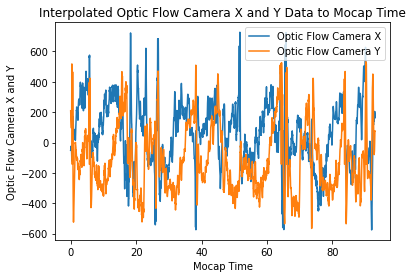

In [256]:
optic_flow_camera_x_time = data['optic_flow/camera/mean/x']['rosbagTimestamp']/1e9/2
optic_flow_camera_y_time = data['optic_flow/camera/mean/y']['rosbagTimestamp']/1e9/2
optic_flow_camera_x = data['optic_flow/camera/mean/x']['data']
optic_flow_camera_y = data['optic_flow/camera/mean/y']['data']

# get dt of optic flow camera data
optic_flow_camera_dt = np.mean(np.diff(optic_flow_camera_x_time))
print('optic_flow_camera_dt:', 1/optic_flow_camera_dt)

# interpolate optic flow camera data to mocap time
optic_flow_camera_x_mocap_interp = interpolate_data(optic_flow_camera_x_time, optic_flow_camera_x, mocap_time)
optic_flow_camera_y_mocap_interp = interpolate_data(optic_flow_camera_y_time, optic_flow_camera_y, mocap_time)

optic_flow_camera_x_mocap_interp=optic_flow_camera_x_mocap_interp
optic_flow_camera_y_mocap_interp=optic_flow_camera_y_mocap_interp

optic_flow_camera_x_mocap_interp[np.abs(optic_flow_camera_x_mocap_interp - np.median(optic_flow_camera_x_mocap_interp)) > 3 * np.std(optic_flow_camera_x_mocap_interp)] = np.median(optic_flow_camera_x_mocap_interp)
optic_flow_camera_y_mocap_interp[np.abs(optic_flow_camera_y_mocap_interp - np.median(optic_flow_camera_y_mocap_interp)) > 3 * np.std(optic_flow_camera_y_mocap_interp)] = np.median(optic_flow_camera_y_mocap_interp)

# Plot the interpolated data
plt.plot(mocap_time_shifted, optic_flow_camera_x_mocap_interp, label="Optic Flow Camera X")
plt.plot(mocap_time_shifted, optic_flow_camera_y_mocap_interp, label="Optic Flow Camera Y")
plt.title('Interpolated Optic Flow Camera X and Y Data to Mocap Time')
plt.xlabel('Mocap Time')
plt.ylabel('Optic Flow Camera X and Y')
plt.legend()
plt.show()

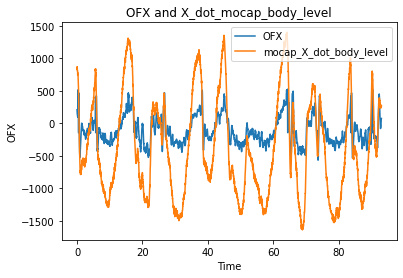

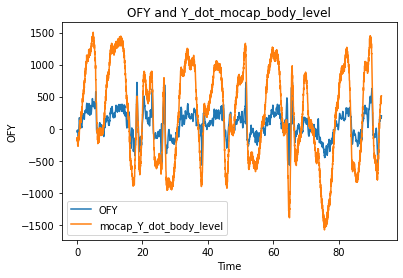

In [257]:
OFX=optic_flow_camera_x_mocap_interp.copy()
OFY=optic_flow_camera_y_mocap_interp.copy()

# apply a yaw rotation to the optic flow data using matrix multiplication
def rotate_optic_flow(OFX, OFY):
    """
    input: OFX, OFY
    output: rotated OFX, OFY
    """
    # apply a 180 degree rotation about x axis using the rotation matrix
    OFX = OFX*1
    OFY = OFY*np.cos(np.pi)

    # un yawing and rotating by 90 degrees
    OFY_rot = np.sin(np.pi/2) * OFX + np.cos(np.pi/2) * OFY
    OFX_rot = np.cos(np.pi/2) * OFX - np.sin(np.pi/2) * OFY
    return OFX_rot, OFY_rot


OFX_rot, OFY_rot = rotate_optic_flow(OFX, OFY)

plt.plot(mocap_time_shifted, OFX_rot,label='OFX')
plt.plot(mocap_time_shifted, np.multiply(velocity_body_x,1500),label='mocap_X_dot_body_level')
plt.title('OFX and X_dot_mocap_body_level')
plt.xlabel('Time')
plt.ylabel('OFX')
plt.legend()
plt.show()

plt.plot(mocap_time_shifted, OFY_rot,label='OFY')
plt.plot(mocap_time_shifted, np.multiply(velocity_body_y,1500),label='mocap_Y_dot_body_level')
plt.title('OFY and Y_dot_mocap_body_level')
plt.xlabel('Time')
plt.ylabel('OFY')
plt.legend()
plt.show()


2791
Scalar (meters/pixel) X: 0.002050107664914384
Scalar (meters/pixel) Y: 0.0019672351812332445


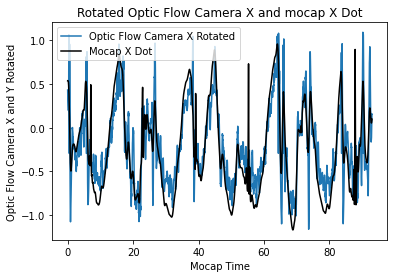

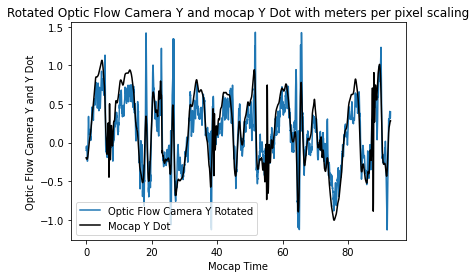

In [258]:
# Reshape the optic flow data to fit the linear regression model
OFX_rot_temp = np.array(OFX_rot)[:int(len(optic_flow_camera_x_mocap_interp)/1)].reshape(-1, 1)
OFY_rot_temp = np.array(OFY_rot)[:int(len(optic_flow_camera_x_mocap_interp)/1)].reshape(-1, 1)
print(len(OFY))
# Perform linear regression
modelX = LinearRegression()
modelX.fit(OFX_rot_temp, mocap_bl_X_dot[:int(len(optic_flow_camera_x_mocap_interp)/1)])

# The slope of the linear regression gives you the scalar (meters/pixel)
meters_per_pixel_X = modelX.coef_[0]
optic_flow_scalar_X = meters_per_pixel_X.copy()
print(f"Scalar (meters/pixel) X: {meters_per_pixel_X}")

modelY = LinearRegression()
modelY.fit(OFY_rot_temp, mocap_bl_Y_dot[:int(len(optic_flow_camera_x_mocap_interp)/1)])

# The slope of the linear regression gives you the scalar (meters/pixel)
meters_per_pixel_Y = modelY.coef_[0]
optic_flow_scalar_Y = meters_per_pixel_Y.copy()
print(f"Scalar (meters/pixel) Y: {meters_per_pixel_Y}")

# Plot the rotated optic flow data
plt.plot(mocap_time_shifted, np.multiply(OFX_rot,meters_per_pixel_X), label="Optic Flow Camera X Rotated")
plt.plot(mocap_time_shifted,np.multiply(mocap_bl_X_dot,1), label="Mocap X Dot",color='black')
# plt.plot(mocap_time, OFY_rot, label="Optic Flow Camera Y Rotated")
plt.title('Rotated Optic Flow Camera X and mocap X Dot')
plt.xlabel('Mocap Time')
plt.ylabel('Optic Flow Camera X and Y Rotated')
plt.legend()
plt.show()

plt.plot(mocap_time_shifted, np.multiply(OFY_rot,meters_per_pixel_Y), label="Optic Flow Camera Y Rotated")
plt.plot(mocap_time_shifted,np.multiply(mocap_bl_Y_dot,1), label="Mocap Y Dot",color='black')
plt.title('Rotated Optic Flow Camera Y and mocap Y Dot with meters per pixel scaling')
plt.xlabel('Mocap Time')
plt.ylabel('Optic Flow Camera Y and Y Dot')
plt.legend()
plt.show()

# Stats model

                            OLS Regression Results                            
Dep. Variable:                    vel   R-squared:                       0.745
Model:                            OLS   Adj. R-squared:                  0.745
Method:                 Least Squares   F-statistic:                     8136.
Date:                Thu, 19 Jun 2025   Prob (F-statistic):               0.00
Time:                        15:08:51   Log-Likelihood:                 1796.3
No. Observations:                2791   AIC:                            -3589.
Df Residuals:                    2789   BIC:                            -3577.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.0086      0.003     -3.158      0.0

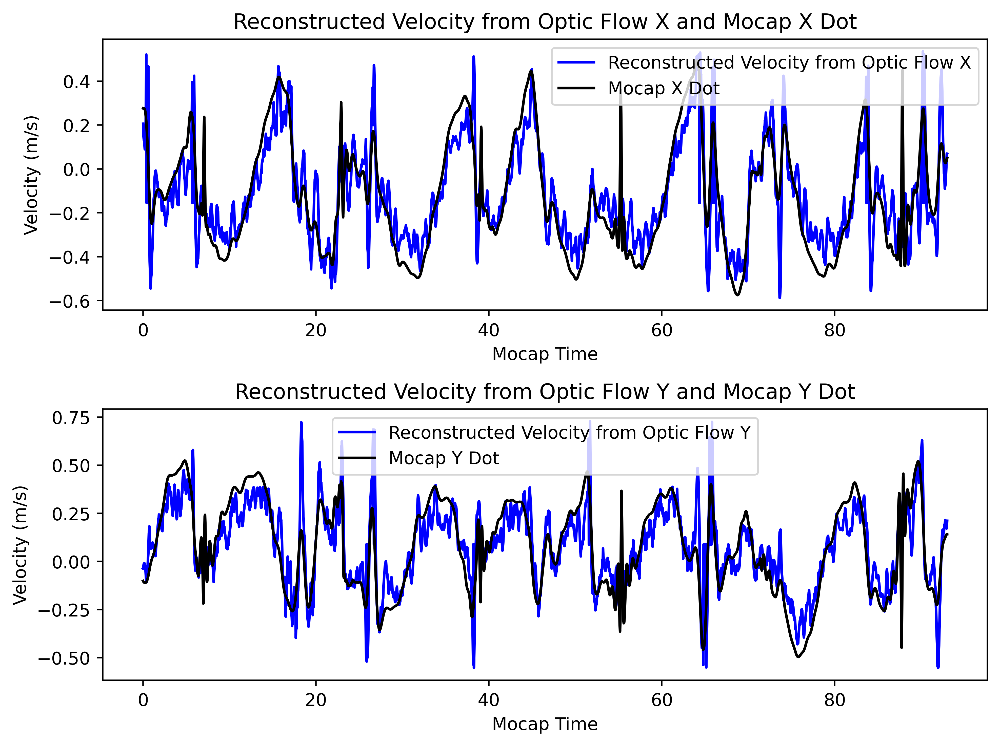

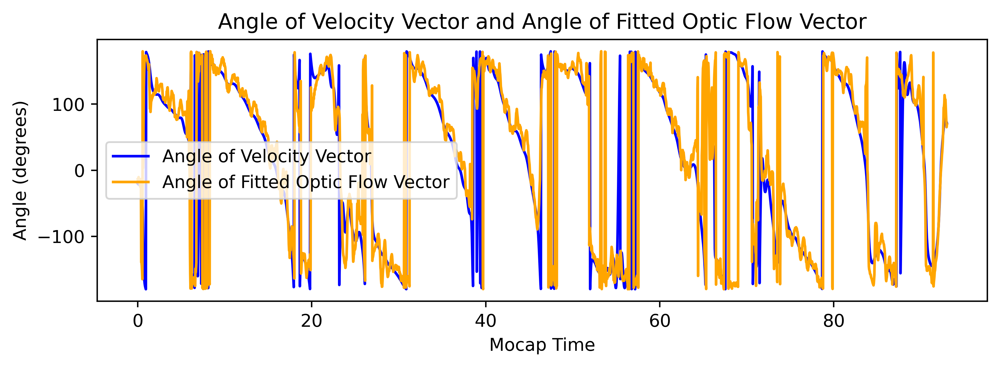

In [259]:
import pandas as pd
import statsmodels.formula.api as smf

# Create DataFrame for X-axis
df_X = pd.DataFrame({
    'flow': np.array(OFX_rot)[:len(optic_flow_camera_x_mocap_interp)],
    'vel': np.divide(velocity_body_x[:len(optic_flow_camera_x_mocap_interp)],mocap_Z[:len(optic_flow_camera_x_mocap_interp)])
})

# Run regression for X-axis
modelX = smf.ols('vel ~ flow', data=df_X).fit()
optic_flow_scalar_X = modelX.params['flow']
optic_flow_intercept_X = modelX.params['Intercept']
vel_from_optic_flow_X = optic_flow_scalar_X * np.array(OFX_rot)[:len(optic_flow_camera_x_mocap_interp)]+ optic_flow_intercept_X
print(modelX.summary())
print(f"Scalar (meters/pixel) X: {optic_flow_scalar_X}")

# Create DataFrame for Y-axis
df_Y = pd.DataFrame({
    'flow': np.array(OFY_rot)[:len(optic_flow_camera_x_mocap_interp)],
    'vel': np.divide(mocap_bl_Y_dot[:len(optic_flow_camera_x_mocap_interp)],mocap_Z[:len(optic_flow_camera_x_mocap_interp)])
})

# Run regression for Y-axis
modelY = smf.ols('vel ~ flow', data=df_Y).fit()
optic_flow_scalar_Y = modelY.params['flow']
optic_flow_intercept_Y = modelY.params['Intercept']
vel_from_optic_flow_Y = optic_flow_scalar_Y * np.array(OFY_rot)[:len(optic_flow_camera_x_mocap_interp)]+ optic_flow_intercept_Y
print(modelY.summary())
print(f"Scalar (meters/pixel) Y: {optic_flow_scalar_Y}")

# find the peaks in the mocap yaw rate data
from scipy.signal import find_peaks
positive_peaks, _ = find_peaks(mocap_Yaw_dot, height=0.1, distance=10)
negative_peaks, _ = find_peaks(-mocap_Yaw_dot, height=0.1, distance=10)
positive_peaks = np.array(positive_peaks, dtype=int)
negative_peaks = np.array(negative_peaks, dtype=int)


print("positive_peaks:", positive_peaks)
print("negative_peaks:", negative_peaks)

# plot the reconstructed velocity based on the optic flow data and the statsmodels
fig, ax = plt.subplots(2, 1, figsize=(8, 6), dpi=500)
# Plot X-axis
ax[0].plot(mocap_time_shifted, vel_from_optic_flow_X, label="Reconstructed Velocity from Optic Flow X", color='blue')
ax[0].plot(mocap_time_shifted, np.divide(mocap_bl_X_dot, mocap_Z), label="Mocap X Dot", color='black')
# ax[0].scatter(mocap_time_shifted[positive_peaks], np.divide(mocap_bl_X_dot, mocap_Z)[positive_peaks], color='red', zorder=5)
# ax[0].scatter(mocap_time_shifted[negative_peaks], np.divide(mocap_bl_X_dot, mocap_Z)[negative_peaks], color='red', zorder=5)
ax[0].set_title('Reconstructed Velocity from Optic Flow X and Mocap X Dot')
ax[0].set_xlabel('Mocap Time')
ax[0].set_ylabel('Velocity (m/s)')
ax[0].legend()
# Plot Y-axis
ax[1].plot(mocap_time_shifted, vel_from_optic_flow_Y, label="Reconstructed Velocity from Optic Flow Y", color='blue')
ax[1].plot(mocap_time_shifted, np.divide(mocap_bl_Y_dot, mocap_Z), label="Mocap Y Dot", color='black')
# ax[1].scatter(mocap_time_shifted[positive_peaks], np.divide(mocap_bl_Y_dot, mocap_Z)[positive_peaks], color='red', zorder=5)
# ax[1].scatter(mocap_time_shifted[negative_peaks], np.divide(mocap_bl_Y_dot, mocap_Z)[negative_peaks], color='red', zorder=5)
ax[1].set_title('Reconstructed Velocity from Optic Flow Y and Mocap Y Dot')
ax[1].set_xlabel('Mocap Time')
ax[1].set_ylabel('Velocity (m/s)')
ax[1].legend()
plt.tight_layout()
plt.show()

# angle of velocity vector
Angle_of_velocity = np.arctan2(mocap_bl_Y_dot, mocap_bl_X_dot)
# angle of the fitted optic flow vector
Angle_of_optic_flow = np.arctan2(OFY_rot, OFX_rot)
# plot the angle of the velocity vector and the angle of the fitted optic flow vector
fig, ax = plt.subplots(figsize=(8, 3), dpi=500)
ax.plot(mocap_time_shifted, np.rad2deg(Angle_of_velocity), label="Angle of Velocity Vector", color='blue')
ax.plot(mocap_time_shifted, np.rad2deg(Angle_of_optic_flow), label="Angle of Fitted Optic Flow Vector", color='orange')
# ax.scatter(mocap_time_shifted[positive_peaks], np.rad2deg(Angle_of_velocity[positive_peaks]), color='red', zorder=5)
# ax.scatter(mocap_time_shifted[negative_peaks], np.rad2deg(Angle_of_velocity[negative_peaks]), color='red', zorder=5)
ax.set_title('Angle of Velocity Vector and Angle of Fitted Optic Flow Vector')
ax.set_xlabel('Mocap Time')
ax.set_ylabel('Angle (degrees)')
ax.legend()
plt.tight_layout()
plt.show()


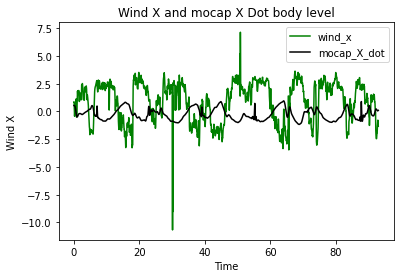

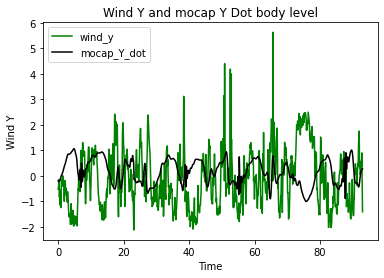

In [260]:
wind_time = data['trisonica']['rosbagTimestamp']/1e9/2
wind_time_shifted = wind_time - wind_time[0]
wind_x = data['trisonica']['westeast']
wind_y = -1*data['trisonica']['northsouth']

# interpolate wind data to mocap time
wind_x_mocap_interp = interpolate_data(wind_time, wind_x, mocap_time)
wind_y_mocap_interp = interpolate_data(wind_time, wind_y, mocap_time)

wind_x_mocap_interp = remove_outliers(wind_x_mocap_interp,threshold=4.0)
wind_y_mocap_interp = remove_outliers(wind_y_mocap_interp,threshold=4.0)

# # # filter out large spikes in the wind data
# if FLAG_FILE == "con_vel" or FLAG_FILE == "con_vel_con_yaw":
#     wind_x_mocap_interp[np.abs(wind_x_mocap_interp - np.median(wind_x_mocap_interp)) > 3 * np.std(wind_x_mocap_interp)] = np.median(wind_x_mocap_interp)
#     wind_y_mocap_interp[np.abs(wind_y_mocap_interp - np.median(wind_y_mocap_interp)) > 3 * np.std(wind_y_mocap_interp)] = np.median(wind_y_mocap_interp)


plt.plot(mocap_time_shifted, wind_x_mocap_interp,label='wind_x',color='green')
# plt.plot(wind_time_shifted, wind_x,label='wind_x',color='green')
# plt.plot(mocap_time_shifted, np.multiply(OFX_rot,meters_per_pixel_X), label="Optic Flow Camera X Rotated",color='blue')
plt.plot(mocap_time_shifted, mocap_bl_X_dot,label='mocap_X_dot',color='black')
plt.title('Wind X and mocap X Dot body level')
plt.xlabel('Time')
plt.ylabel('Wind X')
plt.legend()
plt.show()

plt.plot(mocap_time_shifted, wind_y_mocap_interp,label='wind_y',color='green')
# plt.plot(mocap_time_shifted, np.multiply(OFY_rot,meters_per_pixel_Y), label="Optic Flow Camera Y Rotated",color='blue')
plt.plot(mocap_time_shifted, mocap_bl_Y_dot,label='mocap_Y_dot',color='black')
plt.title('Wind Y and mocap Y Dot body level')
plt.xlabel('Time')
plt.ylabel('Wind Y')
plt.legend()
plt.show()

# mocap groung speed and direction
mocap_ground_speed = np.sqrt(np.square(mocap_bl_X_dot) + np.square(mocap_bl_Y_dot))
mocap_ground_direction = np.arctan2(mocap_bl_Y_dot, mocap_bl_X_dot)
wind_ground_speed = np.sqrt(np.square(wind_x_mocap_interp) + np.square(wind_y_mocap_interp))
wind_ground_direction = np.arctan2(wind_y_mocap_interp, wind_x_mocap_interp)

# plt.plot(mocap_time_shifted, mocap_ground_speed,label='mocap_ground_speed',color='black')
# plt.plot(mocap_time_shifted, wind_ground_speed,label='wind_speed',color='green')
# plt.title('Ground Speed')
# plt.xlabel('Time')
# plt.ylabel('Speed')
# plt.legend()
# plt.show()

# plt.plot(mocap_time_shifted, mocap_ground_direction,label='mocap_ground_direction',color='black')
# # plt.plot(mocap_time_shifted, wind_ground_direction,label='wind_direction',color='green')
# plt.title('Ground Direction')
# plt.xlabel('Time')
# plt.ylabel('Direction')
# plt.legend()
# plt.show()


Scalar X: -0.2225140611969166
Scalar Y: -0.1862240417528679


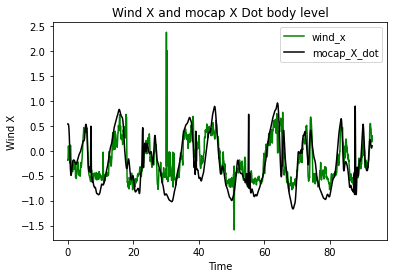

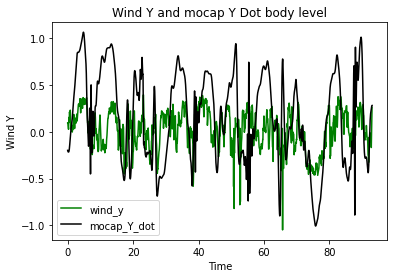

In [261]:

start_int_x = 0
stop_int_x = 4/4
start_int_y = 0
stop_int_y = 4/4

wind_body_level_x, wind_body_level_y =np.array(wind_x_mocap_interp).reshape(-1, 1), np.array(wind_y_mocap_interp).reshape(-1, 1)

wind_body_level_x_temp, wind_body_level_y_temp =np.array(wind_x_mocap_interp)[int(len(wind_x_mocap_interp)*start_int_x):int(len(wind_x_mocap_interp)*stop_int_x)].reshape(-1, 1), np.array(wind_y_mocap_interp).reshape(-1, 1)

wind_body_level_mag_temp = np.array(wind_ground_speed).reshape(-1, 1)

#perform linear regression on the wind data
model_wind_x = LinearRegression()
model_wind_x.fit(wind_body_level_x_temp, mocap_bl_X_dot[int(len(wind_x_mocap_interp)*start_int_x):int(len(wind_x_mocap_interp)*stop_int_x)])

# The slope of the linear regression gives you the scalar
wind_scalar_x = model_wind_x.coef_[0]
# print(model_wind_x.coef_)
print(f"Scalar X: {wind_scalar_x}")

model_wind_y = LinearRegression()
model_wind_y.fit(wind_body_level_y_temp, mocap_bl_Y_dot)

# The slope of the linear regression gives you the scalar
wind_scalar_y = model_wind_y.coef_[0]
print(f"Scalar Y: {wind_scalar_y}")

model_wind_mag = LinearRegression()
model_wind_mag.fit(wind_body_level_mag_temp, mocap_ground_speed)

# The slope of the linear regression gives you the scalar
wind_scalar_mag = model_wind_mag.coef_[0]
# print(f"Scalar (unitless) Mag: {wind_scalar_mag}")


# #mocap xy plot
# plt.plot(mocap_X, mocap_Y,label='mocap')
# plt.scatter(mocap_X, mocap_Y, label='start', c=mocap_time_shifted)
# plt.xlabel('X')
# plt.ylabel('Y')
# plt.title('XY')
# plt.colorbar()
# plt.show()

# #plot mocap yaw
# plt.plot(mocap_time_shifted, mocap_Yaw,label='Yaw')
# plt.scatter(mocap_time_shifted, mocap_Yaw, label='Yaw', c=mocap_time_shifted)
# plt.title('Yaw')
# plt.xlabel('Time')
# plt.ylabel('Yaw')
# plt.legend()
# plt.colorbar()
# plt.show()

# plt.plot(mocap_time_shifted, np.multiply(wind_body_level_x,-0.2410)+0.0530,label='wind_x',color='green')
plt.plot(mocap_time_shifted, np.multiply(wind_body_level_x,wind_scalar_x),label='wind_x',color='green')
plt.plot(mocap_time_shifted, mocap_bl_X_dot,label='mocap_X_dot',color='black')
plt.title('Wind X and mocap X Dot body level')
plt.xlabel('Time')
plt.ylabel('Wind X')
# plt.ylim(-1.5,1.5)
plt.legend()
plt.show()

# plt.plot(mocap_time_shifted, np.multiply(wind_body_level_y,-0.1438)+-0.2180,label='wind_y',color='green')
plt.plot(mocap_time_shifted, np.multiply(wind_body_level_y,wind_scalar_y),label='wind_y',color='green')
plt.plot(mocap_time_shifted, mocap_bl_Y_dot,label='mocap_Y_dot',color='black')
plt.title('Wind Y and mocap Y Dot body level')
plt.xlabel('Time')
plt.ylabel('Wind Y')
plt.legend()
plt.show()

# plt.plot(mocap_time_shifted, np.multiply(wind_ground_speed,wind_scalar_mag),label='wind_speed')
# plt.plot(mocap_time_shifted, mocap_ground_speed,label='mocap_ground_speed')
# plt.title('Ground Speed')
# plt.xlabel('Time')
# plt.ylabel('Speed')
# plt.legend()
# plt.show()


# stats model

                            OLS Regression Results                            
Dep. Variable:                    vel   R-squared:                       0.586
Model:                            OLS   Adj. R-squared:                  0.585
Method:                 Least Squares   F-statistic:                     3940.
Date:                Thu, 19 Jun 2025   Prob (F-statistic):               0.00
Time:                        15:08:57   Log-Likelihood:                -855.67
No. Observations:                2791   AIC:                             1715.
Df Residuals:                    2789   BIC:                             1727.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.0381      0.007     -5.408      0.0

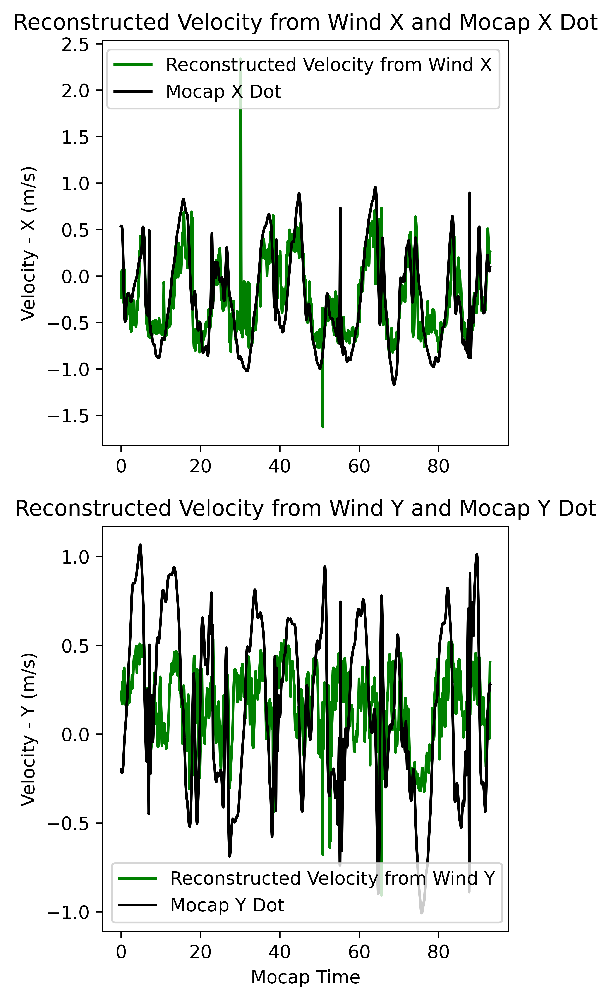

In [262]:
import pandas as pd
import statsmodels.formula.api as smf




# X-axis regression (full range)
df_wind_x = pd.DataFrame({
    'wind': np.array(wind_x_mocap_interp),
    'vel': mocap_bl_X_dot
})
model_wind_x = smf.ols('vel ~ wind', data=df_wind_x).fit()
wind_scalar_x = model_wind_x.params['wind']
wind_intercept_x = model_wind_x.params['Intercept']
vel_from_wind_x = wind_scalar_x * np.array(wind_x_mocap_interp) + wind_intercept_x
# vel_from_wind_x = -0.2617 * np.array(wind_x_mocap_interp) + 0.1422
print(model_wind_x.summary())
print(f"Scalar X: {wind_scalar_x}")

# Y-axis regression (full range)
df_wind_y = pd.DataFrame({
    'wind': np.array(wind_y_mocap_interp),
    'vel': mocap_bl_Y_dot
})
model_wind_y = smf.ols('vel ~ wind', data=df_wind_y).fit()
wind_scalar_y = model_wind_y.params['wind']
wind_intercept_y = model_wind_y.params['Intercept']
vel_from_wind_y = wind_scalar_y * np.array(wind_y_mocap_interp) + wind_intercept_y
# vel_from_wind_y = -0.2316  * np.array(wind_y_mocap_interp) -0.0054
print(model_wind_y.summary())
print(f"Scalar Y: {wind_scalar_y}")

# Magnitude regression (full range)
df_wind_mag = pd.DataFrame({
    'wind': np.array(wind_ground_speed),
    'vel': mocap_ground_speed
})
model_wind_mag = smf.ols('vel ~ wind', data=df_wind_mag).fit()
wind_scalar_mag = model_wind_mag.params['wind']
wind_intercept_mag = model_wind_mag.params['Intercept']
vel_from_wind_mag = wind_scalar_mag * np.array(wind_ground_speed) + wind_intercept_mag
print(model_wind_mag.summary())
print(f"Scalar Mag: {wind_scalar_mag}")

# Plot the reconstructed velocity based on the wind data and the statsmodels
fig, ax = plt.subplots(2, 1, figsize=(4, 9), dpi=600)
# Plot X-axis
ax[0].plot(mocap_time_shifted, vel_from_wind_x, label="Reconstructed Velocity from Wind X", color='green')
ax[0].plot(mocap_time_shifted, mocap_bl_X_dot, label="Mocap X Dot", color='black')
ax[0].set_title('Reconstructed Velocity from Wind X and Mocap X Dot')
# ax[0].set_xlabel('Mocap Time')
ax[0].set_ylabel('Velocity - X (m/s)')
ax[0].legend()
# Plot Y-axis
ax[1].plot(mocap_time_shifted, vel_from_wind_y, label="Reconstructed Velocity from Wind Y", color='green')
ax[1].plot(mocap_time_shifted, mocap_bl_Y_dot, label="Mocap Y Dot", color='black')
ax[1].set_title('Reconstructed Velocity from Wind Y and Mocap Y Dot')
ax[1].set_xlabel('Mocap Time')
ax[1].set_ylabel('Velocity - Y (m/s)')
ax[1].legend()




# RC Out ~ PWM

In [263]:
data['mavros/rc/out']
# split the data in header "channels" into individual columns named PWM1, PWM2, PWM3, PWM4 (only take the first 4 channels) each colum should be a float not a string
rc_time = data['mavros/rc/out']['rosbagTimestamp']/1e9/2
rc_time_shifted = rc_time - rc_time[0]
rc_channels = data['mavros/rc/out']['channels']
rc_channels = rc_channels.str.split(',', expand=True)
# remove "[" from the first column
rc_channels[0] = rc_channels[0].str.replace('[','')
rc_channels = rc_channels.iloc[:, :4]
rc_channels = rc_channels.astype(float)
PX4_1 = rc_channels[0]
PX4_2 = rc_channels[1]
PX4_3 = rc_channels[2]
PX4_4 = rc_channels[3]



/tmp/ipykernel_434325/2308055145.py:8: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  rc_channels[0] = rc_channels[0].str.replace('[','')


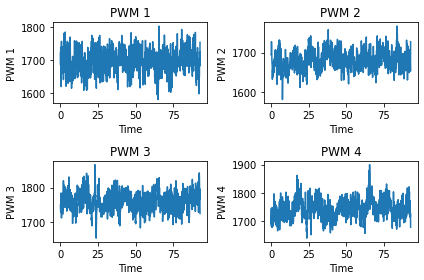

In [264]:
# pwm_1 = PX4_3
# pwm_2 = PX4_1
# pwm_3 = PX4_4
# pwm_4 = PX4_2

pwm_1 = PX4_1
pwm_2 = PX4_2
pwm_3 = PX4_3
pwm_4 = PX4_4
# 2x2 plot of the pwm data
plt.subplot(2, 2, 1)
plt.plot(rc_time_shifted, pwm_1)
plt.title('PWM 1')
plt.xlabel('Time')
plt.ylabel('PWM 1')

plt.subplot(2, 2, 2)
plt.plot(rc_time_shifted, pwm_2)
plt.title('PWM 2')
plt.xlabel('Time')
plt.ylabel('PWM 2')

plt.subplot(2, 2, 3)
plt.plot(rc_time_shifted, pwm_3)
plt.title('PWM 3')
plt.xlabel('Time')
plt.ylabel('PWM 3')

plt.subplot(2, 2, 4)
plt.plot(rc_time_shifted, pwm_4)
plt.title('PWM 4')
plt.xlabel('Time')
plt.ylabel('PWM 4')

plt.tight_layout()
plt.show()

# Get the final values fir all the measured data

## since mocap is the fastes we will interpolate to that

### Mocap Final

In [265]:
X_TRUE = mocap_X
X_DOT_G_TRUE = mocap_X_dot
X_DOT_BL_TRUE = mocap_bl_X_dot
Y_TRUE = mocap_Y
Y_DOT_G_TRUE = mocap_Y_dot
Y_DOT_BL_TRUE = mocap_bl_Y_dot
Z_TRUE = mocap_Z
Z_DOT_G_TRUE = mocap_Z_dot
Z_DOT_BL_TRUE = mocap_bl_Z_dot
Roll_TRUE = mocap_Roll
Pitch_TRUE = mocap_Pitch
Yaw_TRUE = mocap_Yaw
OMEGA_X_TRUE = mocap_Omega_x
OMEGA_Y_TRUE = mocap_Omega_y
OMEGA_Z_TRUE = mocap_Omega_z

# put into a dataframe
df_all = pd.DataFrame({
    'X_TRUE': X_TRUE,
    'X_DOT_G_TRUE': X_DOT_G_TRUE,
    'X_DOT_BL_TRUE': X_DOT_BL_TRUE,
    'Y_TRUE': Y_TRUE,
    'Y_DOT_G_TRUE': Y_DOT_G_TRUE,
    'Y_DOT_BL_TRUE': Y_DOT_BL_TRUE,
    'Z_TRUE': Z_TRUE,
    'Z_DOT_G_TRUE': Z_DOT_G_TRUE,
    'Z_DOT_BL_TRUE': Z_DOT_BL_TRUE,
    'Roll_TRUE': Roll_TRUE,
    'Pitch_TRUE': Pitch_TRUE,
    'Yaw_TRUE': Yaw_TRUE,
    'OMEGA_X_TRUE': OMEGA_X_TRUE,
    'OMEGA_Y_TRUE': OMEGA_Y_TRUE,
    'OMEGA_Z_TRUE': OMEGA_Z_TRUE
})

# IMU Final

In [266]:
IMU_ROLL = interpolate_data(imu_time, imu_Roll, mocap_time)
IMU_PITCH = interpolate_data(imu_time, imu_Pitch, mocap_time)
IMU_YAW = interpolate_data(imu_time, imu_Yaw, mocap_time)
IMU_ROLL_DOT = interpolate_data(imu_time, imu_Roll_dot, mocap_time)
IMU_PITCH_DOT = interpolate_data(imu_time, imu_Pitch_dot, mocap_time)
IMU_YAW_DOT = interpolate_data(imu_time, imu_Yaw_dot, mocap_time)
# IMU_OMEGA_X = interpolate_data(imu_time, imu_omega_x, mocap_time)
IMU_OMEGA_X = mocap_Omega_x
# IMU_OMEGA_Y = interpolate_data(imu_time, imu_omega_y, mocap_time)
IMU_OMEGA_Y = mocap_Omega_y
# IMU_OMEGA_Z = interpolate_data(imu_time, imu_omega_z, mocap_time)
IMU_OMEGA_Z = mocap_Omega_z
# IMU_ACC_BL_X = interpolate_data(imu_time, acc_x_body_level, mocap_time)
IMU_ACC_BL_X = accleration_body_x
# IMU_ACC_BL_Y = interpolate_data(imu_time, acc_y_body_level, mocap_time)
IMU_ACC_BL_Y = accleration_body_y
# IMU_ACC_BL_Z = interpolate_data(imu_time, acc_z_body_level, mocap_time)
IMU_ACC_BL_Z = accleration_body_z
print(np.shape(acc_z_body_level))

# add to df_all
df_all['IMU_ROLL'] = IMU_ROLL
df_all['IMU_PITCH'] = IMU_PITCH
df_all['IMU_YAW'] = IMU_YAW
df_all['IMU_ROLL_DOT'] = IMU_ROLL_DOT
df_all['IMU_PITCH_DOT'] = IMU_PITCH_DOT
df_all['IMU_YAW_DOT'] = IMU_YAW_DOT
df_all['IMU_OMEGA_X'] = IMU_OMEGA_X
df_all['IMU_OMEGA_Y'] = IMU_OMEGA_Y
df_all['IMU_OMEGA_Z'] = IMU_OMEGA_Z
df_all['IMU_ACC_BL_X'] = IMU_ACC_BL_X
df_all['IMU_ACC_BL_Y'] = IMU_ACC_BL_Y
df_all['IMU_ACC_BL_Z'] = IMU_ACC_BL_Z
# df_all.to_csv('df_all.csv', index=False)

(4651,)


# Wind sensor fianl

In [267]:
Wind_BL_X = np.ravel(np.array(wind_body_level_x))
Wind_BL_Y = np.ravel(np.array(wind_body_level_y))
Wind_BL_X_f = 1*wind_scalar_x
# Wind_BL_X_f = -0.2580
Wind_BL_X_offset = wind_intercept_x
# Wind_BL_X_offset = 0.1175
Wind_BL_Y_f = 1*wind_scalar_y
# Wind_BL_Y_f = -0.2478
Wind_BL_Y_offset = wind_intercept_y
# Wind_BL_Y_offset = -0.1869
Wind_BL_X_Scaled = np.multiply(Wind_BL_X, Wind_BL_X_f) + Wind_BL_X_offset
Wind_BL_Y_Scaled = np.multiply(Wind_BL_Y, Wind_BL_Y_f) + Wind_BL_Y_offset
Wind_BL_A = np.sqrt(np.square(Wind_BL_X_Scaled) + np.square(Wind_BL_Y_Scaled))
Wind_BL_Gamma = np.arctan2(Wind_BL_Y_Scaled, Wind_BL_X_Scaled)

# add to df_all
df_all['Wind_BL_X'] = Wind_BL_X
df_all['Wind_BL_Y'] = Wind_BL_Y
df_all['Wind_BL_X_Scaled'] = Wind_BL_X_Scaled
df_all['Wind_BL_Y_Scaled'] = Wind_BL_Y_Scaled
df_all['Wind_BL_A'] = Wind_BL_A
df_all['Wind_BL_Gamma'] = Wind_BL_Gamma


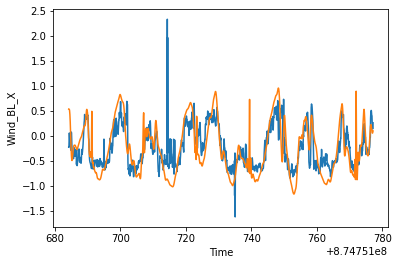

<function matplotlib.pyplot.show(*args, **kw)>

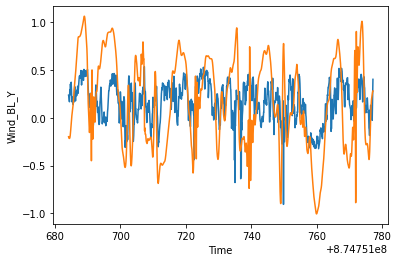

In [268]:
plt.plot(mocap_time, Wind_BL_X_Scaled,label='Wind_X_f')
plt.plot(mocap_time, X_DOT_BL_TRUE,label='X_DOT_BL_TRUE')
plt.xlabel('Time')
plt.ylabel('Wind_BL_X')
plt.show()

plt.plot(mocap_time, Wind_BL_Y_Scaled,label='Wind_Y_f')
plt.plot(mocap_time, Y_DOT_BL_TRUE,label='Y_DOT_BL_TRUE')
plt.xlabel('Time')
plt.ylabel('Wind_BL_Y')
plt.show

# optic flow final

In [269]:
OF_BL_X, OF_BL_Y = rotate_optic_flow(optic_flow_camera_x_mocap_interp, optic_flow_camera_y_mocap_interp)
OF_BL_X_f = optic_flow_scalar_X.copy()
print(OF_BL_X_f)
OF_BL_X_offset = optic_flow_intercept_X.copy()
print(OF_BL_X_offset)
OF_BL_Y_f = optic_flow_scalar_Y
OF_BL_Y_offset = optic_flow_intercept_Y
OF_BL_X_Scaled = np.multiply(OF_BL_X,OF_BL_X_f) + OF_BL_X_offset
OF_BL_Y_Scaled = np.multiply(OF_BL_Y,OF_BL_Y_f) + OF_BL_Y_offset

# add to df_all
df_all['OF_BL_X'] = OF_BL_X
df_all['OF_BL_Y'] = OF_BL_Y
df_all['OF_BL_X_Scaled'] = OF_BL_X_Scaled
df_all['OF_BL_Y_Scaled'] = OF_BL_Y_Scaled

0.0010228992686584094
-0.008561785438145075


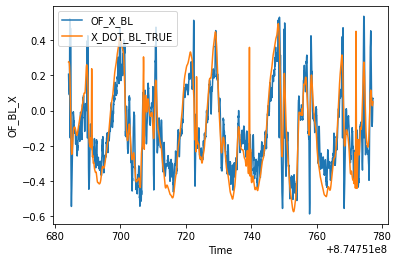

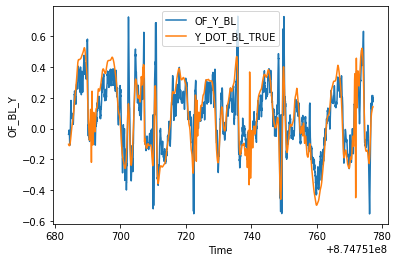

Standard deviation of OF_BL_X_Scaled - np.divide(X_DOT_BL_TRUE,Z_TRUE): 0.131890380555975
Standard deviation of OF_BL_Y_Scaled - np.divide(Y_DOT_BL_TRUE,Z_TRUE): 0.12505532441887832


In [270]:
plt.plot(mocap_time, OF_BL_X_Scaled,label='OF_X_BL')
plt.plot(mocap_time, np.divide(X_DOT_BL_TRUE,Z_TRUE),label='X_DOT_BL_TRUE')
plt.xlabel('Time')
plt.ylabel('OF_BL_X')
plt.legend()
plt.show()

plt.plot(mocap_time, OF_BL_Y_Scaled,label='OF_Y_BL')
plt.plot(mocap_time, np.divide(Y_DOT_BL_TRUE,Z_TRUE),label='Y_DOT_BL_TRUE')
plt.xlabel('Time')
plt.ylabel('OF_BL_Y')
plt.legend()
plt.show()

# calculate the standard deviation of OF_BL_X_Scaled -np.divide(X_DOT_BL_TRUE,Z_TRUE) and print it
std_dev_x = np.std(OF_BL_X_Scaled-np.divide(X_DOT_BL_TRUE,Z_TRUE))
print('Standard deviation of OF_BL_X_Scaled - np.divide(X_DOT_BL_TRUE,Z_TRUE):', std_dev_x)
std_dev_y = np.std(OF_BL_Y_Scaled-np.divide(Y_DOT_BL_TRUE,Z_TRUE))
print('Standard deviation of OF_BL_Y_Scaled - np.divide(Y_DOT_BL_TRUE,Z_TRUE):', std_dev_y)

# plt.plot(mocap_time, OF_BL_X_Scaled-np.divide(X_DOT_BL_TRUE,Z_TRUE),label='OF_BL_X-X_DOT_BL')

# PWM Final

In [271]:
PWM_1 = (interpolate_data(rc_time, pwm_1, mocap_time)-1150)/1000*9.81
PWM_2 = (interpolate_data(rc_time, pwm_2, mocap_time)-1150)/1000*9.81
PWM_3 = (interpolate_data(rc_time, pwm_3, mocap_time)-1150)/1000*9.81
PWM_4 = (interpolate_data(rc_time, pwm_4, mocap_time)-1150)/1000*9.81

# add to df_all
df_all['PWM_1'] = PWM_1
df_all['PWM_2'] = PWM_2
df_all['PWM_3'] = PWM_3
df_all['PWM_4'] = PWM_4

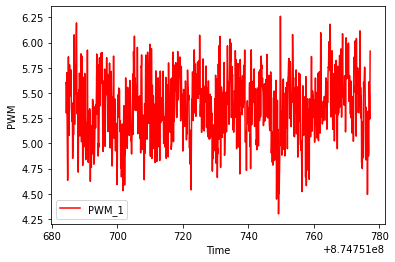

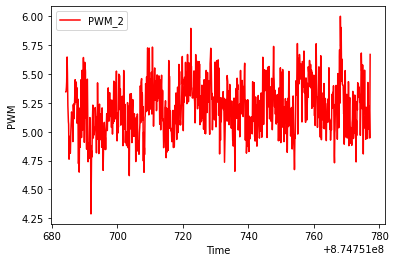

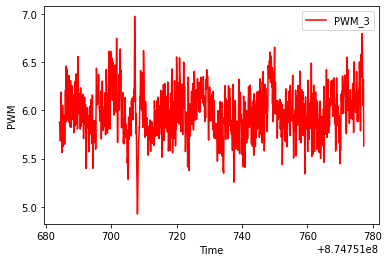

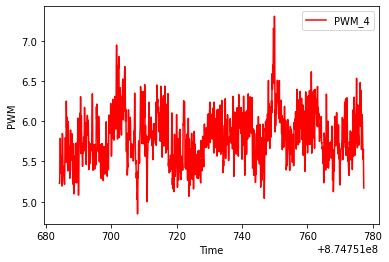

In [272]:
plt.plot(mocap_time, PWM_1,label='PWM_1',color='red')
plt.xlabel('Time')
plt.ylabel('PWM')
plt.legend()
plt.show()
plt.plot(mocap_time, PWM_2,label='PWM_2',color='red')
plt.xlabel('Time')
plt.ylabel('PWM')
plt.legend()
plt.show()
plt.plot(mocap_time, PWM_3,label='PWM_3',color='red')
plt.xlabel('Time')
plt.ylabel('PWM')
plt.legend()
plt.show()
plt.plot(mocap_time, PWM_4,label='PWM_4',color='red')
plt.xlabel('Time')
plt.ylabel('PWM')
plt.legend()
plt.show()

# Time

In [273]:
TIME_BL = mocap_time-mocap_time[0]
DT_BL=np.round(TIME_BL[1]-TIME_BL[0],2)
print(DT_BL)

# add to df_all
df_all['TIME_BL'] = TIME_BL

0.03


# Real Drone Parameters

In [274]:
########################################################################################
#################### Real Drone Parameters #############################################
########################################################################################
Real_m   = 0.086  # [kg] mass
Real_M   = 2.529  # [kg] mass
Real_mM  = Real_M+4*Real_m  # [kg] mass (total=2.529+4*0.086=2.897)
Real_l   = 0.2032 # [m] length
Real_r   = 0.1778 # [m] average body radius
# Real_Ix  = (2*(Real_M*Real_r**2)/5 + 2*Real_m*Real_l**2)*4 # [kg*m^2] moment of inertia
Real_Ix  = .491 # [kg*m^2] moment of inertia
# Real_Iy  = (2*(Real_M*Real_r**2)/5 + 2*Real_m*Real_l**2)*4 # [kg*m^2] moment of inertia
Real_Iy  = .387 # [kg*m^2] moment of inertia
# Real_Iz  = (2*(Real_M*Real_r**2)/5 + 4*Real_m*Real_l**2)*4 # [kg*m^2] moment of inertia
Real_Iz  = .667 # [kg*m^2] moment of inertia
Real_Jr  = (2*(Real_M*Real_r**2)/5)*4 # [kg*m^2] polar moment of inertia ### FAKE VALUE
Real_b   = 1.8311 # thrust coefficient
Real_d   = 0.01 # drag coefficient
Real_Dl  = 0.01 # drag coefficient from ground speed plus air speed
Real_Dr  = 0.01 # drag coefficient from rotation speed
Real_C   = 0.1 # thrust coefficient

print('Real Drone Parameters:')
print('Real_m:       ', Real_m)
print('Real_M:       ', Real_M)
print('Real_M_total: ', Real_mM)
print('Real_l:       ', Real_l)
print('Real_r:       ', Real_r)
print('Real_Ix:      ', Real_Ix)
print('Real_Iy:      ', Real_Iy)
print('Real_Iz:      ', Real_Iz)
print('Real_Jr:      ', Real_Jr)
print('Real_b:       ', Real_b)
print('Real_d:       ', Real_d)
print('Real_Dl:      ', Real_Dl)
print('Real_Dr:      ', Real_Dr)


# params = [m,l,Ix,Iy,Iz,Jr,b,d,Dl,Dr]
params = [Real_mM,Real_l,Real_Ix,Real_Iy,Real_Iz,Real_Jr,Real_b,Real_d,Real_Dl,Real_Dr]
g  = 9.81 # m/s^2

Real Drone Parameters:
Real_m:        0.086
Real_M:        2.529
Real_M_total:  2.8729999999999998
Real_l:        0.2032
Real_r:        0.1778
Real_Ix:       0.491
Real_Iy:       0.387
Real_Iz:       0.667
Real_Jr:       0.127918195776
Real_b:        1.8311
Real_d:        0.01
Real_Dl:       0.01
Real_Dr:       0.01


# MPC added on here

In [275]:
g = 9.81  # gravity [m/s^2]
m = 0.086  # mass [kg]
M = 2.529  # mass [kg]
Mm = 4 * m + M  # total mass [kg]
L = 0.2032  # length [m]
R = 0.1778  # average body radius [m]
I_x = .491
# self.I_x = 2 * (self.M * self.R ** 2) / 5 + 2 * self.m * self.L ** 2  # [kg*m^2] moment of inertia about x
I_y = .387
# self.I_y = 2 * (self.M * self.R ** 2) / 5 + 2 * self.m * self.L ** 2  # [kg*m^2] moment of inertia about y
I_z = .667
# self.I_z = 2 * (self.M * self.R ** 2) / 5 + 4 * self.m * self.L ** 2  # [kg*m^2] moment of inertia about y
# b = 1.8311  # thrust coefficient
# d = 1  # drag constant
# C = 0.1  # drag coefficient from ground speed plus air speed
b = 1.34
d = 1.0
C = 0.1

PARAMS = {
        'g': g,
        'm': m,
        'M': M,
        'Mm': Mm,
        'L': L,
        'R': R,
        'I_x': I_x,
        'I_y': I_y,
        'I_z': I_z,
        'b': b,
        'd': d,
        'C': C
                }

In [194]:
# print all headers in df_all
print("DataFrame Headers:")
for col in df_all.columns:
    print(col)

DataFrame Headers:
X_TRUE
X_DOT_G_TRUE
X_DOT_BL_TRUE
Y_TRUE
Y_DOT_G_TRUE
Y_DOT_BL_TRUE
Z_TRUE
Z_DOT_G_TRUE
Z_DOT_BL_TRUE
Roll_TRUE
Pitch_TRUE
Yaw_TRUE
OMEGA_X_TRUE
OMEGA_Y_TRUE
OMEGA_Z_TRUE
IMU_ROLL
IMU_PITCH
IMU_YAW
IMU_ROLL_DOT
IMU_PITCH_DOT
IMU_YAW_DOT
IMU_OMEGA_X
IMU_OMEGA_Y
IMU_OMEGA_Z
IMU_ACC_BL_X
IMU_ACC_BL_Y
IMU_ACC_BL_Z
Wind_BL_X
Wind_BL_Y
Wind_BL_X_Scaled
Wind_BL_Y_Scaled
Wind_BL_A
Wind_BL_Gamma
OF_BL_X
OF_BL_Y
OF_BL_X_Scaled
OF_BL_Y_Scaled
PWM_1
PWM_2
PWM_3
PWM_4
TIME_BL


In [195]:
X0_mpc = np.atleast_2d(np.vstack((X_TRUE[0], # X
                                 Y_TRUE[0], # Y
                                 Z_TRUE[0], # 1/Z = mu
                                 X_DOT_BL_TRUE[0], # X_DOT
                                 Y_DOT_BL_TRUE[0], # Y_DOT
                                 Z_DOT_BL_TRUE[0], # Z_DOT
                                 IMU_ROLL[0], # ROLL
                                 IMU_PITCH[0], # PITCH
                                 IMU_YAW[0], # YAW
                                 IMU_OMEGA_X[0], # OMEGA_X
                                 IMU_OMEGA_Y[0], # OMEGA_Y
                                 IMU_OMEGA_Z[0], # OMEGA_Z
                                 0, # wx
                                 0 # wy
                                 )))
print("Initial State X0_MPC:")
print(X0_mpc)
X0_sim = []
for i in range(len(X0_mpc)):
    X0_sim.append(X0_mpc[i][0])

# Check if the absolute values of the last two elements are both < 1e-12
if abs(X0_mpc[-1][0]) < 1e-12 and abs(X0_mpc[-2][0]) < 1e-12:
    print('hello')
    X0_sim[-2] = 1e-12
    X0_sim[-1] = 1e-12


X0_sim = np.array(X0_sim)
print("X0_sim", len(X0_sim), '\n', X0_sim)

Initial State X0_MPC:
[[-0.324662  ]
 [-0.08695614]
 [ 1.94212031]
 [ 0.53615457]
 [-0.19791298]
 [ 0.00952359]
 [-0.00770802]
 [ 0.00690808]
 [ 0.41025086]
 [-0.0178872 ]
 [ 0.39263891]
 [ 0.47858738]
 [ 0.        ]
 [ 0.        ]]
hello
X0_sim 14 
 [-3.24662000e-01 -8.69561359e-02  1.94212031e+00  5.36154568e-01
 -1.97912977e-01  9.52359433e-03 -7.70802135e-03  6.90808116e-03
  4.10250863e-01 -1.78871955e-02  3.92638913e-01  4.78587383e-01
  1.00000000e-12  1.00000000e-12]


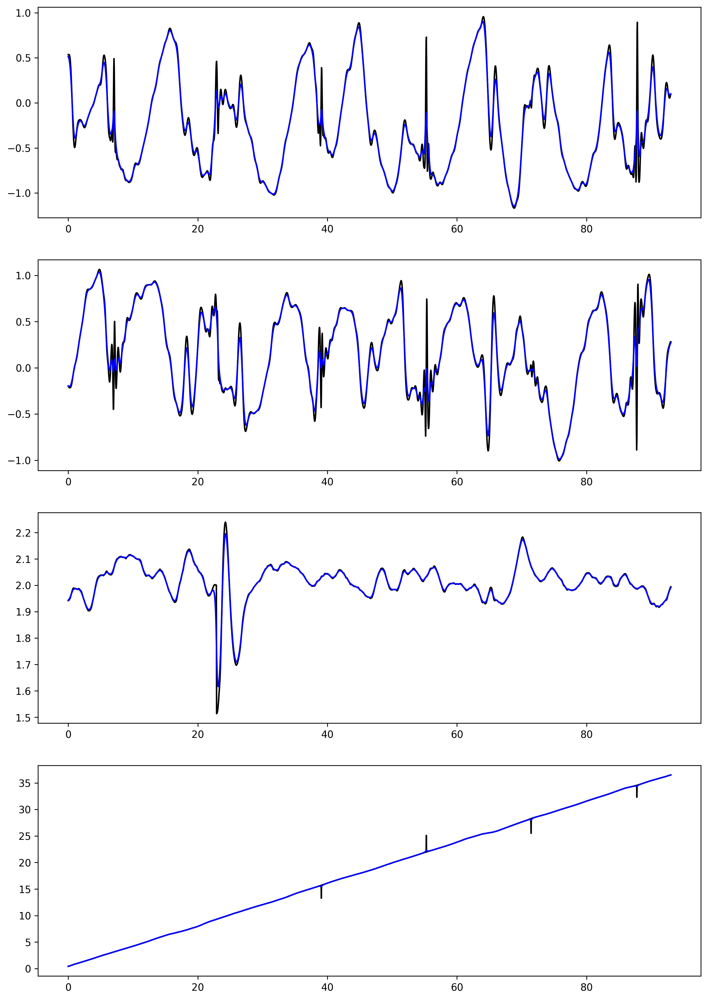

In [196]:
dt_filtter = TIME_BL[1] - TIME_BL[0]
X_DOT_BL_TRUE_MPC = low_pass_filter(X_DOT_BL_TRUE, dt_filtter, 1)
Y_DOT_BL_TRUE_MPC = low_pass_filter(Y_DOT_BL_TRUE, dt_filtter, 1)
Z_TRUE_MPC = low_pass_filter(Z_TRUE, dt_filtter, 1)
IMU_YAW_MPC = low_pass_filter(np.unwrap(IMU_YAW), dt_filtter, 1)

#take every nth element of the array
nth= 1
TIME_BL_MPC = np.array(TIME_BL[::nth])
dt_MPC = np.mean(np.diff(TIME_BL_MPC))
X_DOT_BL_TRUE_MPC = np.array(X_DOT_BL_TRUE_MPC[::nth])
Y_DOT_BL_TRUE_MPC = np.array(Y_DOT_BL_TRUE_MPC[::nth])
Z_TRUE_MPC = np.array(Z_TRUE_MPC[::nth])
IMU_YAW_MPC = np.array(IMU_YAW_MPC[::nth])

fig, ax = plt.subplots(4, 1, figsize=(3 * 4, 3 * 6), dpi=300)
# plot
ax[0].plot(TIME_BL, X_DOT_BL_TRUE, label='true', color='black')
ax[1].plot(TIME_BL, Y_DOT_BL_TRUE, label='true', color='black')
ax[2].plot(TIME_BL, Z_TRUE, label='true', color='black')
ax[3].plot(TIME_BL, np.unwrap(IMU_YAW), label='true', color='black')
ax[0].plot(TIME_BL_MPC, X_DOT_BL_TRUE_MPC, label='true', color='blue')
ax[1].plot(TIME_BL_MPC, Y_DOT_BL_TRUE_MPC, label='true', color='blue')
ax[2].plot(TIME_BL_MPC, Z_TRUE_MPC, label='true', color='blue')
ax[3].plot(TIME_BL_MPC, IMU_YAW_MPC, label='true', color='blue')
plt.show()

In [200]:
# Create simulator
simulator = DroneSimulator(dt=DT_BL, mpc_horizon=50, r_u=1e-4, control_mode='velocity_body_level',params=PARAMS)
# Update the setpoints
simulator.update_setpoint(v_x=X_DOT_BL_TRUE_MPC, v_y=Y_DOT_BL_TRUE_MPC, psi=IMU_YAW_MPC, z=Z_TRUE_MPC, wx=np.zeros_like(Z_TRUE_MPC), wy=np.zeros_like(Z_TRUE_MPC))
# Run simulation
st = time.time()
# t_sim, x_sim, u_sim, y_sim = simulator.simulate(x0=X0_sim, u=U_real, mpc=False, return_full_output=True)
t_sim, x_sim, u_sim, y_sim = simulator.simulate(x0=X0_sim, mpc=True, return_full_output=True)
et = time.time()
print('elapsed time:', et-st)

Drone parameters: {'g': 9.81, 'm': 0.086, 'M': 2.529, 'Mm': 2.8729999999999998, 'L': 0.2032, 'R': 0.1778, 'I_x': 0.491, 'I_y': 0.387, 'I_z': 0.667, 'b': 1.34, 'd': 1.0, 'C': 0.1}
elapsed time: 925.8351941108704


In [201]:
# save the simulation results to a csv file
df_sim = pd.DataFrame({
    't_sim': t_sim})
for keys in x_sim.keys():
    df_sim['states_'+keys] = x_sim[keys]
for keys in u_sim.keys():
    df_sim['controls_'+keys] = u_sim[keys]
for keys in y_sim.keys():
    df_sim['outputs_'+keys] = y_sim[keys]
print(df_sim.head())
df_sim.to_csv(condition + "_" + motif +'.csv', index=False)


   t_sim  states_x  states_y  states_z  states_v_x  states_v_y  states_v_z  \
0   0.00 -0.324662 -0.086956  1.942120    0.536155   -0.197913    0.009524   
1   0.03 -0.307537 -0.085957  1.940587    0.534684   -0.203900   -0.111705   
2   0.06 -0.290376 -0.084868  1.936891    0.534690   -0.208717   -0.134686   
3   0.09 -0.273201 -0.083654  1.933527    0.532421   -0.211973   -0.089607   
4   0.12 -0.256156 -0.082317  1.932108    0.523824   -0.213034   -0.005029   

   states_phi  states_theta  states_psi  ...    outputs_wy  outputs_Ax  \
0   -0.007708      0.006908    0.410251  ...  1.000000e-12   -0.072807   
1   -0.008661      0.013875    0.424444  ...  1.000000e-12    0.011568   
2   -0.010960      0.010149    0.438759  ...  1.000000e-12   -0.003026   
3   -0.014715     -0.003509    0.453360  ...  1.000000e-12   -0.163314   
4   -0.019329     -0.023197    0.467957  ...  1.000000e-12   -0.416081   

   outputs_Ay  outputs_Az  outputs_Axt  outputs_Ayt  outputs_rx  outputs_ry  \
0   -0.

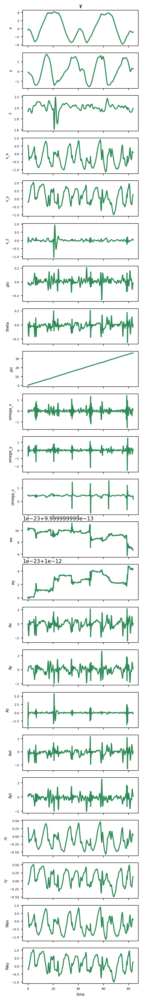

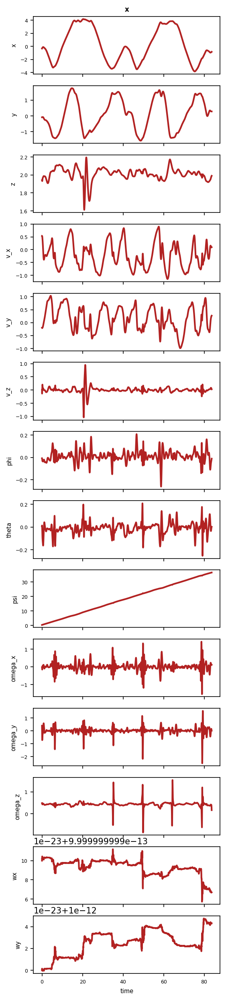

In [202]:
simulator.plot(name='y')
simulator.plot(name='x')

# Observability

In [203]:
drone_model = DroneModel()
z_function=drone_model.z_function

In [204]:
# Set time-window
time_window = 8
# Construct O in sliding windows
st = time.time()
z_state_names = ['x', 'y', 'z', 'g', 'beta', 'v_z', 'phi', 'theta', 'psi', 'omega_x', 'omega_y', 'omega_z', 'W', 'zeta']
SEOM = SlidingEmpiricalObservabilityMatrix(simulator, t_sim, x_sim, u_sim,
                                           w=5, eps=1e-5,
                                           z_function=z_function,
                                           z_state_names=z_state_names)
et = time.time()
print('elapsed time:', et-st)

elapsed time: 837.4593245983124


In [205]:
# Get O's
O_sliding = SEOM.get_observability_matrix()
n_window = len(O_sliding)
print(n_window, 'windows')
SEN=['IMU', 'IMU + OPTIC_FLOW', 'IMU + WIND', 'IMU + WIND + OPTIC_FLOW']
sen='ALL'
if sen == 'ALL':
    print('using all sensors')
    o_sensors = {}
    for sensors in SEN:
        if sensors == 'IMU':
            o_sensors[sensors] = ['phi', 'theta', 'psi', 'omega_x', 'omega_y', 'omega_z', 'Ax', 'Ay', 'Az']
        elif sensors == 'IMU + OPTIC_FLOW':
            o_sensors[sensors] = ['phi', 'theta', 'psi', 'omega_x', 'omega_y', 'omega_z', 'Ax', 'Ay', 'Az', 'rx', 'ry']
        elif sensors == 'IMU + WIND':
            o_sensors[sensors] = ['phi', 'theta', 'psi', 'omega_x', 'omega_y', 'omega_z', 'Ax', 'Ay', 'Az', 'Wax', 'Way']
        elif sensors == 'IMU + WIND + OPTIC_FLOW':
            o_sensors[sensors] = ['phi', 'theta', 'psi', 'omega_x', 'omega_y', 'omega_z',
                                    'Ax', 'Ay', 'Az', 'rx', 'ry', 'Wax', 'Way']

elif sen == 'IMU':
    o_sensors = ['phi', 'theta', 'psi', 'omega_x', 'omega_y', 'omega_z', 'Ax', 'Ay', 'Az']
elif sen == 'IMU + OPTIC_FLOW':
    o_sensors = ['phi', 'theta', 'psi', 'omega_x', 'omega_y', 'omega_z', 'Ax', 'Ay', 'Az', 'rx', 'ry']
elif sen == 'IMU + WIND':
    o_sensors = ['phi', 'theta', 'psi', 'omega_x', 'omega_y', 'omega_z', 'Ax', 'Ay', 'Az', 'Wax', 'Way']
elif sen == 'IMU + WIND + OPTIC_FLOW':
    o_sensors = ['phi', 'theta', 'psi', 'omega_x', 'omega_y', 'omega_z', 'a_x', 'a_y',
                 'Ax', 'Ay', 'Az', 'rx', 'ry', 'Wax', 'Way']


o_states = None
# o_states = simulator.state_names[0:-5] + ['m', 'C', 'I_x']

window_size = 5
o_time_steps = np.arange(0, window_size, step=1)

2787 windows
using all sensors


In [206]:
# Compute the Fisher information & inverse for each window and store the minimum error variance
if sen == 'ALL':
    print('Computing Fisher Information for all sensors')
    SFO = {}
    EV_aligned = {}
    EV_no_nan = {}
    for sensors in SEN:
        print(f'Computing Fisher Information for sensors: {sensors}')
        SFO[sensors] = SlidingFisherObservability(SEOM.O_df_sliding, time=SEOM.t_sim, lam=1e-6, R=0.5,
                                                  states=z_state_names, sensors=o_sensors[sensors], time_steps=o_time_steps, w=window_size)
        EV_aligned[sensors] = SFO[sensors].get_minimum_error_variance()
        EV_no_nan[sensors] = EV_aligned[sensors].fillna(method='bfill').fillna(method='ffill')
else:
    SFO = SlidingFisherObservability(SEOM.O_df_sliding, time=SEOM.t_sim, lam=1e-6, R=0.5**2,
                                 states=z_state_names, sensors=o_sensors, time_steps=o_time_steps, w=window_size)

    EV_aligned = SFO.get_minimum_error_variance()
    EV_no_nan = EV_aligned.fillna(method='bfill').fillna(method='ffill')

Computing Fisher Information for all sensors
Computing Fisher Information for sensors: IMU
Computing Fisher Information for sensors: IMU + OPTIC_FLOW
Computing Fisher Information for sensors: IMU + WIND
Computing Fisher Information for sensors: IMU + WIND + OPTIC_FLOW


In [207]:
import numpy as np
# set max and min to 1e6 and 1e-2 respectively
def flip_scale(data, min_val=-2, max_val=6):
    """
    Flip values in `data` across the interval [min_val, max_val],
    then shift so that the new minimum is 0.

    In other words:
      1. Clip the input to [min_val, max_val].
      2. Flip by:  flipped = (min_val + max_val) - clipped.
      3. Shift up by subtracting min_val, so that the final range is [0, max_val - min_val].

    Parameters
    ----------
    data : array‐like
        Numeric array to transform.
    min_val : float
        Lower bound of the original range (default = -2).
    max_val : float
        Upper bound of the original range (default = 6).

    Returns
    -------
    np.ndarray
        Flipped + shifted array, spanning [0, max_val - min_val].
    """
    arr = np.clip(data, min_val, max_val)
    flipped = (min_val + max_val) - arr
    shifted = flipped - min_val
    return shifted

# STATES = [
#     'x', 'y', 'z',
#     'v_x', 'v_y', 'v_z',
#     'phi', 'theta', 'psi',
#     'omega_x', 'omega_y', 'omega_z',
#     'wx', 'wy'
# ]

STATES = [
    'x', 'y', 'z',
    'g', 'beta', 'v_z',
    'phi', 'theta', 'psi',
    'omega_x', 'omega_y', 'omega_z',
    'W', 'zeta'
]

if sen == 'ALL':
# ---------------------------------------------------------------------
# 3) Build a dict-of-dicts to hold flipped data, meshes, etc.
# ---------------------------------------------------------------------
    flipped   = {state: {} for state in STATES}
    neg_flipped = {state: {} for state in STATES}
    X1        = {state: {} for state in STATES}
    X2        = {state: {} for state in STATES}
    Y1        = {state: {} for state in STATES}
    Y2        = {state: {} for state in STATES}
    dist_map  = {state: {} for state in STATES}
    X_mesh    = {state: {} for state in STATES}
    Y_mesh    = {state: {} for state in STATES}
    C_map     = {state: {} for state in STATES}


    # ---------------------------------------------------------------------
    # 4) Loop over every (state, sensor) pair and compute the arrays:
    # ---------------------------------------------------------------------
    for state in STATES:
        # print(f"\n=== Processing STATE: {state} ===")
        for sensor in SEN:
            # 4a) Flip‐and‐shift the log10(data):
            raw = EV_no_nan[sensor][state]
            flipped[state][sensor] = flip_scale(np.log10(raw))
            neg_flipped[state][sensor] = -flipped[state][sensor]

            # 4b) Time‐arrays (both x1 and x2 are just “time” for your plots):
            X1[state][sensor] = EV_no_nan[sensor]['time']
            X2[state][sensor] = EV_no_nan[sensor]['time']

            # 4c) The two y‐lines (positive flipped and negative flipped):
            Y1[state][sensor] = flipped[state][sensor]
            Y2[state][sensor] = neg_flipped[state][sensor]

            # 4d) Distance‐map (this is the value you want to color by):
            dist_map[state][sensor] = Y1[state][sensor]  # shape (N,), we’ll slice below

            # 4e) Build the mesh (“2×N” for pcolormesh):
            X_mesh[state][sensor] = np.vstack([X1[state][sensor], X2[state][sensor]])  # shape (2,N)
            Y_mesh[state][sensor] = np.vstack([Y1[state][sensor], Y2[state][sensor]])  # shape (2,N)

            # 4f) C_map needs to be shape (1, N−1), so we drop the last element and add newaxis:
            C_map[state][sensor] = dist_map[state][sensor][:-1][np.newaxis, :]

 
else:
    flipped_v_x = flip_scale(np.log10(EV_no_nan['v_x']))

    plt.plot(flipped_v_x,EV_no_nan['time'], label='v_x')
    plt.plot(-1*flipped_v_x,EV_no_nan['time'], label='v_x')
    plt.ylim(11,0)

    # --- (1) Example data; replace with yours ----------
    x1  = EV_no_nan['time']
    x2  = EV_no_nan['time']
    y1 = flipped_v_x
    y2 = flipped_v_x*-1  # Flipped version of y1

    # --- (2) Compute distance between curves at each x ---
    dist = y1   # length N

    # --- (3) Build mesh arrays ---
    X_mesh = np.vstack([x1, x2])          # shape (2, N)
    Y_mesh = np.vstack([y1, y2])        # shape (2, N)
    C      = dist[:-1][np.newaxis, :]   # shape (1, N-1)

    # --- (4) Plot: ---------------------------------------
    fig, ax = plt.subplots(figsize=(7, 2))

    # (4a) First draw the two lines (optional, but often useful):
    ax.plot(x1, y1, color='blue', lw=2.5, label="y₁(x)")
    ax.plot(x2, y2, color='blue', lw=2.5, label="y₂(x)")

    # (4b) Now overlay the “distance‐colormap” between them:
    pc = ax.pcolormesh(
        X_mesh, Y_mesh, C,
        cmap='inferno',
        shading='flat',         # “flat” means each quad is colored uniformly
        edgecolor='none',
        vmin=0, vmax=8
    )

    # (4c) Add a colorbar for reference:
    cbar = plt.colorbar(pc, ax=ax, label='Observability')

    # (4d) Labels/legend:
    ax.set_xlabel("time")
    # ax.set_ylabel("Observability")
    # ax.set_title("observability for v_x")
    # remove yticks 
    ax.set_yticks([])
    # remove border
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    # ax.spines['bottom'].set_visible(False)
    # ax.legend(loc='upper right')

    plt.tight_layout()
    plt.show()


/tmp/ipykernel_434325/2509245495.py:91: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  C_map[state][sensor] = dist_map[state][sensor][:-1][np.newaxis, :]


Plotting heatmap for sensors: IMU
Plotting heatmap for sensors: IMU + OPTIC_FLOW
Plotting heatmap for sensors: IMU + WIND
Plotting heatmap for sensors: IMU + WIND + OPTIC_FLOW


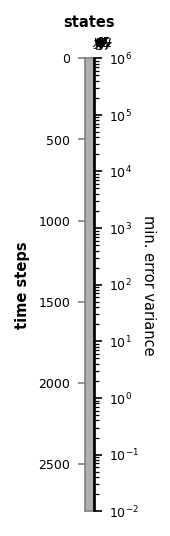

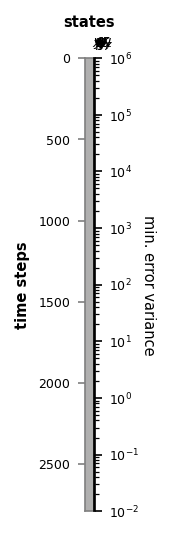

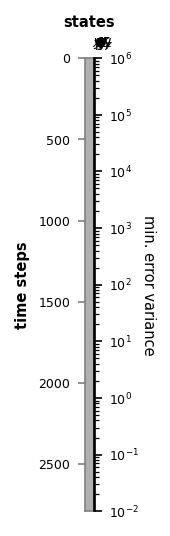

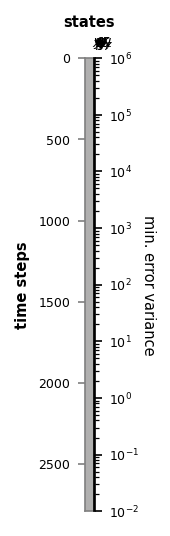

In [208]:
if sen == 'ALL':
    for sensors in SEN:
        # print(f'Plotting heatmap for sensors: {sensors}')
        if o_states is None:
            state_labels = STATES
        else:
            state_labels = STATES
        print(f'Plotting heatmap for sensors: {sensors}')
        cnorm, cmap, log_ticks = ff.plot_heatmap_log_timeseries(EV_no_nan[sensors].iloc[:, 2:].values, log_ticks=(-2, 6),
                                                                data_labels=state_labels, y_label='min. error variance')
else:
    if o_states is None:
        state_labels = STATES
    else:
        state_labels = STATES

    cnorm, cmap, log_ticks = ff.plot_heatmap_log_timeseries(EV_no_nan.iloc[:, 2:].values, log_ticks=(-2, 6),
                                                            data_labels=state_labels, y_label='min. error variance')

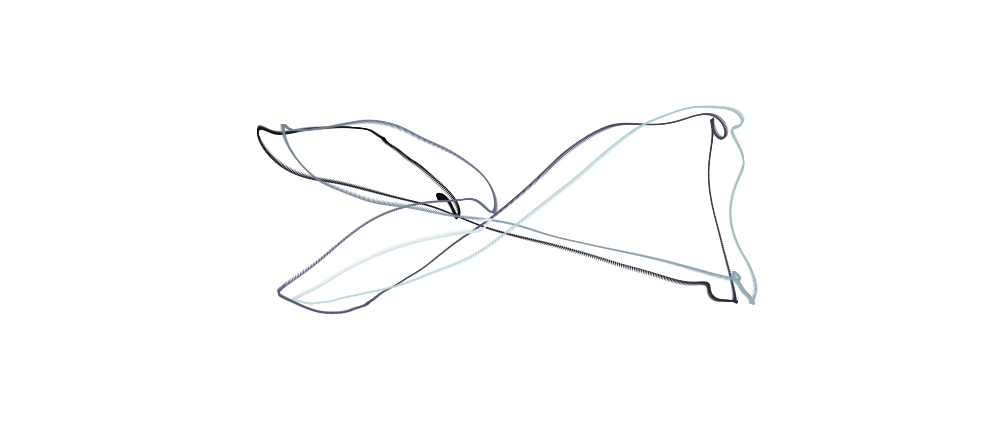

In [209]:
fig, ax = plt.subplots(1, 1, figsize=(3 * 1, 3 * 1), sharex=True, sharey=True, dpi=300)

ff.plot_trajectory(x_sim['x'], x_sim['y'], x_sim['psi'],
                   color=t_sim,
                   ax=ax,
                   size_radius=0.08,
                   nskip=0)

fifi.mpl_functions.adjust_spines(ax, [])
# fig, ax = plt.subplots(1, 1, figsize=(3 * 1, 3 * 1), sharex=True, sharey=True, dpi=300)

# ff.plot_trajectory(np.array(X_DOT_BL_TRUE), np.array(Y_DOT_BL_TRUE), np.array(IMU_YAW),
#                    color=TIME_BL,
#                    ax=ax,
#                    size_radius=0.08,
#                    nskip=0)

# fifi.mpl_functions.adjust_spines(ax, [])

# Cluster Measuerments and Inputs

In [276]:
U_MPC = False
if U_MPC == True:
    P_cluster = np.array(np.vstack([y_sim['x'], y_sim['y'], y_sim['z']]))
    V_BL_cluster = np.array(np.vstack([y_sim['v_x'], y_sim['v_y'], y_sim['v_z']]))
    Attitude_cluster = np.array(np.vstack([y_sim['phi'], y_sim['theta'], y_sim['psi']]))
    Omega_cluster = np.array(np.vstack([y_sim['omega_x'], y_sim['omega_y'], y_sim['omega_z']]))
    Acc_BL_cluster = np.array(np.vstack([y_sim['Ax'], y_sim['Ay'], y_sim['Az']]))
    IMU_cluster = np.array(np.vstack([y_sim['phi'], y_sim['theta'], y_sim['psi'], y_sim['omega_x'], y_sim['omega_y'], y_sim['omega_z'], y_sim['Ax'], y_sim['Ay'], y_sim['Az']]))
    Wind_BL_XY_cluster = np.array(np.vstack([y_sim['Wax'], y_sim['Way']]))
    Wind_BL_cluster = np.array(np.vstack([y_sim['Wax'], y_sim['Way']]))
    OF_BL_cluster = np.array(np.vstack([y_sim['rx'], y_sim['ry']]))
else:
    P_cluster = np.array(np.vstack([X_TRUE,Y_TRUE,Z_TRUE]))
    V_BL_cluster = np.array(np.vstack([X_DOT_BL_TRUE,Y_DOT_BL_TRUE,Z_DOT_BL_TRUE]))
    # V_G_cluster = np.array(np.vstack([X_DOT_G_TRUE,Y_DOT_G_TRUE,Z_DOT_G_TRUE]))
    Attitude_cluster = np.array(np.vstack([Roll_TRUE,Pitch_TRUE,Yaw_TRUE]))
    Omega_cluster = np.array(np.vstack([IMU_OMEGA_X,IMU_OMEGA_Y,IMU_OMEGA_Z]))
    Acc_BL_cluster = np.array(np.vstack([IMU_ACC_BL_X,IMU_ACC_BL_Y,IMU_ACC_BL_Z]))
    IMU_cluster = np.array(np.vstack([IMU_ROLL, IMU_PITCH, IMU_YAW, IMU_OMEGA_X, IMU_OMEGA_Y,IMU_OMEGA_Z,IMU_ACC_BL_X,IMU_ACC_BL_Y,IMU_ACC_BL_Z]))
    Wind_BL_XY_cluster = np.array(np.vstack([Wind_BL_X_Scaled,Wind_BL_Y_Scaled]))
    Wind_BL_cluster = np.array(np.vstack([Wind_BL_X_Scaled,Wind_BL_Y_Scaled]))
    OF_BL_cluster = np.array(np.vstack([OF_BL_X_Scaled,OF_BL_Y_Scaled]))
SENSORS = ['IMU', 'IMU + OPTIC_FLOW', 'IMU + WIND', 'IMU + WIND + OPTIC_FLOW']
Y_SWEEP='ALL'
if Y_SWEEP == 'all':
    Y_BL = np.vstack((P_cluster,V_BL_cluster,Attitude_cluster,Omega_cluster,Acc_BL_cluster,OF_BL_cluster,Wind_BL_XY_cluster))
elif Y_SWEEP == 'IMU + OF + Wind':
    Y_BL = np.vstack((IMU_cluster,OF_BL_cluster,Wind_BL_cluster))
elif Y_SWEEP == 'IMU + OF':
    Y_BL = np.vstack((IMU_cluster,OF_BL_cluster))
elif Y_SWEEP == 'IMU + Wind':
    Y_BL = np.vstack((IMU_cluster,Wind_BL_cluster))
elif Y_SWEEP == 'IMU':
    Y_BL = np.vstack((IMU_cluster))
elif Y_SWEEP == 'ALL':
    Y_BL = {}
    for sensors in SENSORS:
        if sensors == 'IMU':
            Y_BL[sensors] = IMU_cluster
        elif sensors == 'IMU + OPTIC_FLOW':
            Y_BL[sensors] = np.vstack((IMU_cluster, OF_BL_cluster))
        elif sensors == 'IMU + WIND':
            Y_BL[sensors] = np.vstack((IMU_cluster, Wind_BL_XY_cluster))
        elif sensors == 'IMU + WIND + OPTIC_FLOW':
            Y_BL[sensors] = np.vstack((IMU_cluster, Wind_BL_XY_cluster, OF_BL_cluster))

        print(sensors + " : " + str(np.shape(Y_BL[sensors])))

if Y_SWEEP == 'ALL':
    if U_MPC == True:
        U_BL = {}
        for sensors in SENSORS:
            if sensors == 'IMU':
                U_BL[sensors] = np.array(np.vstack([u_sim['PWM1'], u_sim['PWM2'], u_sim['PWM3'], u_sim['PWM4']]))
            elif sensors == 'IMU + OPTIC_FLOW':
                U_BL[sensors] = np.array(np.vstack([u_sim['PWM1'], u_sim['PWM2'], u_sim['PWM3'], u_sim['PWM4']]))
            elif sensors == 'IMU + WIND':
                U_BL[sensors] = np.array(np.vstack([u_sim['PWM1'], u_sim['PWM2'], u_sim['PWM3'], u_sim['PWM4']]))
            elif sensors == 'IMU + WIND + OPTIC_FLOW':
                U_BL[sensors] = np.array(np.vstack([u_sim['PWM1'], u_sim['PWM2'], u_sim['PWM3'], u_sim['PWM4']]))
    else:
        U_BL = {}
        for sensors in SENSORS:
            if sensors == 'IMU':
                U_BL[sensors] = np.array(np.vstack([PWM_1,PWM_2,PWM_3,PWM_4]))
            elif sensors == 'IMU + OPTIC_FLOW':
                U_BL[sensors] = np.array(np.vstack([PWM_1,PWM_2,PWM_3,PWM_4]))
            elif sensors == 'IMU + WIND':
                U_BL[sensors] = np.array(np.vstack([PWM_1,PWM_2,PWM_3,PWM_4]))
            elif sensors == 'IMU + WIND + OPTIC_FLOW':
                U_BL[sensors] = np.array(np.vstack([PWM_1,PWM_2,PWM_3,PWM_4]))
else:
    if U_MPC == True:
        U_BL = np.array(np.vstack([u_sim['PWM1'], u_sim['PWM2'], u_sim['PWM3'], u_sim['PWM4']]))
    else:
        U_BL = np.array(np.vstack([PWM_1,PWM_2,PWM_3,PWM_4]))

# if U_MPC ==True:
#     U_BL = np.array(np.vstack([u_sim['PWM1'], u_sim['PWM2'], u_sim['PWM3'], u_sim['PWM4']]))
# else:
#     U_BL = np.array(np.vstack([PWM_1,PWM_2,PWM_3,PWM_4]))

# print(np.shape(U_BL))


IMU : (9, 2791)
IMU + OPTIC_FLOW : (11, 2791)
IMU + WIND : (11, 2791)
IMU + WIND + OPTIC_FLOW : (13, 2791)


# Get the initial conditions Xo

In [277]:
if Y_SWEEP == 'ALL':
    if U_MPC == True:
        offset = 2.0
        X0_BL = {}
        for sensors in SENSORS:
            if sensors == 'IMU':
                X0_BL[sensors] = np.atleast_2d(np.vstack((float(x_sim['x'][0]) + offset, # X
                                                        float(x_sim['y'][0]) + offset, # Y
                                                        float(x_sim['z'][0]) + offset, # 1/Z = mu
                                                        float(x_sim['v_x'][0]) + offset, # X_DOT
                                                        float(x_sim['v_y'][0]) + offset, # Y_DOT
                                                        float(x_sim['v_z'][0]) + offset, # Z_DOT
                                                        float(x_sim['phi'][0]) + offset, # ROLL
                                                        float(x_sim['theta'][0]) + offset, # PITCH
                                                        float(x_sim['psi'][0]) + offset, # YAW
                                                        float(x_sim['omega_x'][0]) + offset, # OMEGA_X
                                                        float(x_sim['omega_y'][0]) + offset, # OMEGA_Y
                                                        float(x_sim['omega_z'][0]) + offset, # OMEGA_Z
                                                        0 + offset, # wx
                                                        0 + offset # wy
                                                        )))
            elif sensors == 'IMU + OPTIC_FLOW':
                X0_BL[sensors] = np.atleast_2d(np.vstack((float(x_sim['x'][0]) + offset, # X
                                                        float(x_sim['y'][0]) + offset, # Y
                                                        float(x_sim['z'][0]) + offset, # 1/Z = mu
                                                        float(x_sim['v_x'][0]) + offset, # X_DOT
                                                        float(x_sim['v_y'][0]) + offset, # Y_DOT
                                                        float(x_sim['v_z'][0]) + offset, # Z_DOT
                                                        float(x_sim['phi'][0]) + offset, # ROLL
                                                        float(x_sim['theta'][0]) + offset, # PITCH
                                                        float(x_sim['psi'][0]) + offset, # YAW
                                                        float(x_sim['omega_x'][0]) + offset, # OMEGA_X
                                                        float(x_sim['omega_y'][0]) + offset, # OMEGA_Y
                                                        float(x_sim['omega_z'][0]) + offset, # OMEGA_Z
                                                        0 + offset, # wx
                                                        0 + offset # wy
                                                        )))
            elif sensors == 'IMU + WIND':
                X0_BL[sensors] = np.atleast_2d(np.vstack((float(x_sim['x'][0]) + offset, # X
                                                        float(x_sim['y'][0]) + offset, # Y
                                                        float(x_sim['z'][0]) + offset, # 1/Z = mu
                                                        float(x_sim['v_x'][0]) + offset, # X_DOT
                                                        float(x_sim['v_y'][0]) + offset, # Y_DOT
                                                        float(x_sim['v_z'][0]) + offset, # Z_DOT
                                                        float(x_sim['phi'][0]) + offset, # ROLL
                                                        float(x_sim['theta'][0]) + offset, # PITCH
                                                        float(x_sim['psi'][0]) + offset, # YAW
                                                        float(x_sim['omega_x'][0]) + offset, # OMEGA_X
                                                        float(x_sim['omega_y'][0]) + offset, # OMEGA_Y
                                                        float(x_sim['omega_z'][0]) + offset, # OMEGA_Z
                                                        0 + offset, # wx
                                                        0 + offset # wy
                                                        )))
            elif sensors == 'IMU + WIND + OPTIC_FLOW':
                X0_BL[sensors] = np.atleast_2d(np.vstack((float(x_sim['x'][0]) + offset, # X
                                                        float(x_sim['y'][0]) + offset, # Y
                                                        float(x_sim['z'][0]) + offset, # 1/Z = mu
                                                        float(x_sim['v_x'][0]) + offset, # X_DOT
                                                        float(x_sim['v_y'][0]) + offset, # Y_DOT
                                                        float(x_sim['v_z'][0]) + offset, # Z_DOT
                                                        float(x_sim['phi'][0]) + offset, # ROLL
                                                        float(x_sim['theta'][0]) + offset, # PITCH
                                                        float(x_sim['psi'][0]) + offset, # YAW
                                                        float(x_sim['omega_x'][0]) + offset, # OMEGA_X
                                                        float(x_sim['omega_y'][0]) + offset, # OMEGA_Y
                                                        float(x_sim['omega_z'][0]) + offset, # OMEGA_Z
                                                        0 + offset, # wx
                                                        0 + offset # wy
                                                        )))
            print(sensors + " : " + str(np.shape(X0_BL[sensors])))
    else:
        offset = 2.0
        X0_BL = {}
        for sensors in SENSORS:
            if sensors == 'IMU':
                X0_BL[sensors] = np.atleast_2d(np.vstack((X_TRUE[0] + offset, # X
                                                        Y_TRUE[0] + offset, # Y
                                                        Z_TRUE[0] + offset, # 1/Z = mu
                                                        X_DOT_BL_TRUE[0] + offset, # X_DOT
                                                        Y_DOT_BL_TRUE[0] + offset, # Y_DOT
                                                        Z_DOT_BL_TRUE[0] + offset, # Z_DOT
                                                        IMU_ROLL[0] + offset, # ROLL
                                                        IMU_PITCH[0] + offset, # PITCH
                                                        IMU_YAW[0] + offset, # YAW
                                                        IMU_OMEGA_X[0] + offset, # OMEGA_X
                                                        IMU_OMEGA_Y[0] + offset, # OMEGA_Y
                                                        IMU_OMEGA_Z[0] + offset, # OMEGA_Z
                                                        0 + offset, # wx
                                                        0 + offset # wy
                                                        )))
            elif sensors == 'IMU + OPTIC_FLOW':
                X0_BL[sensors] = np.atleast_2d(np.vstack((X_TRUE[0] + offset, # X
                                                        Y_TRUE[0] + offset, # Y
                                                        Z_TRUE[0] + offset, # 1/Z = mu
                                                        X_DOT_BL_TRUE[0] + offset, # X_DOT
                                                        Y_DOT_BL_TRUE[0] + offset, # Y_DOT
                                                        Z_DOT_BL_TRUE[0] + offset, # Z_DOT
                                                        IMU_ROLL[0] + offset, # ROLL
                                                        IMU_PITCH[0] + offset, # PITCH
                                                        IMU_YAW[0] + offset, # YAW
                                                        IMU_OMEGA_X[0] + offset, # OMEGA_X
                                                        IMU_OMEGA_Y[0] + offset, # OMEGA_Y
                                                        IMU_OMEGA_Z[0] + offset, # OMEGA_Z
                                                        0 + offset, # wx
                                                        0 + offset # wy
                                                        )))
            elif sensors == 'IMU + WIND':
                X0_BL[sensors] = np.atleast_2d(np.vstack((X_TRUE[0] + offset, # X
                                                        Y_TRUE[0] + offset, # Y
                                                        Z_TRUE[0] + offset, # 1/Z = mu
                                                        X_DOT_BL_TRUE[0] + offset, # X_DOT
                                                        Y_DOT_BL_TRUE[0] + offset, # Y_DOT
                                                        Z_DOT_BL_TRUE[0] + offset, # Z_DOT
                                                        IMU_ROLL[0] + offset, # ROLL
                                                        IMU_PITCH[0] + offset, # PITCH
                                                        IMU_YAW[0] + offset, # YAW
                                                        IMU_OMEGA_X[0] + offset, # OMEGA_X
                                                        IMU_OMEGA_Y[0] + offset, # OMEGA_Y
                                                        IMU_OMEGA_Z[0] + offset, # OMEGA_Z
                                                        0 + offset, # wx
                                                        0 + offset # wy
                                                        )))
            elif sensors == 'IMU + WIND + OPTIC_FLOW':
                X0_BL[sensors] = np.atleast_2d(np.vstack((X_TRUE[0] + offset, # X
                                                        Y_TRUE[0] + offset, # Y
                                                        Z_TRUE[0] + offset, # 1/Z = mu
                                                        X_DOT_BL_TRUE[0] + offset, # X_DOT
                                                        Y_DOT_BL_TRUE[0] + offset, # Y_DOT
                                                        Z_DOT_BL_TRUE[0] + offset, # Z_DOT
                                                        IMU_ROLL[0] + offset, # ROLL
                                                        IMU_PITCH[0] + offset, # PITCH
                                                        IMU_YAW[0] + offset, # YAW
                                                        IMU_OMEGA_X[0] + offset, # OMEGA_X
                                                        IMU_OMEGA_Y[0] + offset, # OMEGA_Y
                                                        IMU_OMEGA_Z[0] + offset, # OMEGA_Z
                                                        0 + offset, # wx
                                                        0 + offset # wy
                                                        )))
            print(sensors + " : " + str(np.shape(X0_BL[sensors])))
else:
    if U_MPC == True:
        offset = 1.0
        X0_BL = np.atleast_2d(np.vstack((float(x_sim['x'][0]) + offset, # X
                                        float(x_sim['y'][0]) + offset, # Y
                                        float(x_sim['z'][0]) + offset, # 1/Z = mu
                                        float(x_sim['v_x'][0]) + offset, # X_DOT
                                        float(x_sim['v_y'][0]) + offset, # Y_DOT
                                        float(x_sim['v_z'][0]) + offset, # Z_DOT
                                        float(x_sim['phi'][0]) + offset, # ROLL
                                        float(x_sim['theta'][0]) + offset, # PITCH
                                        float(x_sim['psi'][0]) + offset, # YAW
                                        float(x_sim['omega_x'][0]) + offset, # OMEGA_X
                                        float(x_sim['omega_y'][0]) + offset, # OMEGA_Y
                                        float(x_sim['omega_z'][0]) + offset, # OMEGA_Z
                                        0 + offset, # wx
                                        0 + offset # wy
                                        )))
    else:
        offset = 1.0
        X0_BL = np.atleast_2d(np.vstack((X_TRUE[0] + offset, # X
                                        Y_TRUE[0] + offset, # Y
                                        Z_TRUE[0] + offset, # 1/Z = mu
                                        X_DOT_BL_TRUE[0] + offset, # X_DOT
                                        Y_DOT_BL_TRUE[0] + offset, # Y_DOT
                                        Z_DOT_BL_TRUE[0] + offset, # Z_DOT
                                        IMU_ROLL[0] + offset, # ROLL
                                        IMU_PITCH[0] + offset, # PITCH
                                        IMU_YAW[0] + offset, # YAW
                                        IMU_OMEGA_X[0] + offset, # OMEGA_X
                                        IMU_OMEGA_Y[0] + offset, # OMEGA_Y
                                        IMU_OMEGA_Z[0] + offset, # OMEGA_Z
                                        0 + offset, # wx
                                        0 + offset # wy
                                        )))

# if U_MPC == True:
#     offset = 1.0
#     X0_BL = np.atleast_2d(np.vstack((float(x_sim['x'][0]) + offset, # X
#                                     float(x_sim['y'][0]) + offset, # Y
#                                     float(x_sim['z'][0]) + offset, # 1/Z = mu
#                                     float(x_sim['v_x'][0]) + offset, # X_DOT
#                                     float(x_sim['v_y'][0]) + offset, # Y_DOT
#                                     float(x_sim['v_z'][0]) + offset, # Z_DOT
#                                     float(x_sim['phi'][0]) + offset, # ROLL
#                                     float(x_sim['theta'][0]) + offset, # PITCH
#                                     float(x_sim['psi'][0]) + offset, # YAW
#                                     float(x_sim['omega_x'][0]) + offset, # OMEGA_X
#                                     float(x_sim['omega_y'][0]) + offset, # OMEGA_Y
#                                     float(x_sim['omega_z'][0]) + offset, # OMEGA_Z
#                                     float(x_sim['wx'][0]) + offset, # wx
#                                     float(x_sim['wy'][0]) + offset # wy
#                                     )))
# else:
#     offset = 1.0
#     X0_BL = np.atleast_2d(np.vstack((X_TRUE[0] + offset, # X
#                                     Y_TRUE[0] + offset, # Y
#                                     Z_TRUE[0] + offset, # 1/Z = mu
#                                     X_DOT_BL_TRUE[0] + offset, # X_DOT
#                                     Y_DOT_BL_TRUE[0] + offset, # Y_DOT
#                                     Z_DOT_BL_TRUE[0] + offset, # Z_DOT
#                                     IMU_ROLL[0] + offset, # ROLL
#                                     IMU_PITCH[0] + offset, # PITCH
#                                     IMU_YAW[0] + offset, # YAW
#                                     IMU_OMEGA_X[0] + offset, # OMEGA_X
#                                     IMU_OMEGA_Y[0] + offset, # OMEGA_Y
#                                     IMU_OMEGA_Z[0] + offset, # OMEGA_Z
#                                     0 + offset, # wx
#                                     0 + offset # wy
#                                     )))

print(offset)

IMU : (14, 1)
IMU + OPTIC_FLOW : (14, 1)
IMU + WIND : (14, 1)
IMU + WIND + OPTIC_FLOW : (14, 1)
2.0


# System Covariance

In [278]:
if Y_SWEEP == 'ALL':
    Q_BL = {}
    for sensors in SENSORS:
        Q_BL[sensors] = np.diag(np.array([1.0e-2, # x
                                         1.0e-2, # y
                                         1.0e-20, # z
                                         1.0e-5, # x_dot_body_level
                                         1.0e-5, # y_dot_body_level
                                         1.0e-20, # z_dot_body_level
                                         1.0e-2, # roll (phi)
                                         1.0e-2, # pitch (theta)
                                         1.0e-2, # yaw (psi)
                                         1.0e3, # omega_x
                                         1.0e3, # omega_y
                                         1.0e3, # omega_z
                                         1.0e-10, # wind_x (wx)
                                         1.0e-10 # wind_y (wy)
                                         ]))
        print(sensors + " : " + str(np.shape(Q_BL[sensors])))
else:
    Q_BL = np.diag(np.array([1.0e-2, # x
                             1.0e-2, # y
                             1.0e-20, # z
                             1.0e-5, # x_dot_body_level
                             1.0e-5, # y_dot_body_level
                             1.0e-20, # z_dot_body_level
                             1.0e-2, # roll (phi)
                             1.0e-2, # pitch (theta)
                             1.0e-2, # yaw (psi)
                             1.0e3, # omega_x
                             1.0e3, # omega_y
                             1.0e3, # omega_z
                             1.0e-10, # wind_x (wx)
                             1.0e-10 # wind_y (wy)
                             ]))
    print(np.shape(Q_BL))




# Q_BL = np.diag(np.array([1.0e-2, # x
#                          1.0e-2, # y
#                          1.0e-20, # z
#                          1.0e-5, # x_dot_body_level
#                          1.0e-5, # y_dot_body_level
#                          1.0e-20, # z_dot_body_level
#                          1.0e-2, # roll (phi)
#                          1.0e-2, # pitch (theta)
#                          1.0e-2, # yaw (psi)
#                          1.0e3, # omega_x
#                          1.0e3, # omega_y
#                          1.0e3, # omega_z
#                          1.0e-10, # wind_x (wx)
#                          1.0e-10 # wind_y (wy)
#                          ]))

# print(np.shape(Q_BL))

IMU : (14, 14)
IMU + OPTIC_FLOW : (14, 14)
IMU + WIND : (14, 14)
IMU + WIND + OPTIC_FLOW : (14, 14)


# Error Covariance

In [279]:
P_V_cluster = np.vstack(np.array(([0.02,0.02,0.02])))
V_V_BL_cluster = np.vstack(np.array(([0.02,0.02,0.02])))
V_V_G_cluster = np.vstack(np.array(([0.02,0.02,0.02])))
Attitude_V_cluster = np.vstack(np.array(([0.02,0.02,0.02])))
# Omega_V_cluster = np.vstack(np.array(([0.2,0.2,0.1])))
Omega_V_cluster = np.vstack(np.array(([mocap_omega_noise**2, mocap_omega_noise**2, mocap_omega_noise**2])))
# Acc_V_BL_cluster = np.vstack(np.array(([2,2,2])))
Acc_V_BL_cluster = np.vstack(np.array(([acceleration_noise**2,acceleration_noise**2,acceleration_noise**2])))
IMU_V_cluster = np.vstack(np.array(([0.0001, 0.0001, 0.0001, mocap_omega_noise**2, mocap_omega_noise**2, mocap_omega_noise**2, acceleration_noise**2, acceleration_noise**2, acceleration_noise**2])))
Wind_V_BL_XY_cluster = np.vstack(np.array(([0.2,0.4])))
Wind_V_BL_cluster = np.vstack(np.array(([0.2,0.2])))
# Wind_V_BL_cluster = np.vstack(np.array(([1e10,1e10])))
OF_V_BL_cluster = np.vstack(np.array(([0.09,0.09])))
# OF_V_BL_cluster = np.vstack(np.array(([1e10,1e10])))


# use the y sweep flag to determine which noise values to use
if Y_SWEEP == 'all':
    P_V = np.vstack((P_V_cluster,V_V_BL_cluster,Attitude_V_cluster,Omega_V_cluster,Acc_V_BL_cluster,OF_V_BL_cluster,Wind_V_BL_XY_cluster))
    R_BL = np.power(np.diag(V_BL.flatten()),2)
elif Y_SWEEP == 'IMU + OF + Wind':
    V_BL = np.vstack([IMU_V_cluster,OF_V_BL_cluster,Wind_V_BL_cluster])
    R_BL = np.power(np.diag(V_BL.flatten()),2)
elif Y_SWEEP == 'IMU + OF':
    V_BL = np.vstack([IMU_V_cluster,OF_V_BL_cluster])
    R_BL = np.power(np.diag(V_BL.flatten()),2)
elif Y_SWEEP == 'IMU + Wind':
    V_BL = np.vstack([IMU_V_cluster,Wind_V_BL_cluster])
    R_BL = np.power(np.diag(V_BL.flatten()),2)
elif Y_SWEEP == 'IMU':
    V_BL = np.vstack([IMU_V_cluster])
    R_BL = np.power(np.diag(V_BL.flatten()),2)
elif Y_SWEEP == 'ALL':
    V_BL = {}
    R_BL = {}
    for sensors in SENSORS:
        if sensors == 'IMU':
            V_BL[sensors] = IMU_V_cluster
            R_BL[sensors] = np.power(np.diag(V_BL[sensors].flatten()),2)
        elif sensors == 'IMU + OPTIC_FLOW':
            V_BL[sensors] = np.vstack((IMU_V_cluster, OF_V_BL_cluster))
            R_BL[sensors] = np.power(np.diag(V_BL[sensors].flatten()),2)
        elif sensors == 'IMU + WIND':
            V_BL[sensors] = np.vstack((IMU_V_cluster, Wind_V_BL_XY_cluster))
            R_BL[sensors] = np.power(np.diag(V_BL[sensors].flatten()),2)
        elif sensors == 'IMU + WIND + OPTIC_FLOW':
            V_BL[sensors] = np.vstack((IMU_V_cluster, Wind_V_BL_XY_cluster, OF_V_BL_cluster))
            R_BL[sensors] = np.power(np.diag(V_BL[sensors].flatten()),2)

        print(sensors + " : " + str(np.shape(R_BL[sensors])))


# R_BL = np.power(np.diag(V_BL.flatten()),2)

# print(np.shape(R_BL))

IMU : (9, 9)
IMU + OPTIC_FLOW : (11, 11)
IMU + WIND : (11, 11)
IMU + WIND + OPTIC_FLOW : (13, 13)


# Initial Estimate Covariance

In [280]:
if Y_SWEEP == 'ALL':
    P0_BL = {}
    for sensors in SENSORS:
        P0_BL[sensors] = np.diag(np.array([offset**2, # x
                                          offset**2, # y
                                          offset**2, # z
                                          offset**2, # v_x
                                          offset**2, # v_y
                                          offset**2, # v_z
                                          offset**2, # phi
                                          offset**2, # theta
                                          offset**2, # psi
                                          offset**2, # omega_x
                                          offset**2, # omega_y
                                          offset**2, # omega_z
                                          offset**2, # wx
                                          offset**2 # wy
                                       ]))
        print(sensors + " : " + str(np.shape(P0_BL[sensors])))
else:
    P0_BL = np.diag(np.array([offset**2, # x
                          offset**2, # y
                          offset**2, # z
                          offset**2, # v_x
                          offset**2, # v_y
                          offset**2, # v_z
                          offset**2, # phi
                          offset**2, # theta
                          offset**2, # psi
                          offset**2, # omega_x
                          offset**2, # omega_y
                          offset**2, # omega_z
                          offset**2, # wx
                          offset**2 # wy
                       ]))
    print(np.shape(P0_BL))

# P0_BL = np.diag(np.array([offset**2, # x
#                           offset**2, # y
#                           offset**2, # z
#                           offset**2, # v_x
#                           offset**2, # v_y
#                           offset**2, # v_z
#                           offset**2, # phi
#                           offset**2, # theta
#                           offset**2, # psi
#                           offset**2, # omega_x
#                           offset**2, # omega_y
#                           offset**2, # omega_z
#                           offset**2, # wx
#                           offset**2 # wy
#                        ]))



IMU : (14, 14)
IMU + OPTIC_FLOW : (14, 14)
IMU + WIND : (14, 14)
IMU + WIND + OPTIC_FLOW : (14, 14)


# check sizes

In [281]:
# check that all inputs are a two-dimensional array
if Y_SWEEP == 'ALL':
    for sensors in SENSORS:
        print(sensors + " : " )
        print('Ynoisy:', Y_BL[sensors].shape)
        print('x0:', X0_BL[sensors].shape)
        print('U:', U_BL[sensors].shape)
        print('Q:', Q_BL[sensors].shape)
        print('R:', R_BL[sensors].shape)
        print('P0:', P0_BL[sensors].shape)
        if Y_BL[sensors].shape[0] != R_BL[sensors].shape[0]:
            raise ValueError(f"Y_BL[{sensors}] and R_BL[{sensors}] must have the same number of rows")
        elif Y_BL[sensors].shape[0] != R_BL[sensors].shape[1]:
            raise ValueError(f"Y_BL[{sensors}] and R_BL[{sensors}] must have the same number of columns")
        elif X0_BL[sensors].shape[0] != P0_BL[sensors].shape[0]:
            raise ValueError(f"X0_BL[{sensors}] and P0_BL[{sensors}] must have the same number of rows")
        elif X0_BL[sensors].shape[0] != P0_BL[sensors].shape[1]:
            raise ValueError(f"X0_BL[{sensors}] and P0_BL[{sensors}] must have the same number of columns")
        elif X0_BL[sensors].shape[0] != Q_BL[sensors].shape[0]:
            raise ValueError(f"X0_BL[{sensors}] and Q_BL[{sensors}] must have the same number of rows")
        elif X0_BL[sensors].shape[0] != Q_BL[sensors].shape[1]:
            raise ValueError(f"X0_BL[{sensors}] and Q_BL[{sensors}] must have the same number of columns")
        else:
            print("All inputs for " + sensors + " are the right shape")
else:
    print('Ynoisy:', Y_BL.shape)
    print('x0:', X0_BL.shape)
    print('U:', U_BL.shape)
    print('Q:', Q_BL.shape)
    print('R:', R_BL.shape)
    print('P0:', P0_BL.shape)
    if Y_BL.shape[0] != R_BL.shape[0]:
        raise ValueError("Y_BL and R_BL must have the same number of rows")
    elif Y_BL.shape[0] != R_BL.shape[1]:
        raise ValueError("Y_BL and R_BL must have the same number of columns")
    elif X0_BL.shape[0] != P0_BL.shape[0]:
        raise ValueError("X0_BL and P0_BL must have the same number of rows")
    elif X0_BL.shape[0] != P0_BL.shape[1]:
        raise ValueError("X0_BL and P0_BL must have the same number of columns")
    elif X0_BL.shape[0] != Q_BL.shape[0]:
        raise ValueError("X0_BL and Q_BL must have the same number of rows")
    elif X0_BL.shape[0] != Q_BL.shape[1]:
        raise ValueError("X0_BL and Q_BL must have the same number of columns")
    else:
        print("All inputs are the right shape")




IMU : 
Ynoisy: (9, 2791)
x0: (14, 1)
U: (4, 2791)
Q: (14, 14)
R: (9, 9)
P0: (14, 14)
All inputs for IMU are the right shape
IMU + OPTIC_FLOW : 
Ynoisy: (11, 2791)
x0: (14, 1)
U: (4, 2791)
Q: (14, 14)
R: (11, 11)
P0: (14, 14)
All inputs for IMU + OPTIC_FLOW are the right shape
IMU + WIND : 
Ynoisy: (11, 2791)
x0: (14, 1)
U: (4, 2791)
Q: (14, 14)
R: (11, 11)
P0: (14, 14)
All inputs for IMU + WIND are the right shape
IMU + WIND + OPTIC_FLOW : 
Ynoisy: (13, 2791)
x0: (14, 1)
U: (4, 2791)
Q: (14, 14)
R: (13, 13)
P0: (14, 14)
All inputs for IMU + WIND + OPTIC_FLOW are the right shape


In [282]:
drone_model = DroneModel()
f_c=drone_model.f_c_car

def outer(func):
    def wrapper(*args, **kwargs):
        global DT_BL
        args = list(args) + [DT_BL]
        value = func(*args)
        return value
    return wrapper

f_c = outer(drone_model.f_c_car)

ALL_SENSORS = ['IMU',
               'IMU + OPTIC_FLOW',
               'IMU + WIND',
               'IMU + WIND + OPTIC_FLOW']

# 3) Write a decorator that takes an “input_sensor” string (default None).
#    If input_sensor is not None, it will always call h_c_small(..., input_sensor).
#    If input_sensor is None, it will use the global Y_SWEEP instead.

def outer_h(func, input_sensor=None):
    if input_sensor is None:
        # If no explicit sensor is passed, use whatever Y_SWEEP currently is
        def wrapper(*args, **kwargs):
            global Y_SWEEP
            # Convert args → list, append Y_SWEEP, then call func
            full_args = list(args) + [Y_SWEEP]
            return func(*full_args)
    else:
        # If input_sensor is provided in the decorator, always use that
        def wrapper(*args, **kwargs):
            full_args = list(args) + [input_sensor]
            return func(*full_args)
    return wrapper


# 4) Now build h_c depending on whether Y_SWEEP == 'ALL' or not:
Y_SWEEP = 'ALL'
if Y_SWEEP == 'ALL':
    # We want h_c to be a dict:  { sensor_str: wrapped_function, … }
    h_c = {}
    for sensor_name in ALL_SENSORS:
        print(f'getting measurement dynamics for sensors: {sensor_name}')
        # Decorate h_c_car so that it always receives sensor_name as its last argument
        h_c[sensor_name] = outer_h(drone_model.h_c_car, input_sensor=sensor_name)

else:
    # Only a single sensor is requested—wrap h_c_car so it uses whatever Y_SWEEP is
    print(f'getting measurement dynamics for sensors: {Y_SWEEP}')
    h_c = outer_h(drone_model.h_c_car)

getting measurement dynamics for sensors: IMU
getting measurement dynamics for sensors: IMU + OPTIC_FLOW
getting measurement dynamics for sensors: IMU + WIND
getting measurement dynamics for sensors: IMU + WIND + OPTIC_FLOW


In [283]:
if Y_SWEEP == 'ALL':
    xhat_BL = {}
    P_BL = {}
    s_BL = {}
    for sensors in SENSORS:
        print(f'Running EKF for sensor: {sensors}')
        tst = time.time()
        xhat_BL[sensors], P_BL[sensors], s_BL[sensors] = EKF(Y_BL[sensors], X0_BL[sensors], f_c, h_c[sensors], Q_BL[sensors], R_BL[sensors], U_BL[sensors], P0_BL[sensors])
        tet = time.time()
        print(f'Execution time for {sensors}: {tet - tst} seconds')
else:
    print(f'Running EKF for sensor: {Y_SWEEP}')
    tst = time.time()
    xhat_BL, P_BL, s_BL = EKF(Y_BL, X0_BL, f_c, h_c, Q_BL, R_BL, U_BL, P0_BL)
    tet = time.time()
    print(f'Execution time for {Y_SWEEP}: {tet - tst} seconds')


Running EKF for sensor: IMU
Execution time for IMU: 683.972437620163 seconds
Running EKF for sensor: IMU + OPTIC_FLOW
Execution time for IMU + OPTIC_FLOW: 708.8243162631989 seconds
Running EKF for sensor: IMU + WIND
Execution time for IMU + WIND: 684.351487159729 seconds
Running EKF for sensor: IMU + WIND + OPTIC_FLOW
Execution time for IMU + WIND + OPTIC_FLOW: 710.4387314319611 seconds


In [300]:
# creat dictionary from xhat
if Y_SWEEP == 'ALL':
    print('Creating xhat_dict for all sensors...')
    xhat_dict = {}
    for sensor in SENSORS:
        xhat_dict[sensor] = {
            'x_hat': xhat_BL[sensor][0, :],
            'y_hat': xhat_BL[sensor][1, :],
            'z_hat': xhat_BL[sensor][2, :],
            'v_x_hat': xhat_BL[sensor][3, :],
            'v_y_hat': xhat_BL[sensor][4, :],
            'v_z_hat': xhat_BL[sensor][5, :],
            'phi_hat': xhat_BL[sensor][6, :],
            'theta_hat': xhat_BL[sensor][7, :],
            'psi_hat': xhat_BL[sensor][8, :],
            'omega_x_hat': xhat_BL[sensor][9, :],
            'omega_y_hat': xhat_BL[sensor][10, :],
            'omega_z_hat': xhat_BL[sensor][11, :],
            'wx_hat': xhat_BL[sensor][12, :],
            'wy_hat': xhat_BL[sensor][13, :],
            'g_hat': (xhat_BL[sensor][3, :]**2 + xhat_BL[sensor][4, :]**2)**0.5,
            'beta_hat': np.arctan2(xhat_BL[sensor][4, :], xhat_BL[sensor][3, :]),
            'W_hat':(xhat_BL[sensor][12, :]**2 + xhat_BL[sensor][13, :]**2)**0.5,
            'zeta_hat': np.arctan2(xhat_BL[sensor][13, :], xhat_BL[sensor][12, :]),
        }
else:

    xhat_dict = {
        'x_hat': xhat_BL[0, :],
        'y_hat': xhat_BL[1, :],
        'z_hat': xhat_BL[2, :],
        'v_x_hat': xhat_BL[3, :],
        'v_y_hat': xhat_BL[4, :],
        'v_z_hat': xhat_BL[5, :],
        'phi_hat': xhat_BL[6, :],
        'theta_hat': xhat_BL[7, :],
        'psi_hat': xhat_BL[8, :],
        'omega_x_hat': xhat_BL[9, :],
        'omega_y_hat': xhat_BL[10, :],
        'omega_z_hat': xhat_BL[11, :],
        'wx_hat': xhat_BL[12, :],
        'wy_hat': xhat_BL[13, :],
        'g_hat': (xhat_BL[3, :]**2 + xhat_BL[4, :]**2)**0.5,
        'beta_hat': np.arctan2(xhat_BL[4, :], xhat_BL[3, :]),
        'W_hat':(xhat_BL[12, :]**2 + xhat_BL[13, :]**2)**0.5,
        'zeta_hat': np.arctan2(xhat_BL[13, :], xhat_BL[12, :]),
}

Creating xhat_dict for all sensors...


In [301]:
# x_hat_BL = xhat_BL[0,:]  # x estimate
# y_hat_BL = xhat_BL[1,:]  # y estimate
# z_hat_BL = xhat_BL[2,:]  # z estimate
# v_x_hat_BL = xhat_BL[3,:]  # v_x estimate
# v_y_hat_BL = xhat_BL[4,:]  # v_y estimate
# v_g_hat_BL = (v_x_hat_BL**2 + v_y_hat_BL**2)**0.5  # v_g estimate
# beta_hat_BL = np.arctan2(v_y_hat_BL, v_x_hat_BL)  # beta estimate
# v_z_hat_BL = xhat_BL[5,:]  # v_z estimate
# phi_hat_BL = xhat_BL[6,:]  # phi estimate
# theta_hat_BL = xhat_BL[7,:]  # theta estimate
# psi_hat_BL = xhat_BL[8,:]  # psi estimate
# omega_x_hat_BL = xhat_BL[9,:]  # omega_x estimate
# omega_y_hat_BL = xhat_BL[10,:]  # omega_y estimate
# omega_z_hat_BL = xhat_BL[11,:]  # omega_z estimate
# # w_hat_BL = xhat_BL[12,:]  # w estimate
# # zeta_hat_BL = xhat_BL[13,:]  # zeta estimate
# wx_hat_BL = xhat_BL[12,:]  # wx estimate
# wy_hat_BL = xhat_BL[13,:]  # wy estimate
# W_hat_BL = np.sqrt(wx_hat_BL**2 + wy_hat_BL**2)  # W estimate
# zeta_hat_BL = np.arctan2(wy_hat_BL, wx_hat_BL)  # zeta estimate

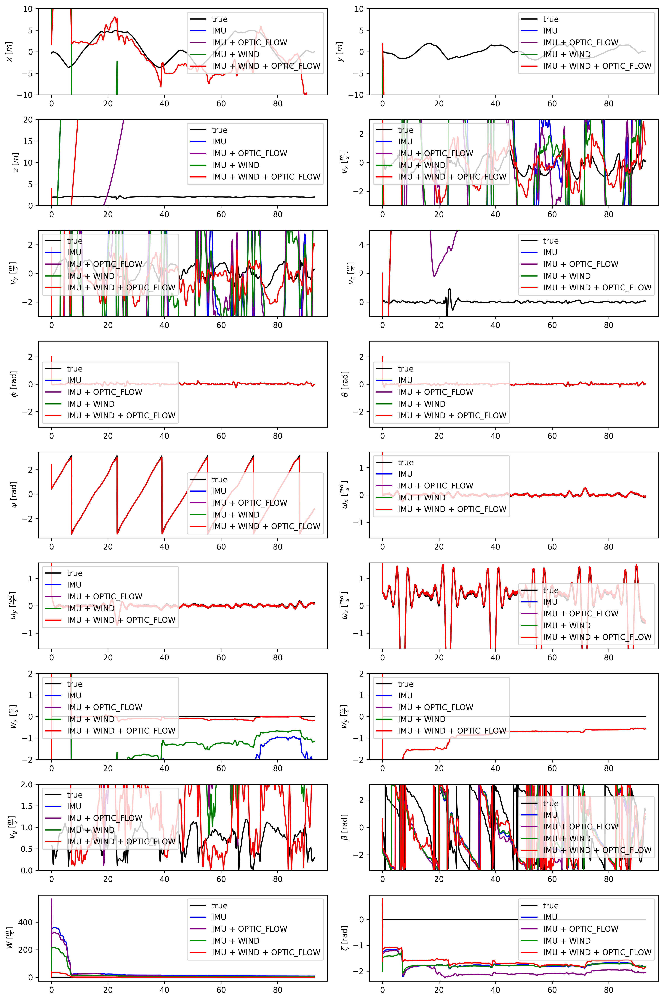

In [302]:
# --- Plotting for all sensors or just one, depending on Y_SWEEP ---

colors = {}
for sensor in SENSORS:
    if sensor == 'IMU':
        colors[sensor] = 'blue'
    elif sensor == 'IMU + OPTIC_FLOW':
        colors[sensor] = 'purple'
    elif sensor == 'IMU + WIND':
        colors[sensor] = 'green'
    elif sensor == 'IMU + WIND + OPTIC_FLOW':
        colors[sensor] = 'red'
    elif sensor == 'IMU + VEL + WIND':
        colors[sensor] = 'orange'
    else:
        raise ValueError('Invalid sensor type')

fig, ax = plt.subplots(9, 2, figsize=(3 * 4, 3 * 6), dpi=300)

if Y_SWEEP == 'ALL':
    # Plot for all sensors in SENSORS
    for i, (label, true_data, est_key, ylim, ylabel) in enumerate([
        ('$x$ [$m$]', X_TRUE, 'x_hat', (-10, 10), '$x$ [$m$]'),
        ('$y$ [$m$]', Y_TRUE, 'y_hat', (-10, 10), '$y$ [$m$]'),
        ('$z$ [$m$]', Z_TRUE, 'z_hat', (0, 20), '$z$ [$m$]'),
        (r'$v_x$ [$\frac{m}{s}$]', X_DOT_BL_TRUE, 'v_x_hat', (-3, 3), r'$v_x$ [$\frac{m}{s}$]'),
        (r'$v_y$ [$\frac{m}{s}$]', Y_DOT_BL_TRUE, 'v_y_hat', (-3, 3), r'$v_y$ [$\frac{m}{s}$]'),
        (r'$v_z$ [$\frac{m}{s}$]', Z_DOT_BL_TRUE, 'v_z_hat', (-1, 5), r'$v_z$ [$\frac{m}{s}$]'),
        ('$\\phi$ [rad]', IMU_ROLL, 'phi_hat', (-1*np.pi, 1*np.pi), '$\\phi$ [rad]'),
        (r'$\theta$ [rad]', IMU_PITCH, 'theta_hat', (-1*np.pi, 1*np.pi), r'$\theta$ [rad]'),
        ('$\\psi$ [rad]', IMU_YAW, 'psi_hat', None, '$\\psi$ [rad]'),
        (r'$\omega_x$ [$\frac{rad}{s}$]', IMU_OMEGA_X, 'omega_x_hat', (-0.5*np.pi, 0.5*np.pi), r'$\omega_x$ [$\frac{rad}{s}$]'),
        (r'$\omega_y$ [$\frac{rad}{s}$]', IMU_OMEGA_Y, 'omega_y_hat', (-0.5*np.pi, 0.5*np.pi), r'$\omega_y$ [$\frac{rad}{s}$]'),
        (r'$\omega_z$ [$\frac{rad}{s}$]', IMU_OMEGA_Z, 'omega_z_hat', (-0.5*np.pi, 0.5*np.pi), r'$\omega_z$ [$\frac{rad}{s}$]'),
        (r'$w_{x}$ [$\frac{m}{s}$]', np.zeros_like(TIME_BL), 'wx_hat', (-2, 2), r'$w_{x}$ [$\frac{m}{s}$]'),
        (r'$w_{y}$ [$\frac{m}{s}$]', np.zeros_like(TIME_BL), 'wy_hat', (-2, 2), r'$w_{y}$ [$\frac{m}{s}$]'),
        (r'$v_g$ [$\frac{m}{s}$]', np.sqrt(np.array(X_DOT_BL_TRUE)**2 + np.array(Y_DOT_BL_TRUE)**2), 'g_hat', (0, 2), r'$v_g$ [$\frac{m}{s}$]'),
        (r'$\beta$ [rad]', np.arctan2(np.array(Y_DOT_BL_TRUE), np.array(X_DOT_BL_TRUE)), 'beta_hat', (-np.pi, np.pi), r'$\beta$ [rad]'),
        (r'$W$ [$\frac{m}{s}$]', np.zeros_like(TIME_BL), 'W_hat', None, r'$W$ [$\frac{m}{s}$]'),
        (r'$\zeta$ [rad]', np.zeros_like(TIME_BL), 'zeta_hat', None, r'$\zeta$ [rad]')
    ]):
        row, col = divmod(i, 2)
        ax[row, col].plot(TIME_BL, true_data, label='true', color='black')
        for sensor in SENSORS:
            ax[row, col].plot(TIME_BL, xhat_dict[sensor][est_key], label=sensor, color=colors[sensor])
        ax[row, col].set_ylabel(ylabel)
        if ylim is not None:
            ax[row, col].set_ylim(*ylim)
        ax[row, col].legend()

    plt.tight_layout()
    plt.show()
else:
    # Plot for a single sensor (xhat_dict is not a dict of dicts)
    ax[0, 0].plot(TIME_BL, X_TRUE, label='true', color='black')
    ax[0, 0].plot(TIME_BL, xhat_dict['x_hat'], label='estimate')
    ax[0, 0].set_ylabel('$x$ [$m$]')
    ax[0, 0].set_ylim(-10, 10)
    ax[0, 0].legend()

    ax[1, 0].plot(TIME_BL, Y_TRUE, label='true', color='black')
    ax[1, 0].plot(TIME_BL, xhat_dict['y_hat'], label='estimate')
    ax[1, 0].set_ylabel('$y$ [$m$]')
    ax[1, 0].set_ylim(-10, 10)
    ax[1, 0].legend()

    ax[2, 0].plot(TIME_BL, Z_TRUE, label='true', color='black')
    ax[2, 0].plot(TIME_BL, xhat_dict['z_hat'], label='estimate')
    ax[2, 0].set_ylabel('$z$ [$m$]')
    ax[2, 0].set_ylim(0, 20)
    ax[2, 0].legend()

    ax[0, 1].plot(TIME_BL, X_DOT_BL_TRUE, label='true', color='black')
    ax[0, 1].plot(TIME_BL, xhat_dict['v_x_hat'], label='estimate')
    ax[0, 1].set_ylabel(r'$v_x$ [$\frac{m}{s}$]')
    ax[0, 1].set_ylim(-3, 3)
    ax[0, 1].legend()

    ax[1, 1].plot(TIME_BL, Y_DOT_BL_TRUE, label='true', color='black')
    ax[1, 1].plot(TIME_BL, xhat_dict['v_y_hat'], label='estimate')
    ax[1, 1].set_ylabel(r'$v_y$ [$\frac{m}{s}$]')
    ax[1, 1].set_ylim(-3, 3)
    ax[1, 1].legend()

    ax[2, 1].plot(TIME_BL, Z_DOT_BL_TRUE, label='true', color='black')
    ax[2, 1].plot(TIME_BL, xhat_dict['v_z_hat'], label='estimate')
    ax[2, 1].set_ylabel(r'$v_z$ [$\frac{m}{s}$]')
    ax[2, 1].set_ylim(-1, 5)
    ax[2, 1].legend()

    ax[3, 0].plot(TIME_BL, IMU_ROLL, label='true', color='black')
    ax[3, 0].plot(TIME_BL, xhat_dict['phi_hat'], label='estimate')
    ax[3, 0].set_ylabel('$\phi$ [rad]')
    ax[3, 0].set_ylim(-1*np.pi, 1*np.pi)
    ax[3, 0].legend()

    ax[4, 0].plot(TIME_BL, IMU_PITCH, label='true', color='black')
    ax[4, 0].plot(TIME_BL, xhat_dict['theta_hat'], label='estimate')
    ax[4, 0].set_ylabel(r'$\theta$ [rad]')
    ax[4, 0].set_ylim(-1*np.pi, 1*np.pi)
    ax[4, 0].legend()

    ax[5, 0].plot(TIME_BL, IMU_YAW, label='true', color='black')
    ax[5, 0].plot(TIME_BL, xhat_dict['psi_hat'], label='estimate')
    ax[5, 0].set_ylabel('$\psi$ [rad]')
    ax[5, 0].legend()

    ax[3, 1].plot(TIME_BL, IMU_OMEGA_X, label='true', color='black')
    ax[3, 1].plot(TIME_BL, xhat_dict['omega_x_hat'], label='estimate')
    ax[3, 1].set_ylabel(r'$\omega_x$ [$\frac{rad}{s}$]')
    ax[3, 1].set_ylim(-0.5*np.pi, 0.5*np.pi)
    ax[3, 1].legend()

    ax[4, 1].plot(TIME_BL, IMU_OMEGA_Y, label='true', color='black')
    ax[4, 1].plot(TIME_BL, xhat_dict['omega_y_hat'], label='estimate')
    ax[4, 1].set_ylabel(r'$\omega_y$ [$\frac{rad}{s}$]')
    ax[4, 1].set_ylim(-0.5*np.pi, 0.5*np.pi)
    ax[4, 1].legend()

    ax[5, 1].plot(TIME_BL, IMU_OMEGA_Z, label='true', color='black')
    ax[5, 1].plot(TIME_BL, xhat_dict['omega_z_hat'], label='estimate')
    ax[5, 1].set_ylabel(r'$\omega_z$ [$\frac{rad}{s}$]')
    ax[5, 1].set_ylim(-0.5*np.pi, 0.5*np.pi)
    ax[5, 1].legend()

    ax[6, 0].plot(TIME_BL, np.zeros_like(TIME_BL), label='true', color='black')
    ax[6, 0].plot(TIME_BL, xhat_dict['wx_hat'], label='estimate')
    ax[6, 0].set_ylabel(r'$w_{x}$ [$\frac{m}{s}$]')
    ax[6, 0].set_ylim(-2, 2)
    ax[6, 0].legend()

    ax[6, 1].plot(TIME_BL, np.zeros_like(TIME_BL), label='true', color='black')
    ax[6, 1].plot(TIME_BL, xhat_dict['wy_hat'], label='estimate')
    ax[6, 1].set_ylabel(r'$w_{y}$ [$\frac{m}{s}$]')
    ax[6, 1].set_ylim(-2, 2)
    ax[6, 1].legend()

    ax[7, 0].plot(TIME_BL, np.sqrt(np.array(X_DOT_BL_TRUE)**2 + np.array(Y_DOT_BL_TRUE)**2), label='true', color='black')
    ax[7, 0].plot(TIME_BL, xhat_dict['g_hat'], label='estimate')
    ax[7, 0].set_ylabel(r'$v_g$ [$\frac{m}{s}$]')
    ax[7, 0].set_ylim(0, 2)
    ax[7, 0].legend()

    ax[7, 1].plot(TIME_BL, np.arctan2(np.array(Y_DOT_BL_TRUE), np.array(X_DOT_BL_TRUE)), label='true', color='black')
    ax[7, 1].plot(TIME_BL, xhat_dict['beta_hat'], label='estimate')
    ax[7, 1].set_ylabel(r'$\beta$ [rad]')
    ax[7, 1].set_ylim(-np.pi, np.pi)
    ax[7, 1].legend()

    ax[8, 0].plot(TIME_BL, np.zeros_like(TIME_BL), label='true', color='black')
    ax[8, 0].plot(TIME_BL, xhat_dict['W_hat'], label='estimate')
    ax[8, 0].set_ylabel(r'$W$ [$\frac{m}{s}$]')
    ax[8, 0].legend()

    ax[8, 1].plot(TIME_BL, np.zeros_like(TIME_BL), label='true', color='black')
    ax[8, 1].plot(TIME_BL, xhat_dict['zeta_hat'], label='estimate')
    ax[8, 1].set_ylabel(r'$\zeta$ [rad]')
    ax[8, 1].legend()

    plt.tight_layout()
    plt.show()

# big plots

In [303]:
# fig, ax = plt.subplots(9, 2, figsize=(3 * 4, 3 * 6), dpi=300)

# # plot x
# ax[0, 0].plot(TIME_BL, X_TRUE, label='true', color='black')
# ax[0, 0].plot(TIME_BL, x_hat_BL, label='estimate')
# ax[0, 0].set_ylabel('$x$ [$m$]')
# ax[0, 0].set_ylim(-10, 10)
# ax[0, 0].legend()

# # plot y
# ax[1, 0].plot(TIME_BL, Y_TRUE, label='true', color='black')
# ax[1, 0].plot(TIME_BL, y_hat_BL, label='estimate')
# ax[1, 0].set_ylabel('$y$ [$m$]')
# ax[1, 0].set_ylim(-10, 10)
# ax[1, 0].legend()

# # plot z
# ax[2, 0].plot(TIME_BL, Z_TRUE, label='true', color='black')
# ax[2, 0].plot(TIME_BL, z_hat_BL, label='estimate')
# ax[2, 0].set_ylabel('$z$ [$m$]')
# ax[2, 0].set_ylim(0, 20)
# ax[2, 0].legend()

# # plot v_x
# ax[0, 1].plot(TIME_BL, X_DOT_BL_TRUE, label='true', color='black')
# ax[0, 1].plot(TIME_BL, v_x_hat_BL, label='estimate')
# ax[0, 1].set_ylabel(r'$v_x$ [$\frac{m}{s}$]')
# ax[0, 1].set_ylim(-3, 3)
# ax[0, 1].legend()

# # plot v_y
# ax[1, 1].plot(TIME_BL, Y_DOT_BL_TRUE, label='true', color='black')
# ax[1, 1].plot(TIME_BL, v_y_hat_BL, label='estimate')
# ax[1, 1].set_ylabel(r'$v_y$ [$\frac{m}{s}$]')
# ax[1, 1].set_ylim(-3, 3)
# ax[1, 1].legend()

# # plot v_z
# ax[2, 1].plot(TIME_BL, Z_DOT_BL_TRUE, label='true', color='black')
# ax[2, 1].plot(TIME_BL, v_z_hat_BL, label='estimate')
# ax[2, 1].set_ylabel(r'$v_z$ [$\frac{m}{s}$]')
# ax[2, 1].set_ylim(-1, 5)
# ax[2, 1].legend()

# # plot phi
# ax[3, 0].plot(TIME_BL, IMU_ROLL, label='true', color='black')
# ax[3, 0].plot(TIME_BL, phi_hat_BL, label='estimate')
# ax[3, 0].set_ylabel('$\phi$ [rad]')
# ax[3, 0].set_ylim(-1*np.pi, 1*np.pi)
# ax[3, 0].legend()

# # plot theta
# ax[4, 0].plot(TIME_BL, IMU_PITCH, label='true', color='black')
# ax[4, 0].plot(TIME_BL, theta_hat_BL, label='estimate')
# ax[4, 0].set_ylabel(r'$\theta$ [rad]')
# ax[4, 0].set_ylim(-1*np.pi, 1*np.pi)
# ax[4, 0].legend()

# # plot psi
# ax[5, 0].plot(TIME_BL, IMU_YAW, label='true', color='black')
# ax[5, 0].plot(TIME_BL, psi_hat_BL, label='estimate')
# ax[5, 0].set_ylabel('$\psi$ [rad]')
# ax[5, 0].legend()

# # plot omega_x
# ax[3, 1].plot(TIME_BL, IMU_OMEGA_X, label='true', color='black')
# ax[3, 1].plot(TIME_BL, omega_x_hat_BL, label='estimate')
# ax[3, 1].set_ylabel(r'$\omega_x$ [$\frac{rad}{s}$]')
# ax[3, 1].set_ylim(-0.5*np.pi, 0.5*np.pi)
# ax[3, 1].legend()

# # plot omega_y
# ax[4, 1].plot(TIME_BL, IMU_OMEGA_Y, label='true', color='black')
# ax[4, 1].plot(TIME_BL, omega_y_hat_BL, label='estimate')
# ax[4, 1].set_ylabel(r'$\omega_y$ [$\frac{rad}{s}$]')
# ax[4, 1].set_ylim(-0.5*np.pi, 0.5*np.pi)
# ax[4, 1].legend()

# # plot omega_z
# ax[5, 1].plot(TIME_BL, IMU_OMEGA_Z, label='true', color='black')
# ax[5, 1].plot(TIME_BL, omega_z_hat_BL, label='estimate')
# ax[5, 1].set_ylabel(r'$\omega_z$ [$\frac{rad}{s}$]')
# ax[5, 1].set_ylim(-0.5*np.pi, 0.5*np.pi)
# ax[5, 1].legend()

# # plot wx
# ax[6, 0].plot(TIME_BL, np.zeros_like(TIME_BL), label='true', color='black')
# ax[6, 0].plot(TIME_BL, wx_hat_BL, label='estimate')
# ax[6, 0].set_ylabel(r'$w_{x}$ [$\frac{m}{s}$]')
# ax[6, 0].set_ylim(-2, 2)
# ax[6, 0].legend()

# # plot wy
# ax[6, 1].plot(TIME_BL, np.zeros_like(TIME_BL), label='true', color='black')
# ax[6, 1].plot(TIME_BL, wy_hat_BL, label='estimate')
# ax[6, 1].set_ylabel(r'$w_{y}$ [$\frac{m}{s}$]')
# ax[6, 1].set_ylim(-2, 2)
# ax[6, 1].legend()

# # plot v_g (ground speed)
# ax[7, 0].plot(TIME_BL, np.sqrt(np.array(X_DOT_BL_TRUE)**2 + np.array(Y_DOT_BL_TRUE)**2), label='true', color='black')
# ax[7, 0].plot(TIME_BL, v_g_hat_BL, label='estimate')
# ax[7, 0].set_ylabel(r'$v_g$ [$\frac{m}{s}$]')
# ax[7, 0].set_ylim(0, 2)
# ax[7, 0].legend()

# # plot beta (ground direction)
# ax[7, 1].plot(TIME_BL, np.arctan2(np.array(Y_DOT_BL_TRUE), np.array(X_DOT_BL_TRUE)), label='true', color='black')
# ax[7, 1].plot(TIME_BL, beta_hat_BL, label='estimate')
# ax[7, 1].set_ylabel(r'$\beta$ [rad]')
# ax[7, 1].set_ylim(-np.pi, np.pi)
# ax[7, 1].legend()

# # Optionally, plot W and zeta in additional figures or replace above if you want them in this grid:
# ax[8, 0].plot(TIME_BL, np.zeros_like(TIME_BL), label='true', color='black')
# ax[8, 0].plot(TIME_BL, W_hat_BL, label='estimate')
# ax[8, 0].set_ylabel(r'$W$ [$\frac{m}{s}$]')
# ax[8, 0].legend()
# ax[8, 1].plot(TIME_BL, np.zeros_like(TIME_BL), label='true', color='black')
# ax[8, 1].plot(TIME_BL, zeta_hat_BL, label='estimate')
# ax[8, 1].set_ylabel(r'$\zeta$ [rad]')
# ax[8, 1].legend()
# plt.tight_layout()

# # Calculate RMSE between true and estimated states
# RMSE_x = np.sqrt(np.mean((X_TRUE - x_hat_BL) ** 2))
# RMSE_y = np.sqrt(np.mean((Y_TRUE - y_hat_BL) ** 2))
# RMSE_z = np.sqrt(np.mean((Z_TRUE - z_hat_BL) ** 2))
# RMSE_v_x = np.sqrt(np.mean((X_DOT_BL_TRUE - v_x_hat_BL) ** 2))
# RMSE_v_y = np.sqrt(np.mean((Y_DOT_BL_TRUE - v_y_hat_BL) ** 2))
# RMSE_v_z = np.sqrt(np.mean((Z_DOT_BL_TRUE - v_z_hat_BL) ** 2))
# RMSE_phi = np.sqrt(np.mean((IMU_ROLL - phi_hat_BL) ** 2))
# RMSE_theta = np.sqrt(np.mean((IMU_PITCH - theta_hat_BL) ** 2))
# RMSE_psi = np.sqrt(np.mean((IMU_YAW - psi_hat_BL) ** 2))
# RMSE_omega_x = np.sqrt(np.mean((IMU_OMEGA_X - omega_x_hat_BL) ** 2))
# RMSE_omega_y = np.sqrt(np.mean((IMU_OMEGA_Y - omega_y_hat_BL) ** 2))
# RMSE_omega_z = np.sqrt(np.mean((IMU_OMEGA_Z - omega_z_hat_BL) ** 2))
# RMSE_wx = np.sqrt(np.mean((np.zeros_like(TIME_BL) - wx_hat_BL) ** 2))
# RMSE_wy = np.sqrt(np.mean((np.zeros_like(TIME_BL) - wy_hat_BL) ** 2))
# RMSE_v_g = np.sqrt(np.mean((np.sqrt(np.array(X_DOT_BL_TRUE)**2 + np.array(Y_DOT_BL_TRUE)**2) - v_g_hat_BL) ** 2))
# RMSE_beta = np.sqrt(np.mean((np.arctan2(np.array(Y_DOT_BL_TRUE), np.array(X_DOT_BL_TRUE)) - beta_hat_BL) ** 2))
# RMSE_W = np.sqrt(np.mean((np.zeros_like(TIME_BL) - W_hat_BL) ** 2))
# RMSE_zeta = np.sqrt(np.mean((np.zeros_like(TIME_BL) - zeta_hat_BL) ** 2))

# # Combine RMSE values into an array
# RMSE = np.array([
#     RMSE_x, RMSE_y, RMSE_z, RMSE_v_x, RMSE_v_y, RMSE_v_z,
#     RMSE_phi, RMSE_theta, RMSE_psi, RMSE_omega_x, RMSE_omega_y, RMSE_omega_z,
#     RMSE_wx, RMSE_wy, RMSE_v_g, RMSE_beta, RMSE_W, RMSE_zeta
# ])

# # Plot RMSE as a bar graph (add to a new figure or use an empty subplot)
# fig_rmse, ax_rmse = plt.subplots(figsize=(12, 4), dpi=300)
# ax_rmse.bar(np.arange(len(RMSE)), RMSE)
# ax_rmse.set_ylabel('RMSE')
# ax_rmse.set_xticks(np.arange(len(RMSE)))
# ax_rmse.set_xticklabels([
#     '$x$', '$y$', '$z$', '$v_x$', '$v_y$', '$v_z$', '$\phi$', r'$\theta$', '$\psi$',
#     '$\omega_x$', '$\omega_y$', '$\omega_z$', '$w_x$', '$w_y$', '$v_g$', r'$\beta$', '$W$', r'$\zeta$'
# ], rotation=45)
# plt.tight_layout()
# plt.show()

In [304]:
# # plot v_g , vz, z , and W
# fig,ax = plt.subplots(4, 1, figsize=(3 * 3, 3 * 4), dpi=300)
# # plot v_g
# ax[0].plot(TIME_BL, np.sqrt(np.array(X_DOT_BL_TRUE)**2 + np.array(Y_DOT_BL_TRUE)**2), label='v_g true', color='black')
# ax[0].plot(TIME_BL, v_g_hat_BL, label='v_g estimate', color='red')
# ax[0].set_ylabel(r'$v_g$ [$\frac{m}{s}$]')
# ax[0].set_ylim(0, 2)
# ax[0].legend()
# # plot v_z
# ax[1].plot(TIME_BL, Z_DOT_BL_TRUE, label='v_z true', color='black')
# ax[1].plot(TIME_BL, v_z_hat_BL, label='v_z estimate', color='red')
# ax[1].set_ylabel(r'$v_z$ [$\frac{m}{s}$]')
# ax[1].set_ylim(-1, 5)
# ax[1].legend()
# # plot z
# ax[2].plot(TIME_BL, Z_TRUE, label='z true', color='black')
# ax[2].plot(TIME_BL, z_hat_BL, label='z estimate', color='red')
# ax[2].set_ylabel(r'$z$ [$m$]')
# ax[2].set_ylim(0, 20)
# ax[2].legend()
# # plot W
# ax[3].plot(TIME_BL, np.zeros_like(TIME_BL), label='W true', color='black')
# ax[3].plot(TIME_BL, W_hat_BL, label='W estimate', color='red')
# ax[3].set_ylabel(r'$W$ [$\frac{m}{s}$]')
# ax[3].set_ylim(-1, 2)
# ax[3].legend()
# plt.tight_layout()

# Start of FIGURE FIRST

In [305]:
from IPython.display import display,SVG

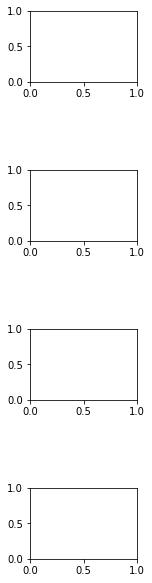

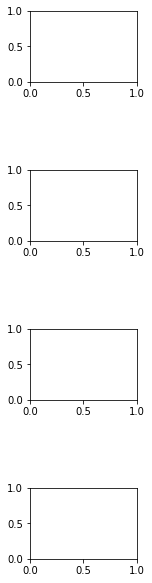

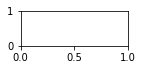

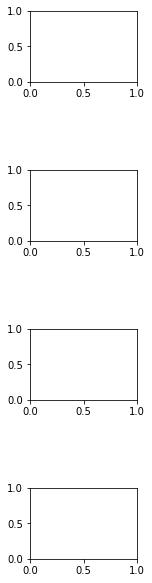

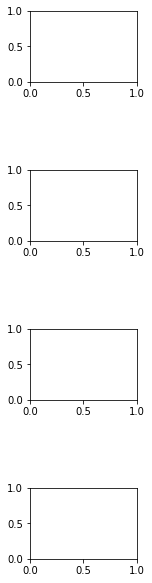

...

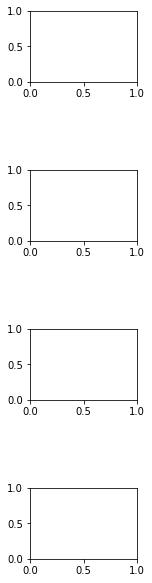

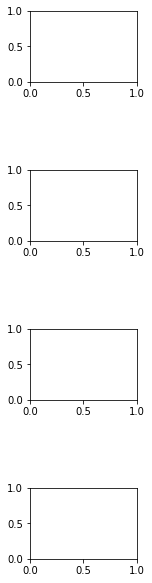

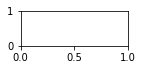

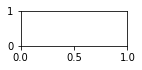

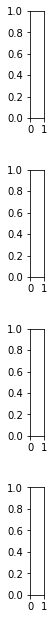

In [306]:
input_svg = '/home/austinlopez/Drone_AFRL/paper_figures/Fig_6_01.svg'
layout = fifi.svg_to_axes.FigureLayout(input_svg, autogenlayers=True, make_mplfigures=True, hide_layers=[])

In [307]:
TIME_BL

0        0.000000
1        0.033037
2        0.066961
3        0.098812
4        0.131857
          ...    
2786    92.874610
2787    92.900099
2788    92.933122
2789    92.967020
2790    93.001142
Name: rosbagTimestamp, Length: 2791, dtype: float64

In [308]:
Flag=False
if Flag:
    # Create a new figure
    fig = plt.figure(figsize=(2, 2))

    # Add an axes to the figure
    ax = fig.add_subplot(111)

else:
    if motif == 'p2p':
        ax = layout.axes[('con_vel_traj', 'A')]
    elif motif == 'p2p_con_yaw':
        ax = layout.axes[('con_vel_con_yaw_traj', 'A')]
    elif motif == 'acc':
        ax = layout.axes[('con_acc_traj', 'A')]
    elif motif == 'sine':
        ax = layout.axes[('sine_traj', 'A')]
    elif motif == 'sine_constant_heading':
        ax = layout.axes[('sine_con_head_traj', 'A')]

ax.set_title(f"Trajectory: {motif}")
cmap = plt.get_cmap('bone')
norm = mpl.colors.Normalize(vmin=np.array(TIME_BL)[0], vmax=np.array(TIME_BL)[-1])
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

# overlay triangles with color by time
tri = np.array([[.1,0],[-.05,-.05],[-.05,.05]]) * 2.0
for i in range(0, len(np.array(TIME_BL)), 5):
    R = np.array([[np.cos(IMU_YAW[i]), -np.sin(IMU_YAW[i])],
                [np.sin(IMU_YAW[i]),  np.cos(IMU_YAW[i])]])
    tri_r = tri @ R.T
    color = cmap(norm(TIME_BL[i]))
    ax.fill(X_TRUE[i]+tri_r[:,0],
            Y_TRUE[i]+tri_r[:,1],
            color=color, alpha=0.8, edgecolor=None)
fifi.mpl_functions.adjust_spines(ax, [], yticks=[-3, 0, 3], xticks=[-6, -4, -2, 0, 2, 4, 6],
                                      tick_length=3, linewidth=1, spine_locations={'left': 5, 'bottom': 5})
fifi.mpl_functions.set_fontsize(ax, 6)

ax.set_xlim([-6, 6])
ax.set_ylim([-3, 3])
ax.set_yticklabels([-3, 0, 3])
ax.set_xticklabels([-6, -4, -2, 0, 2, 4, 6])

if Flag:
        plt.show()
        fig.savefig(f'{motif}_.pdf', dpi=300)

In [309]:
#['p2p', 'p2p_con_yaw', 'acc', 'sine']
if motif == 'p2p':
    layout.append_figure_to_layer(layout.figures['con_vel_traj'], 'con_vel_traj', cleartarget=True)
elif motif == 'p2p_con_yaw':
    layout.append_figure_to_layer(layout.figures['con_vel_con_yaw_traj'], 'con_vel_con_yaw_traj', cleartarget=True)
elif motif == 'acc':
    layout.append_figure_to_layer(layout.figures['con_acc_traj'], 'con_acc_traj', cleartarget=True)
elif motif == 'sine':
    layout.append_figure_to_layer(layout.figures['sine_traj'], 'sine_traj', cleartarget=True)
elif motif == 'sine_constant_heading':
    layout.append_figure_to_layer(layout.figures['sine_con_head_traj'], 'sine_con_head_traj', cleartarget=True)
layout.write_svg(input_svg)
display(SVG(input_svg))

In [310]:
np.array(TIME_BL)[-1]

93.00114154815674

In [311]:
Flag=False
if Flag:
    # Create a new figure
    fig = plt.figure(figsize=(2, 2))

    # Add an axes to the figure
    ax = fig.add_subplot(111)

else:
    if motif == 'p2p':
        ax = layout.axes[('con_vel', 'A')]
    elif motif == 'p2p_con_yaw':
        ax = layout.axes[('con_vel_con_yaw', 'A')]
    elif motif == 'acc':
        ax = layout.axes[('con_acc', 'A')]
    elif motif == 'sine':
        ax = layout.axes[('sine', 'A')]
    elif motif == 'sine_constant_heading':
        ax = layout.axes[('sine_con_head', 'A')]


STATE_A = 'g'

if Y_SWEEP == 'ALL':
    print('Plotting results for all sensors...')
    # Add colored sensor names at the top, each on a new line
    sensor_labels = [
        ('IMU', colors['IMU']),
        ('IMU + OPTIC_FLOW', colors['IMU + OPTIC_FLOW']),
        ('IMU + WIND', colors['IMU + WIND']),
        ('IMU + WIND + OPTIC_FLOW', colors['IMU + WIND + OPTIC_FLOW'])
    ]

    if STATE_A == 'g':
        x_sim_g = np.sqrt(np.array(X_DOT_BL_TRUE)**2 + np.array(Y_DOT_BL_TRUE)**2)
        ax.plot(TIME_BL, x_sim_g, label=STATE_A, color='k')
    elif STATE_A == 'beta':
        x_sim_b = np.arctan2(np.array(Y_DOT_BL_TRUE), np.array(X_DOT_BL_TRUE))
        ax.plot(TIME_BL, x_sim_b, label=STATE_A, color='k')
    elif STATE_A == 'W':
        x_sim_W = np.zeros_like(TIME_BL)
        ax.plot(TIME_BL, x_sim_W, label=STATE_A, color='k')
    elif STATE_A == 'zeta':
        x_sim_z = np.zeros_like(TIME_BL)
        ax.plot(TIME_BL, x_sim_z, label=STATE_A, color='k')
    else:
        ax.plot(TIME_BL, x_sim[STATE_A], label=STATE_A, color='k')
    # add truth to SENSORS at the start call it LEGENDS
    LEGENDS = ['Truth'] + SENSORS
    for sensor in SENSORS:
        ax.plot(TIME_BL, xhat_dict[sensor][f'{STATE_A}_hat'], label=f'{STATE_A}_hat', color=colors[sensor])
    if motif != 'p2p':
        ax.set_ylabel('')
    else:
        ax.set_ylabel(f'{STATE_A} \n (m/s)')
    ax.set_ylim([-5, 5])

    fifi.mpl_functions.adjust_spines(ax, ['left'], yticks=[-5, 0, 5], xticks=[0, 10, 20, 30, 40, 50, 60, 70, 80],
                                      tick_length=3, linewidth=1, spine_locations={'left': 5, 'bottom': 5})
    ax.set_yticklabels([-5, 0, 5])
    ax.set_xticklabels([0, 10, 20, 30, 40, 50, 60, 70, 80])
    ax.set_xlim([0, 80])
    # ax.set_aspect('equal')
    # ax.set_rasterized(True)
    ax.set_ylabel(f'{STATE_A} \n (m/s)')
    # ax.set_xlabel('Time (s)')
    fifi.mpl_functions.set_fontsize(ax, 6)
    ############

    # ax.set_rasterization_zorder(0)

    if Flag:
        plt.show()
        fig.savefig(f'{STATE_A}_velocity.pdf', dpi=300)

Plotting results for all sensors...


In [312]:
Flag=False
if Flag:
    # Create a new figure
    fig = plt.figure(figsize=(2, 2))

    # Add an axes to the figure
    ax = fig.add_subplot(111)

else:
    if motif == 'p2p':
        ax = layout.axes[('con_vel', 'B')]
    elif motif == 'p2p_con_yaw':
        ax = layout.axes[('con_vel_con_yaw', 'B')]
    elif motif == 'acc':
        ax = layout.axes[('con_acc', 'B')]
    elif motif == 'sine':
        ax = layout.axes[('sine', 'B')]
    elif motif == 'sine_constant_heading':
        ax = layout.axes[('sine_con_head', 'B')]


STATE_B = 'v_z'

if Y_SWEEP == 'ALL':
    print('Plotting results for all sensors...')
    # Add colored sensor names at the top, each on a new line
    sensor_labels = [
        ('IMU', colors['IMU']),
        ('IMU + OPTIC_FLOW', colors['IMU + OPTIC_FLOW']),
        ('IMU + WIND', colors['IMU + WIND']),
        ('IMU + WIND + OPTIC_FLOW', colors['IMU + WIND + OPTIC_FLOW'])
    ]

    if STATE_B == 'g':
        x_sim_g = np.sqrt(np.array(X_DOT_BL_TRUE)**2 + np.array(Y_DOT_BL_TRUE)**2)
        ax.plot(TIME_BL, x_sim_g, label=STATE_B, color='k')
    elif STATE_B == 'beta':
        x_sim_b = np.arctan2(np.array(Y_DOT_BL_TRUE), np.array(X_DOT_BL_TRUE))
        ax.plot(TIME_BL, x_sim_b, label=STATE_B, color='k')
    elif STATE_B == 'W':
        x_sim_W = np.zeros_like(TIME_BL)
        ax.plot(TIME_BL, x_sim_W, label=STATE_B, color='k')
    elif STATE_B == 'zeta':
        x_sim_z = np.zeros_like(TIME_BL)
        ax.plot(TIME_BL, x_sim_z, label=STATE_B, color='k')
    else:
        ax.plot(TIME_BL, Z_DOT_BL_TRUE, label=STATE_B, color='k')
    # add truth to SENSORS at the start call it LEGENDS
    LEGENDS = ['Truth'] + SENSORS
    for sensor in SENSORS:
        ax.plot(TIME_BL, xhat_dict[sensor][f'{STATE_B}_hat'], label=f'{STATE_B}_hat', color=colors[sensor])
    if motif != 'p2p':
        ax.set_ylabel('')
    else:
        ax.set_ylabel(f'{STATE_B} \n (m/s)')
    ax.set_ylim([-5, 5])

    fifi.mpl_functions.adjust_spines(ax, ['left'], yticks=[-5, 0, 5], xticks=[0, 10, 20, 30, 40, 50, 60, 70, 80],
                                      tick_length=3, linewidth=1, spine_locations={'left': 5, 'bottom': 5})
    ax.set_yticklabels([-5, 0, 5])
    ax.set_xticklabels([0, 10, 20, 30, 40, 50, 60, 70, 80])
    ax.set_xlim([0, 80])
    # ax.set_aspect('equal')
    # ax.set_rasterized(True)
    ax.set_ylabel(f'{STATE_B} \n (m/s)')
    # ax.set_xlabel('Time (s)')
    fifi.mpl_functions.set_fontsize(ax, 6)
    ############

    # ax.set_rasterization_zorder(0)

    if Flag:
        plt.show()
        fig.savefig(f'{STATE_B}_velocity.pdf', dpi=300)

Plotting results for all sensors...


In [313]:
Flag=False
if Flag:
    # Create a new figure
    fig = plt.figure(figsize=(2, 2))

    # Add an axes to the figure
    ax = fig.add_subplot(111)

else:
    if motif == 'p2p':
        ax = layout.axes[('con_vel', 'C')]
    elif motif == 'p2p_con_yaw':
        ax = layout.axes[('con_vel_con_yaw', 'C')]
    elif motif == 'acc':
        ax = layout.axes[('con_acc', 'C')]
    elif motif == 'sine':
        ax = layout.axes[('sine', 'C')]
    elif motif == 'sine_constant_heading':
        ax = layout.axes[('sine_con_head', 'C')]


STATE_C = 'z'

if Y_SWEEP == 'ALL':
    print('Plotting results for all sensors...')
    # Add colored sensor names at the top, each on a new line
    sensor_labels = [
        ('IMU', colors['IMU']),
        ('IMU + OPTIC_FLOW', colors['IMU + OPTIC_FLOW']),
        ('IMU + WIND', colors['IMU + WIND']),
        ('IMU + WIND + OPTIC_FLOW', colors['IMU + WIND + OPTIC_FLOW'])
    ]

    if STATE_C == 'g':
        x_sim_g = np.sqrt(np.array(X_DOT_BL_TRUE)**2 + np.array(Y_DOT_BL_TRUE)**2)
        ax.plot(TIME_BL, x_sim_g, label=STATE_C, color='k')
    elif STATE_C == 'beta':
        x_sim_b = np.arctan2(np.array(Y_DOT_BL_TRUE), np.array(X_DOT_BL_TRUE))
        ax.plot(TIME_BL, x_sim_b, label=STATE_C, color='k')
    elif STATE_C == 'W':
        x_sim_W = np.zeros_like(TIME_BL)
        ax.plot(TIME_BL, x_sim_W, label=STATE_C, color='k')
    elif STATE_C == 'zeta':
        x_sim_z = np.zeros_like(TIME_BL)
        ax.plot(TIME_BL, x_sim_z, label=STATE_C, color='k')
    else:
        ax.plot(TIME_BL, Z_TRUE, label=STATE_C, color='k')
    # add truth to SENSORS at the start call it LEGENDS
    LEGENDS = ['Truth'] + SENSORS
    for sensor in SENSORS:
        ax.plot(TIME_BL, xhat_dict[sensor][f'{STATE_C}_hat'], label=f'{STATE_C}_hat', color=colors[sensor])
    if motif != 'p2p':
        ax.set_ylabel('')
    else:
        ax.set_ylabel(f'{STATE_C} \n (m/s)')
    ax.set_ylim([-5, 5])

    fifi.mpl_functions.adjust_spines(ax, ['left'], yticks=[-5, 0, 5], xticks=[0, 10, 20, 30, 40, 50, 60, 70, 80],
                                      tick_length=3, linewidth=1, spine_locations={'left': 5, 'bottom': 5})
    ax.set_yticklabels([-5, 0, 5])
    ax.set_xticklabels([0, 10, 20, 30, 40, 50, 60, 70, 80])
    ax.set_xlim([0, 80])
    # ax.set_aspect('equal')
    # ax.set_rasterized(True)
    ax.set_ylabel(f'{STATE_C}\n m')
    # ax.set_xlabel('Time (s)')
    fifi.mpl_functions.set_fontsize(ax, 6)
    ############

    # ax.set_rasterization_zorder(0)

    if Flag:
        plt.show()
        fig.savefig(f'{STATE_C}_velocity.pdf', dpi=300)

Plotting results for all sensors...


In [314]:
Flag=False
if Flag:
    # Create a new figure
    fig = plt.figure(figsize=(2, 2))

    # Add an axes to the figure
    ax = fig.add_subplot(111)

else:
    if motif == 'p2p':
        ax = layout.axes[('con_vel', 'D')]
    elif motif == 'p2p_con_yaw':
        ax = layout.axes[('con_vel_con_yaw', 'D')]
    elif motif == 'acc':
        ax = layout.axes[('con_acc', 'D')]
    elif motif == 'sine':
        ax = layout.axes[('sine', 'D')]
    elif motif == 'sine_constant_heading':
        ax = layout.axes[('sine_con_head', 'D')]


STATE_D = 'W'

if Y_SWEEP == 'ALL':
    print('Plotting results for all sensors...')
    # Add colored sensor names at the top, each on a new line
    sensor_labels = [
        ('IMU', colors['IMU']),
        ('IMU + OPTIC_FLOW', colors['IMU + OPTIC_FLOW']),
        ('IMU + WIND', colors['IMU + WIND']),
        ('IMU + WIND + OPTIC_FLOW', colors['IMU + WIND + OPTIC_FLOW'])
    ]

    if STATE_D == 'g':
        x_sim_g = np.sqrt(np.array(X_DOT_BL_TRUE)**2 + np.array(Y_DOT_BL_TRUE)**2)
        ax.plot(TIME_BL, x_sim_g, label=STATE_D, color='k')
    elif STATE_D == 'beta':
        x_sim_b = np.arctan2(np.array(Y_DOT_BL_TRUE), np.array(X_DOT_BL_TRUE))
        ax.plot(TIME_BL, x_sim_b, label=STATE_D, color='k')
    elif STATE_D == 'W':
        x_sim_W = np.zeros_like(TIME_BL)
        ax.plot(TIME_BL, x_sim_W, label=STATE_D, color='k')
    elif STATE_D == 'zeta':
        x_sim_z = np.zeros_like(TIME_BL)
        ax.plot(TIME_BL, x_sim_z, label=STATE_D, color='k')
    else:
        ax.plot(TIME_BL, np.zeros_like(TIME_BL), label=STATE_D, color='k')
    # add truth to SENSORS at the start call it LEGENDS
    LEGENDS = ['Truth'] + SENSORS
    for sensor in SENSORS:
        ax.plot(TIME_BL, xhat_dict[sensor][f'{STATE_D}_hat'], label=f'{STATE_D}_hat', color=colors[sensor])
    if motif != 'p2p':
        ax.set_ylabel('')
    else:
        ax.set_ylabel(f'{STATE_D} \n (m/s)')
    ax.set_ylim([-5, 5])

    fifi.mpl_functions.adjust_spines(ax, ['left'], yticks=[-5, 0, 5], xticks=[0, 10, 20, 30, 40, 50, 60, 70, 80],
                                      tick_length=3, linewidth=1, spine_locations={'left': 5, 'bottom': 5})
    ax.set_yticklabels([-5, 0, 5])
    ax.set_xticklabels([0, 10, 20, 30, 40, 50, 60, 70, 80])
    ax.set_xlim([0, 80])
    # ax.set_aspect('equal')
    # ax.set_rasterized(True)
    ax.set_ylabel(f'{STATE_D} \n (m/s)')
    # ax.set_xlabel('Time (s)')
    fifi.mpl_functions.set_fontsize(ax, 6)
    ############

    # ax.set_rasterization_zorder(0)

    if Flag:
        plt.show()
        fig.savefig(f'{STATE_D}_velocity.pdf', dpi=300)

Plotting results for all sensors...


In [315]:
if motif == 'p2p':
    layout.append_figure_to_layer(layout.figures['con_vel'], 'con_vel', cleartarget=True)
elif motif == 'p2p_con_yaw':
    layout.append_figure_to_layer(layout.figures['con_vel_con_yaw'], 'con_vel_con_yaw', cleartarget=True)
elif motif == 'acc':
    layout.append_figure_to_layer(layout.figures['con_acc'], 'con_acc', cleartarget=True)
elif motif == 'sine':
    layout.append_figure_to_layer(layout.figures['sine'], 'sine', cleartarget=True)
elif motif == 'sine_constant_heading':
    layout.append_figure_to_layer(layout.figures['sine_con_head'], 'sine_con_head', cleartarget=True)
layout.write_svg(input_svg)
display(SVG(input_svg))